<table class="table table-bordered">
    <tr>
        <th style="text-align:center;"><h1>Data Wrangling</h1><h2>Assignment 2 </h2><h3>Diploma in Data Science</h3></th>
    </tr>
</table>

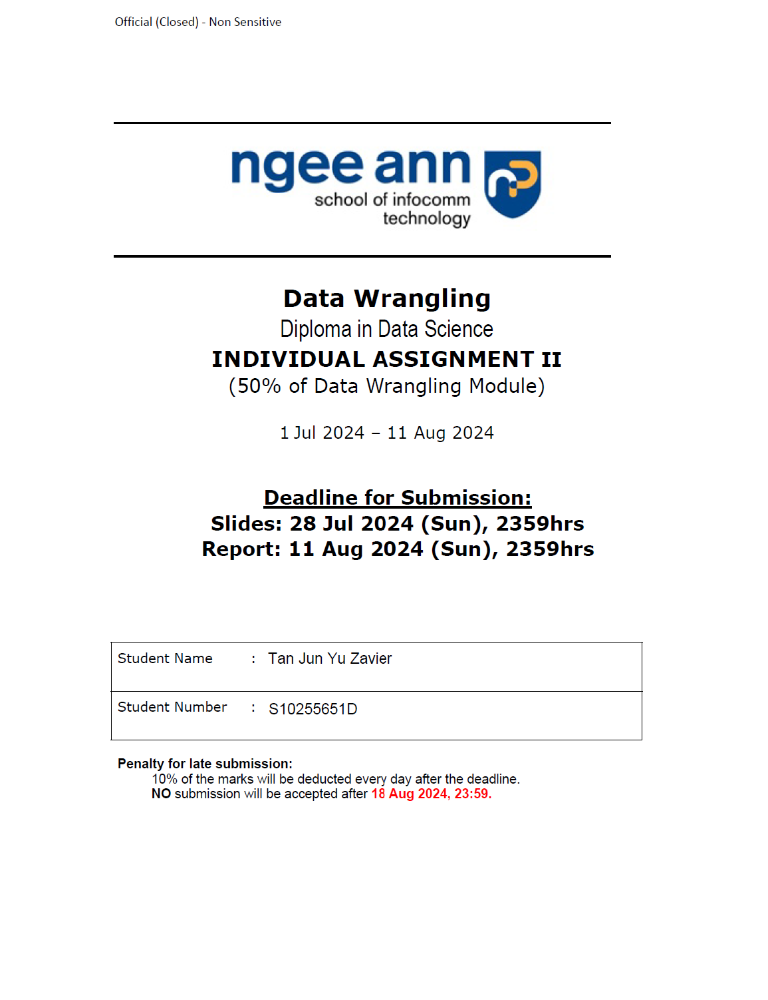

## Table of Content <a id="Table-of-Content_01"></a> 

- [Step 0: Predictive Problem](#0.0)
    - [0.1: Rationale](#0.1)
    - [0.2: Tables Used](#0.2)
    
- [Step 1: Load & Explore the Data](#1.0)
    - [1.1: Loading in Batting Data](#1.1)
    - [1.2: Loading in Pitching Data](#1.2)
    - [1.3: Loading in Salary Data](#1.3)
    - [1.4: Loading in Player Data](#1.4)
    - [1.5: Loading in Fielding Data](#1.5)

- [Step 2: Data Wrangling on Multiple Tables](#2.0)
    - [2.1: Data Exploration on Merged Data](#2.1)
    - [2.2: Quantifying Missing Data](#2.2)
    - [2.3: Categorical & Numerical Variables](#2.3)
    - [2.4: Identifying Unique Values](#2.4)
    - [2.5: Exploring Salary Relationship with Other Features](#2.5)
      - [2.5.1: Relationship between Salary & Player Attributes](#2.5.1)
      - [2.5.2: Relationship between Salary & Batting Performance](#2.5.2)
      - [2.5.3: Relationship between Salary & Pitching Performance](#2.5.3)
      - [2.5.4: Relationship between Salary & Fielding Performance](#2.5.4)
    - [2.6: Correlation Matrix](#2.6)
    
- [Step 3: Data Preprocessing](#3.0)
    - [3.1: Checking for Missing Data](#3.1)
    - [3.2: Transformation of Variables](#3.2)
      - [3.2.1: Winsorization Method](#3.2.1)
      - [3.2.2: Trimming Method](#3.2.2)
    - [3.3: Train & Test Split](#3.3)
    - [3.4: Missing Value Imputation](#3.4)
    - [3.5: Categorical Encoding](#3.5)
      - [3.5.1: Winsorization Method](#3.5.1)
      - [3.5.2: Trimming Method](#3.5.2)
    - [3.6: Yeo-Johnson Transformation](#3.6)
    - [3.7: Feature Scaling](#3.7)
      - [3.7.1: Robust Scaling](#3.7.1)
      - [3.7.2: Standardization](#3.7.2)
    - [3.8: Feature Engineering](#3.8)
      - [3.8.1: Principal Component Analysis (PCA)](#3.8.1)
      - [3.8.2: Polynomial Expansion](#3.8.2)    

    
- [Step 4: Machine Learning Modeling](#4.0)
    - [4.1: Naive Baseline Model](#4.1)
    - [4.2: Linear Regression Model](#4.2)

- [Step 5: Report](#5.0)

In [1]:
# import the pacakges
import numpy as np
import pandas as pd

# For plotting
import matplotlib.pyplot as plt
import seaborn as sns

# For linear regression
from sklearn.linear_model import LinearRegression
from sklearn import linear_model

# Sklearn preprocess
from sklearn.model_selection import train_test_split

# For the Q-Q plots
import scipy.stats as stats

# With open-source packages
from sklearn.preprocessing import FunctionTransformer
from feature_engine.transformation import PowerTransformer

# To impute missing data with sklearn
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# For discretization
from sklearn.preprocessing import KBinsDiscretizer
from feature_engine.discretisation import EqualWidthDiscretiser

# Feature engine
import feature_engine.imputation as mdi
from feature_engine.outliers import Winsorizer
from feature_engine.encoding import OneHotEncoder, MeanEncoder, OrdinalEncoder
from feature_engine.discretisation import EqualFrequencyDiscretiser
from feature_engine.transformation import YeoJohnsonTransformer
from feature_engine.encoding import CountFrequencyEncoder
from sklearn.preprocessing import PolynomialFeatures

# The scaler - for standardization
from sklearn.preprocessing import StandardScaler

# The scaler - for robust scaling
from sklearn.preprocessing import RobustScaler

# Visual
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

# Step 0: Problem Statement <a id="0.0"></a>
[Back to Content](#Table-of-Content_01)

In Major League Baseball (MLB), player salaries are a crucial aspect of team management and player negotiations. Understanding the factors that influence player salaries can provide valuable insights for team executives, players, and analysts. **This project aims to predict the salaries of MLB players using their performance metrics and biographical information.**

## 0.1 Rationale <a id="0.1"></a>

Player salaries in MLB are influenced by a myriad of factors, including on-field performance, physical attributes, and career longevity. By developing a predictive model, this project seeks to demystify the salary determination process and provide a data-driven approach to understanding player valuation. The insights gained from this analysis can aid teams in constructing competitive and financially sustainable rosters, while also empowering players with knowledge about how their efforts translate into earnings.

## 0.2 Tables Used <a id="0.2"></a>

The analysis will leverage historical data from multiple CSV files, including:
- **Salary:** Contains salary information for players over several years.
- **Batting:** Provides detailed batting performance metrics.
- **Pitching:** Includes comprehensive pitching performance data.
- **Fielding:** Contains fielding performance metrics.
- **Player:** Includes data on player birth year, height, weight, and career milestones (debut and final game dates).

# Step 1: Load and Explore the Data <a id="1.0"></a>
[Back to Content](#Table-of-Content_01)

## 1.1 Loading in Batting data <a id="1.1"></a>
[Back to Content](#Table-of-Content_01)

In [2]:
# Loading in batting csv file
batting_data = pd.read_csv('./Datasets/CSV/batting.csv')
batting_data

,player_id,year,stint,team_id,league_id,g,ab,r,h,double,...,rbi,sb,cs,bb,so,ibb,hbp,sh,sf,g_idp
0,abercda01,1871,1,TRO,NaN,1,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1,addybo01,1871,1,RC1,NaN,25,118.0,30.0,32.0,6.0,...,13.0,8.0,1.0,4.0,0.0,NaN,NaN,NaN,NaN,NaN
2,allisar01,1871,1,CL1,NaN,29,137.0,28.0,40.0,4.0,...,19.0,3.0,1.0,2.0,5.0,NaN,NaN,NaN,NaN,NaN
3,allisdo01,1871,1,WS3,NaN,27,133.0,28.0,44.0,10.0,...,27.0,1.0,1.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN
4,ansonca01,1871,1,RC1,NaN,25,120.0,29.0,39.0,11.0,...,16.0,6.0,2.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101327,zitoba01,2015,1,OAK,AL,3,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
101328,zobribe01,2015,1,OAK,AL,67,235.0,39.0,63.0,20.0,...,33.0,1.0,1.0,33.0,26.0,2.0,0.0,0.0,3.0,5.0
101329,zobribe01,2015,2,KCA,AL,59,232.0,37.0,66.0,16.0,...,23.0,2.0,3.0,29.0,30.0,1.0,1.0,0.0,2.0,3.0
101330,zuninmi01,2015,1,SEA,AL,112,350.0,28.0,61.0,11.0,...,28.0,0.0,1.0,21.0,132.0,0.0,5.0,8.0,2.0,6.0


In [3]:
batting_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101332 entries, 0 to 101331
Data columns (total 22 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   player_id  101332 non-null  object 
 1   year       101332 non-null  int64  
 2   stint      101332 non-null  int64  
 3   team_id    101332 non-null  object 
 4   league_id  100595 non-null  object 
 5   g          101332 non-null  int64  
 6   ab         96183 non-null   float64
 7   r          96183 non-null   float64
 8   h          96183 non-null   float64
 9   double     96183 non-null   float64
 10  triple     96183 non-null   float64
 11  hr         96183 non-null   float64
 12  rbi        95759 non-null   float64
 13  sb         94883 non-null   float64
 14  cs         72729 non-null   float64
 15  bb         96183 non-null   float64
 16  so         88345 non-null   float64
 17  ibb        59620 non-null   float64
 18  hbp        93373 non-null   float64
 19  sh         89845 non-nu

In [4]:
batting_data.describe()

,year,stint,g,ab,r,h,double,triple,hr,rbi,sb,cs,bb,so,ibb,hbp,sh,sf,g_idp
count,101332.000000,101332.000000,101332.000000,96183.000000,96183.000000,96183.000000,96183.000000,96183.000000,96183.000000,95759.000000,94883.000000,72729.000000,96183.000000,88345.000000,59620.000000,93373.000000,89845.000000,60151.000000,70075.000000
mean,1963.506533,1.077567,51.400111,149.970327,19.887038,39.261647,6.637067,1.373361,2.949305,17.965163,3.158184,1.324025,13.811484,21.629849,1.213234,1.113395,2.457900,1.150122,3.210032
std,38.628278,0.283676,47.145273,186.557072,28.671365,53.310941,9.801563,2.710547,6.409662,26.756514,7.922994,2.838196,21.092775,28.432978,2.894918,2.320660,4.347818,2.023981,4.835881
min,1871.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1933.000000,1.000000,13.000000,7.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1972.000000,1.000000,34.000000,57.000000,5.000000,11.000000,1.000000,0.000000,0.000000,4.000000,0.000000,0.000000,3.000000,10.000000,0.000000,0.000000,1.000000,0.000000,1.000000
75%,1997.000000,1.000000,80.250000,251.000000,30.000000,63.000000,10.000000,2.000000,3.000000,27.000000,2.000000,1.000000,20.000000,30.000000,1.000000,1.000000,3.000000,2.000000,5.000000
max,2015.000000,5.000000,165.000000,716.000000,192.000000,262.000000,67.000000,36.000000,73.000000,191.000000,138.000000,42.000000,232.000000,223.000000,120.000000,51.000000,67.000000,19.000000,36.000000


## 1.2 Loading in Pitching data <a id="1.2"></a>
[Back to Content](#Table-of-Content_01)

In [5]:
# Load in pitching csv file
pitching_data = pd.read_csv('./Datasets/CSV/pitching.csv')
pitching_data

,player_id,year,stint,team_id,league_id,w,l,g,gs,cg,...,ibb,wp,hbp,bk,bfp,gf,r,sh,sf,g_idp
0,bechtge01,1871,1,PH1,NaN,1,2,3,3,2,...,NaN,NaN,NaN,0,NaN,NaN,42,NaN,NaN,NaN
1,brainas01,1871,1,WS3,NaN,12,15,30,30,30,...,NaN,NaN,NaN,0,NaN,NaN,292,NaN,NaN,NaN
2,fergubo01,1871,1,NY2,NaN,0,0,1,0,0,...,NaN,NaN,NaN,0,NaN,NaN,9,NaN,NaN,NaN
3,fishech01,1871,1,RC1,NaN,4,16,24,24,22,...,NaN,NaN,NaN,0,NaN,NaN,257,NaN,NaN,NaN
4,fleetfr01,1871,1,NY2,NaN,0,1,1,1,1,...,NaN,NaN,NaN,0,NaN,NaN,21,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44134,youngch03,2015,1,KCA,AL,11,6,34,18,0,...,0.0,5.0,0.0,0,500.0,3.0,44,4.0,2.0,NaN
44135,zieglbr01,2015,1,ARI,NL,0,3,66,0,0,...,3.0,2.0,1.0,0,263.0,46.0,17,1.0,0.0,NaN
44136,zimmejo02,2015,1,WAS,NL,13,10,33,33,0,...,3.0,2.0,8.0,1,831.0,0.0,89,8.0,2.0,NaN
44137,zitoba01,2015,1,OAK,AL,0,0,3,2,0,...,0.0,0.0,0.0,0,37.0,1.0,8,0.0,0.0,NaN


In [6]:
pitching_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44139 entries, 0 to 44138
Data columns (total 30 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   player_id  44139 non-null  object 
 1   year       44139 non-null  int64  
 2   stint      44139 non-null  int64  
 3   team_id    44139 non-null  object 
 4   league_id  44008 non-null  object 
 5   w          44139 non-null  int64  
 6   l          44139 non-null  int64  
 7   g          44139 non-null  int64  
 8   gs         44139 non-null  int64  
 9   cg         44139 non-null  int64  
 10  sho        44139 non-null  int64  
 11  sv         44139 non-null  int64  
 12  ipouts     44138 non-null  float64
 13  h          44139 non-null  int64  
 14  er         44139 non-null  int64  
 15  hr         44139 non-null  int64  
 16  bb         44139 non-null  int64  
 17  so         44139 non-null  int64  
 18  baopp      42614 non-null  float64
 19  era        44049 non-null  float64
 20  ibb   

In [7]:
pitching_data.describe()

,year,stint,w,l,g,gs,cg,sho,sv,ipouts,...,ibb,wp,hbp,bk,bfp,gf,r,sh,sf,g_idp
count,44139.000000,44139.00000,44139.000000,44139.000000,44139.000000,44139.000000,44139.000000,44139.00000,44139.000000,44138.000000,...,29564.000000,44006.000000,43580.000000,44139.000000,43900.000000,44006.000000,44139.000000,11239.000000,11239.000000,745.000000
mean,1967.786493,1.07925,4.748794,4.748771,23.667142,9.552550,3.207979,0.45615,1.503976,255.673886,...,2.447064,2.534836,2.271111,0.303881,345.551572,6.355611,43.332291,2.207759,1.908088,4.844295
std,37.352599,0.28443,5.837989,5.007080,18.462900,12.312479,7.134955,1.11821,4.971535,258.428826,...,2.792671,3.438515,3.008115,0.759298,350.259188,10.003279,43.437952,2.751917,2.143002,5.524863
min,1871.000000,1.00000,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1940.000000,1.00000,0.000000,1.000000,7.000000,0.000000,0.000000,0.00000,0.000000,50.000000,...,0.000000,0.000000,0.000000,0.000000,64.000000,0.000000,11.000000,0.000000,0.000000,1.000000
50%,1977.000000,1.00000,2.000000,3.000000,22.000000,3.000000,0.000000,0.00000,0.000000,169.000000,...,2.000000,1.000000,1.000000,0.000000,229.000000,3.000000,29.000000,1.000000,1.000000,3.000000
75%,2000.000000,1.00000,7.000000,8.000000,35.000000,18.000000,3.000000,0.00000,1.000000,397.000000,...,4.000000,4.000000,3.000000,0.000000,540.000000,8.000000,68.000000,3.000000,3.000000,7.000000
max,2015.000000,4.00000,59.000000,48.000000,106.000000,75.000000,75.000000,16.00000,62.000000,2040.000000,...,23.000000,63.000000,41.000000,16.000000,2906.000000,84.000000,519.000000,21.000000,14.000000,36.000000


## 1.3 Loading in Salary data <a id="1.3"></a>
[Back to Content](#Table-of-Content_01)

In [8]:
# Load in salary csv file
salary_data = pd.read_csv('./Datasets/CSV/salary.csv')
salary_data

,year,team_id,league_id,player_id,salary
0,1985,ATL,NL,barkele01,870000
1,1985,ATL,NL,bedrost01,550000
2,1985,ATL,NL,benedbr01,545000
3,1985,ATL,NL,campri01,633333
4,1985,ATL,NL,ceronri01,625000
...,...,...,...,...,...
25570,2015,WAS,NL,treinbl01,512800
25571,2015,WAS,NL,ugglada01,507500
25572,2015,WAS,NL,werthja01,21000000
25573,2015,WAS,NL,zimmejo02,16500000


In [9]:
salary_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25575 entries, 0 to 25574
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   year       25575 non-null  int64 
 1   team_id    25575 non-null  object
 2   league_id  25575 non-null  object
 3   player_id  25575 non-null  object
 4   salary     25575 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 999.2+ KB


In [10]:
salary_data.describe()

,year,salary
count,25575.000000,2.557500e+04
mean,2000.374389,2.008563e+06
std,8.610604,3.315706e+06
min,1985.000000,0.000000e+00
25%,1993.000000,2.750000e+05
50%,2000.000000,5.500000e+05
75%,2008.000000,2.250000e+06
max,2015.000000,3.300000e+07


## 1.4 Loading in Player data <a id="1.4"></a>
[Back to Content](#Table-of-Content_01)

In [11]:
# Load in player csv file 
player_data = pd.read_csv('./Datasets/CSV/player.csv')
player_data

,player_id,birth_year,birth_month,birth_day,birth_country,birth_state,birth_city,death_year,death_month,death_day,...,name_last,name_given,weight,height,bats,throws,debut,final_game,retro_id,bbref_id
0,aardsda01,1981.0,12.0,27.0,USA,CO,Denver,NaN,NaN,NaN,...,Aardsma,David Allan,220.0,75.0,R,R,2004-04-06,2015-08-23,aardd001,aardsda01
1,aaronha01,1934.0,2.0,5.0,USA,AL,Mobile,NaN,NaN,NaN,...,Aaron,Henry Louis,180.0,72.0,R,R,1954-04-13,1976-10-03,aaroh101,aaronha01
2,aaronto01,1939.0,8.0,5.0,USA,AL,Mobile,1984.0,8.0,16.0,...,Aaron,Tommie Lee,190.0,75.0,R,R,1962-04-10,1971-09-26,aarot101,aaronto01
3,aasedo01,1954.0,9.0,8.0,USA,CA,Orange,NaN,NaN,NaN,...,Aase,Donald William,190.0,75.0,R,R,1977-07-26,1990-10-03,aased001,aasedo01
4,abadan01,1972.0,8.0,25.0,USA,FL,Palm Beach,NaN,NaN,NaN,...,Abad,Fausto Andres,184.0,73.0,L,L,2001-09-10,2006-04-13,abada001,abadan01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18841,zupofr01,1939.0,8.0,29.0,USA,CA,San Francisco,2005.0,3.0,25.0,...,Zupo,Frank Joseph,182.0,71.0,L,R,1957-07-01,1961-05-09,zupof101,zupofr01
18842,zuvelpa01,1958.0,10.0,31.0,USA,CA,San Mateo,NaN,NaN,NaN,...,Zuvella,Paul,173.0,72.0,R,R,1982-09-04,1991-05-02,zuvep001,zuvelpa01
18843,zuverge01,1924.0,8.0,20.0,USA,MI,Holland,2014.0,9.0,8.0,...,Zuverink,George,195.0,76.0,R,R,1951-04-21,1959-06-15,zuveg101,zuverge01
18844,zwilldu01,1888.0,11.0,2.0,USA,MO,St. Louis,1978.0,3.0,27.0,...,Zwilling,Edward Harrison,160.0,66.0,L,L,1910-08-14,1916-07-12,zwild101,zwilldu01


In [12]:
player_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18846 entries, 0 to 18845
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   player_id      18846 non-null  object 
 1   birth_year     18703 non-null  float64
 2   birth_month    18531 non-null  float64
 3   birth_day      18382 non-null  float64
 4   birth_country  18773 non-null  object 
 5   birth_state    18220 non-null  object 
 6   birth_city     18647 non-null  object 
 7   death_year     9336 non-null   float64
 8   death_month    9335 non-null   float64
 9   death_day      9334 non-null   float64
 10  death_country  9329 non-null   object 
 11  death_state    9277 non-null   object 
 12  death_city     9325 non-null   object 
 13  name_first     18807 non-null  object 
 14  name_last      18846 non-null  object 
 15  name_given     18807 non-null  object 
 16  weight         17975 non-null  float64
 17  height         18041 non-null  float64
 18  bats  

In [13]:
# Convert debut and final_game to datetime
player_data['debut'] = pd.to_datetime(player_data['debut'])
player_data['final_game'] = pd.to_datetime(player_data['final_game'])

In [14]:
player_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18846 entries, 0 to 18845
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   player_id      18846 non-null  object        
 1   birth_year     18703 non-null  float64       
 2   birth_month    18531 non-null  float64       
 3   birth_day      18382 non-null  float64       
 4   birth_country  18773 non-null  object        
 5   birth_state    18220 non-null  object        
 6   birth_city     18647 non-null  object        
 7   death_year     9336 non-null   float64       
 8   death_month    9335 non-null   float64       
 9   death_day      9334 non-null   float64       
 10  death_country  9329 non-null   object        
 11  death_state    9277 non-null   object        
 12  death_city     9325 non-null   object        
 13  name_first     18807 non-null  object        
 14  name_last      18846 non-null  object        
 15  name_given     1880

In [15]:
player_data.describe()

,birth_year,birth_month,birth_day,death_year,death_month,death_day,weight,height,debut,final_game
count,18703.000000,18531.000000,18382.000000,9336.000000,9335.000000,9334.000000,17975.000000,18041.000000,18653,18653
mean,1930.664118,6.627327,15.609020,1963.850364,6.484092,15.570281,185.980862,72.255640,1955-04-23 20:48:46.628424384,1960-02-18 22:25:35.109633856
min,1820.000000,1.000000,1.000000,1872.000000,1.000000,1.000000,65.000000,43.000000,1871-05-04 00:00:00,1871-05-05 00:00:00
25%,1894.000000,4.000000,8.000000,1942.000000,3.000000,8.000000,170.000000,71.000000,1918-04-25 00:00:00,1922-09-05 00:00:00
50%,1936.000000,7.000000,16.000000,1966.000000,6.000000,15.000000,185.000000,72.000000,1960-04-22 00:00:00,1965-09-12 00:00:00
75%,1968.000000,10.000000,23.000000,1989.000000,10.000000,23.000000,200.000000,74.000000,1993-08-21 00:00:00,1999-09-30 00:00:00
max,1995.000000,12.000000,31.000000,2016.000000,12.000000,31.000000,320.000000,83.000000,2015-10-03 00:00:00,2015-10-04 00:00:00
std,41.229079,3.467110,8.748942,31.506369,3.528685,8.778580,21.226988,2.598983,NaN,NaN


## 1.5 Loading in Fielding data <a id="1.5"></a>
[Back to Content](#Table-of-Content_01)

In [16]:
# Load in Fielding csv file 
fielding_data = pd.read_csv('./Datasets/CSV/fielding.csv')
fielding_data

,player_id,year,stint,team_id,league_id,pos,g,gs,inn_outs,po,a,e,dp,pb,wp,sb,cs,zr
0,abercda01,1871,1,TRO,NaN,SS,1,NaN,NaN,1.0,3.0,2.0,0.0,NaN,NaN,NaN,NaN,NaN
1,addybo01,1871,1,RC1,NaN,2B,22,NaN,NaN,67.0,72.0,42.0,5.0,NaN,NaN,NaN,NaN,NaN
2,addybo01,1871,1,RC1,NaN,SS,3,NaN,NaN,8.0,14.0,7.0,0.0,NaN,NaN,NaN,NaN,NaN
3,allisar01,1871,1,CL1,NaN,2B,2,NaN,NaN,1.0,4.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
4,allisar01,1871,1,CL1,NaN,OF,29,NaN,NaN,51.0,3.0,7.0,1.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170521,younger03,2015,1,ATL,NL,OF,22,NaN,NaN,45.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
170522,younger03,2015,2,NYN,NL,OF,7,NaN,NaN,5.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
170523,zimmery01,2015,1,WAS,NL,OF,1,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
170524,zobribe01,2015,1,OAK,AL,OF,29,NaN,NaN,39.0,0.0,3.0,0.0,NaN,NaN,NaN,NaN,NaN


In [17]:
fielding_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170526 entries, 0 to 170525
Data columns (total 18 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   player_id  170526 non-null  object 
 1   year       170526 non-null  int64  
 2   stint      170526 non-null  int64  
 3   team_id    170526 non-null  object 
 4   league_id  169023 non-null  object 
 5   pos        170526 non-null  object 
 6   g          170526 non-null  int64  
 7   gs         75849 non-null   float64
 8   inn_outs   102313 non-null  float64
 9   po         156409 non-null  float64
 10  a          156408 non-null  float64
 11  e          156407 non-null  float64
 12  dp         156408 non-null  float64
 13  pb         11116 non-null   float64
 14  wp         4189 non-null    float64
 15  sb         6024 non-null    float64
 16  cs         6024 non-null    float64
 17  zr         4189 non-null    float64
dtypes: float64(11), int64(3), object(4)
memory usage: 23.4+ MB


In [18]:
fielding_data.describe()

,year,stint,g,gs,inn_outs,po,a,e,dp,pb,wp,sb,cs,zr
count,170526.000000,170526.000000,170526.000000,75849.000000,102313.000000,156409.000000,156408.000000,156407.000000,156408.000000,11116.000000,4189.000000,6024.000000,6024.000000,4189.000000
mean,1966.517123,1.077818,33.651854,26.930823,708.231134,79.463496,30.826198,3.512093,6.349017,5.167326,11.772977,24.909031,12.066899,0.703032
std,38.550401,0.283581,41.117359,40.790139,1061.423810,176.463601,75.011893,7.534450,18.388112,9.116445,12.249974,25.816811,13.222888,1.394882
min,1871.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1941.000000,1.000000,4.000000,1.000000,54.000000,2.000000,1.000000,0.000000,0.000000,0.000000,2.000000,4.000000,1.000000,0.000000
50%,1977.000000,1.000000,16.000000,7.000000,220.000000,10.000000,5.000000,1.000000,1.000000,2.000000,8.000000,17.000000,8.000000,0.000000
75%,1998.000000,1.000000,45.000000,32.000000,754.000000,72.000000,22.000000,3.000000,3.000000,6.000000,19.000000,39.000000,19.000000,1.000000
max,2015.000000,5.000000,165.000000,164.000000,4469.000000,1846.000000,641.000000,119.000000,194.000000,105.000000,69.000000,155.000000,89.000000,15.000000


# Step 2: Data Wrangling on Multiple Tables <a id="2.0"></a>
[Back to Content](#Table-of-Content_01)

In [19]:
# Verify the number of rows before and after each merge
print(f"Initial batting_data rows: {batting_data.shape[0]}")
print(f"Initial pitching_data rows: {pitching_data.shape[0]}")
print(f"Initial fielding_data rows: {fielding_data.shape[0]}")
print(f"Initial player_data rows: {player_data.shape[0]}")
print(f"Initial salary_data rows: {salary_data.shape[0]}")

Initial batting_data rows: 101332
Initial pitching_data rows: 44139
Initial fielding_data rows: 170526
Initial player_data rows: 18846
Initial salary_data rows: 25575


In [20]:
# Subset the salary data to include relevant columns
salary_data = salary_data[['player_id', 'year', 'team_id', 'league_id', 'salary']]

salary_data.head()

,player_id,year,team_id,league_id,salary
0,barkele01,1985,ATL,NL,870000
1,bedrost01,1985,ATL,NL,550000
2,benedbr01,1985,ATL,NL,545000
3,campri01,1985,ATL,NL,633333
4,ceronri01,1985,ATL,NL,625000


In [21]:
# Subset the player data to include relevant columns
player_data = player_data[['player_id', 'birth_year', 'weight', 'height', 'bats', 'throws']]

player_data.head()

,player_id,birth_year,weight,height,bats,throws
0,aardsda01,1981.0,220.0,75.0,R,R
1,aaronha01,1934.0,180.0,72.0,R,R
2,aaronto01,1939.0,190.0,75.0,R,R
3,aasedo01,1954.0,190.0,75.0,R,R
4,abadan01,1972.0,184.0,73.0,L,L


In [22]:
# Aggregate batting statistics by player and year
batting_data = batting_data.groupby(['player_id', 'year']).agg({
    'g': 'sum', 'ab': 'sum', 'r': 'sum', 'h': 'sum', 'double': 'sum', 'triple': 'sum',
    'hr': 'sum', 'rbi': 'sum', 'sb': 'sum', 'cs': 'sum', 'bb': 'sum', 'so': 'sum',
    'ibb': 'sum', 'hbp': 'sum'
}).reset_index()

batting_data.head()

,player_id,year,g,ab,r,h,double,triple,hr,rbi,sb,cs,bb,so,ibb,hbp
0,aardsda01,2004,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,aardsda01,2006,45,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,aardsda01,2007,25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,aardsda01,2008,47,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,aardsda01,2009,73,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
# Aggregate pitching statistics by player and year
pitching_data = pitching_data.groupby(['player_id', 'year']).agg({
    'g': 'sum', 'gs': 'sum', 'w': 'sum', 'l': 'sum', 'cg': 'sum', 'sho': 'sum',
    'sv': 'sum', 'ipouts': 'sum', 'h': 'sum', 'er': 'sum', 'hr': 'sum', 'bb': 'sum',
    'so': 'sum', 'baopp': 'mean', 'era': 'mean', 'ibb': 'sum', 'wp': 'sum',
    'hbp': 'sum'
}).reset_index()

pitching_data.head()

,player_id,year,g,gs,w,l,cg,sho,sv,ipouts,h,er,hr,bb,so,baopp,era,ibb,wp,hbp
0,aardsda01,2004,11,0,1,0,0,0,0,32.0,20,8,1,10,5,0.417,6.75,0.0,0.0,2.0
1,aardsda01,2006,45,0,3,0,0,0,0,159.0,41,24,9,28,49,0.214,4.08,0.0,1.0,1.0
2,aardsda01,2007,25,0,2,1,0,0,0,97.0,39,23,4,17,36,0.300,6.40,3.0,2.0,1.0
3,aardsda01,2008,47,0,4,2,0,0,0,146.0,49,30,4,35,49,0.268,5.55,2.0,3.0,5.0
4,aardsda01,2009,73,0,3,6,0,0,38,214.0,49,20,4,34,80,0.189,2.52,3.0,2.0,0.0


In [24]:
# Aggregate fielding statistics by player and year
fielding_data = fielding_data.groupby(['player_id', 'year']).agg({
    'g': 'sum', 'gs': 'sum', 'po': 'sum', 'a': 'sum',
    'e': 'sum', 'dp': 'sum', 'sb': 'sum', 'cs': 'sum',
    'zr': 'mean'
}).reset_index()

fielding_data.head()

,player_id,year,g,gs,po,a,e,dp,sb,cs,zr
0,aardsda01,2004,11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,aardsda01,2006,45,0.0,1.0,5.0,0.0,1.0,0.0,0.0,NaN
2,aardsda01,2007,25,0.0,2.0,4.0,1.0,0.0,0.0,0.0,NaN
3,aardsda01,2008,47,0.0,3.0,6.0,0.0,0.0,0.0,0.0,NaN
4,aardsda01,2009,73,0.0,2.0,5.0,0.0,1.0,0.0,0.0,NaN


In [25]:
# Rename columns to avoid confusion
batting_data.columns = ['batting_' + col if col not in ['player_id', 'year'] else col for col in batting_data.columns]
pitching_data.columns = ['pitching_' + col if col not in ['player_id', 'year'] else col for col in pitching_data.columns]
fielding_data.columns = ['fielding_' + col if col not in ['player_id', 'year'] else col for col in fielding_data.columns]

Renaming the columns in different data frames is crucial for avoiding confusion when working with multiple datasets that have overlapping column names.

In [26]:
%%time
# Merge salary data with player data
merged_df = pd.merge(salary_data, player_data, on='player_id')

# Merge with aggregated batting data
#merged_df = pd.merge(merged_df, batting_data, on=['player_id', 'year'], how='left')
merged_df = pd.merge(merged_df, batting_data, on=['player_id', 'year'], how='outer')

# Merge with aggregated pitching data
#merged_df = pd.merge(merged_df, pitching_data, on=['player_id', 'year'], how='left')
merged_df = pd.merge(merged_df, pitching_data, on=['player_id', 'year'], how='outer')

# Merge with aggregated fielding data
#merged_df = pd.merge(merged_df, fielding_data, on=['player_id', 'year'], how='left')
merged_df = pd.merge(merged_df, fielding_data, on=['player_id', 'year'], how='outer')

CPU times: total: 172 ms
Wall time: 222 ms


The decision to use an outer join when merging the data frames is crucial to ensure that no data is inadvertently excluded during the merge process. The code shows that an outer join is applied when merging salary data, batting data, pitching data, and fielding data with the player data on the 'player_id' and 'year' columns. An outer join includes all records from both data frames being merged, even if there is no matching key in one of the data frames. This is important in this context because not all players may have data in every category (batting, pitching, fielding) for every year. This prevents loss of data, especially for players who may have only participated in certain activities in a given year.

In [27]:
# Create new features, for example, player's age
merged_df['age'] = merged_df['year'] - merged_df['birth_year']

Calculating the player's age is essential for understanding how a player's performance, experience, and physical condition might correlate with their age. Age is often a critical factor in sports analytics, as it can impact a player's capabilities, career longevity, and salary negotiations. By including age as a feature, it allows for more nuanced analysis and can help in building predictive models that account for the varying impacts of age on different players.

In [28]:
# Identify for any  duplicate columns
def identify_duplicate_columns(df):
    duplicates = {}
    for col in df.columns:
        if col in duplicates:
            duplicates[col].append(col)
        else:
            duplicates[col] = [col]
    return [key for key, values in duplicates.items() if len(values) > 1]

In [29]:
# Identify duplicate columns
duplicate_columns = identify_duplicate_columns(merged_df)
print(f"Duplicate columns: {duplicate_columns}")

Duplicate columns: []


In [30]:
# Handle missing values
merged_df.fillna(0, inplace=True)

In [31]:
merged_df.head()

,player_id,year,team_id,league_id,salary,birth_year,weight,height,bats,throws,...,fielding_g,fielding_gs,fielding_po,fielding_a,fielding_e,fielding_dp,fielding_sb,fielding_cs,fielding_zr,age
0,aardsda01,2004,SFN,NL,300000.0,1981.0,220.0,75.0,R,R,...,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0
1,aardsda01,2006,0,0,0.0,0.0,0.0,0.0,0,0,...,45.0,0.0,1.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0
2,aardsda01,2007,CHA,AL,387500.0,1981.0,220.0,75.0,R,R,...,25.0,0.0,2.0,4.0,1.0,0.0,0.0,0.0,0.0,26.0
3,aardsda01,2008,BOS,AL,403250.0,1981.0,220.0,75.0,R,R,...,47.0,0.0,3.0,6.0,0.0,0.0,0.0,0.0,0.0,27.0
4,aardsda01,2009,SEA,AL,419000.0,1981.0,220.0,75.0,R,R,...,73.0,0.0,2.0,5.0,0.0,1.0,0.0,0.0,0.0,28.0


In [32]:
# Check how many rows and columns there are in the new merged dataset.
num_rows, num_columns = merged_df.shape
print(f'The merged DataFrame has {num_rows} rows and {num_columns} columns.')

The merged DataFrame has 94785 rows and 52 columns.


## 2.1 Data Exploration on Merged Data <a id="2.1"></a>
[Back to Content](#Table-of-Content_01)

In [33]:
merged_df.head(20)

,player_id,year,team_id,league_id,salary,birth_year,weight,height,bats,throws,...,fielding_g,fielding_gs,fielding_po,fielding_a,fielding_e,fielding_dp,fielding_sb,fielding_cs,fielding_zr,age
0,aardsda01,2004,SFN,NL,300000.0,1981.0,220.0,75.0,R,R,...,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0
1,aardsda01,2006,0,0,0.0,0.0,0.0,0.0,0,0,...,45.0,0.0,1.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0
2,aardsda01,2007,CHA,AL,387500.0,1981.0,220.0,75.0,R,R,...,25.0,0.0,2.0,4.0,1.0,0.0,0.0,0.0,0.0,26.0
3,aardsda01,2008,BOS,AL,403250.0,1981.0,220.0,75.0,R,R,...,47.0,0.0,3.0,6.0,0.0,0.0,0.0,0.0,0.0,27.0
4,aardsda01,2009,SEA,AL,419000.0,1981.0,220.0,75.0,R,R,...,73.0,0.0,2.0,5.0,0.0,1.0,0.0,0.0,0.0,28.0
5,aardsda01,2010,SEA,AL,2750000.0,1981.0,220.0,75.0,R,R,...,53.0,0.0,2.0,3.0,1.0,0.0,0.0,0.0,0.0,29.0
6,aardsda01,2011,SEA,AL,4500000.0,1981.0,220.0,75.0,R,R,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0
7,aardsda01,2012,NYA,AL,500000.0,1981.0,220.0,75.0,R,R,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0
8,aardsda01,2013,0,0,0.0,0.0,0.0,0.0,0,0,...,43.0,0.0,1.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0
9,aardsda01,2015,0,0,0.0,0.0,0.0,0.0,0,0,...,33.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


In [34]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94785 entries, 0 to 94784
Data columns (total 52 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   player_id        94785 non-null  object 
 1   year             94785 non-null  int64  
 2   team_id          94785 non-null  object 
 3   league_id        94785 non-null  object 
 4   salary           94785 non-null  float64
 5   birth_year       94785 non-null  float64
 6   weight           94785 non-null  float64
 7   height           94785 non-null  float64
 8   bats             94785 non-null  object 
 9   throws           94785 non-null  object 
 10  batting_g        94785 non-null  float64
 11  batting_ab       94785 non-null  float64
 12  batting_r        94785 non-null  float64
 13  batting_h        94785 non-null  float64
 14  batting_double   94785 non-null  float64
 15  batting_triple   94785 non-null  float64
 16  batting_hr       94785 non-null  float64
 17  batting_rbi 

In [35]:
merged_df.describe()

,year,salary,birth_year,weight,height,batting_g,batting_ab,batting_r,batting_h,batting_double,...,fielding_g,fielding_gs,fielding_po,fielding_a,fielding_e,fielding_dp,fielding_sb,fielding_cs,fielding_zr,age
count,94785.000000,9.478500e+04,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000,...,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000,94785.000000
mean,1963.784069,5.414974e+05,531.617556,53.492525,19.825489,55.012491,152.303381,20.195590,39.870507,6.740170,...,60.613082,21.590631,131.238867,50.899763,5.798555,10.482724,1.587677,0.769098,0.030293,7.955795
std,38.507061,1.938333e+06,874.738006,88.776521,32.642429,48.230840,190.499456,29.163927,54.292926,9.974273,...,65.363899,52.855536,233.906844,96.543567,10.201679,23.551160,8.989351,4.478685,0.323299,13.272853
min,1871.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1933.000000,0.000000e+00,0.000000,0.000000,0.000000,14.000000,5.000000,0.000000,0.000000,0.000000,...,13.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1973.000000,0.000000e+00,0.000000,0.000000,0.000000,37.000000,55.000000,5.000000,10.000000,1.000000,...,36.000000,0.000000,16.000000,13.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,1997.000000,1.100000e+05,1957.000000,170.000000,70.000000,90.000000,265.000000,31.000000,67.000000,11.000000,...,90.000000,10.000000,176.000000,42.000000,7.000000,6.000000,0.000000,0.000000,0.000000,24.000000
max,2015.000000,3.300000e+07,1994.000000,305.000000,83.000000,165.000000,716.000000,192.000000,262.000000,67.000000,...,390.000000,328.000000,1846.000000,643.000000,122.000000,194.000000,155.000000,89.000000,15.000000,82.000000


In [36]:
print("Data types:")
merged_df.dtypes

Data types:


player_id           object
year                 int64
team_id             object
league_id           object
salary             float64
birth_year         float64
weight             float64
height             float64
bats                object
throws              object
batting_g          float64
batting_ab         float64
batting_r          float64
batting_h          float64
batting_double     float64
batting_triple     float64
batting_hr         float64
batting_rbi        float64
batting_sb         float64
batting_cs         float64
batting_bb         float64
batting_so         float64
batting_ibb        float64
batting_hbp        float64
pitching_g         float64
pitching_gs        float64
pitching_w         float64
pitching_l         float64
pitching_cg        float64
pitching_sho       float64
pitching_sv        float64
pitching_ipouts    float64
pitching_h         float64
pitching_er        float64
pitching_hr        float64
pitching_bb        float64
pitching_so        float64
p

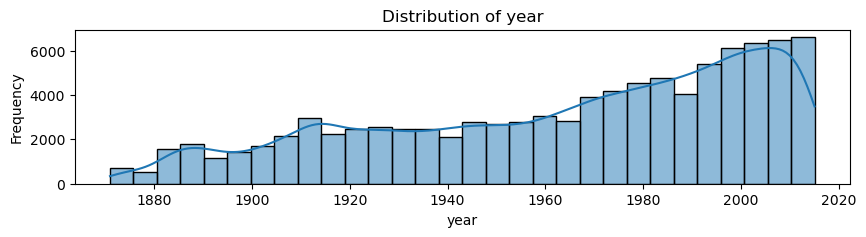

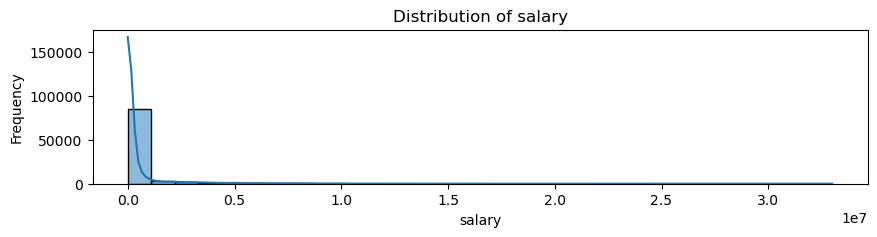

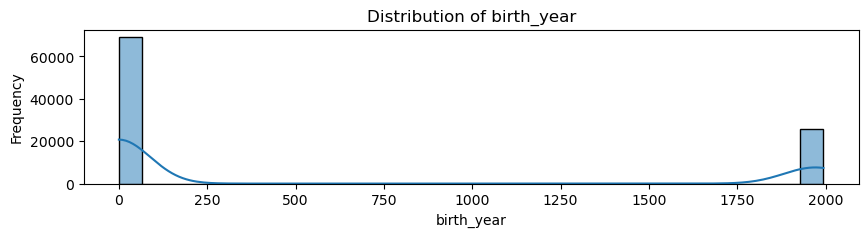

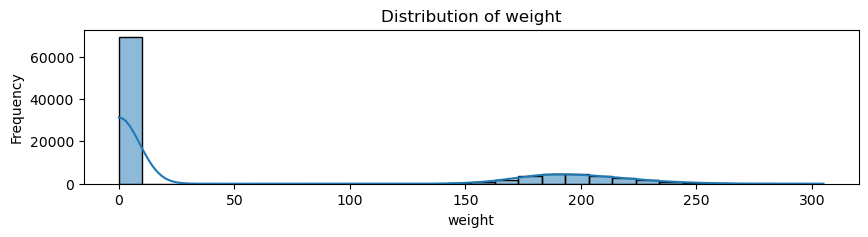

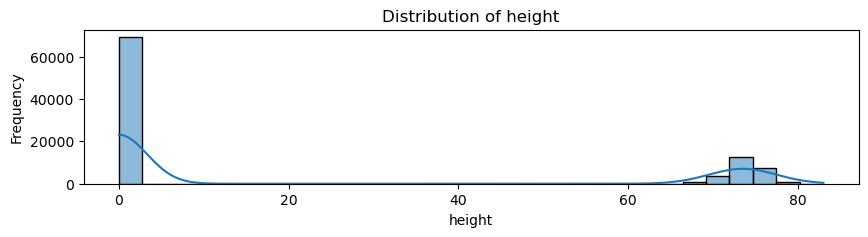

...

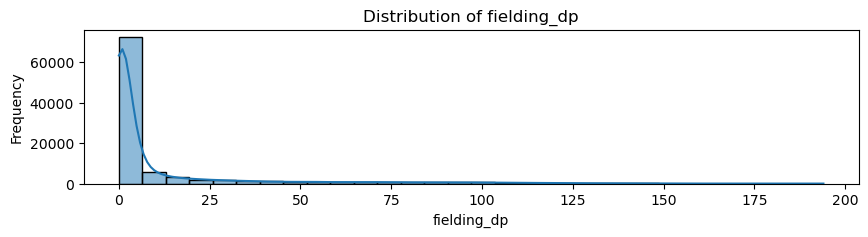

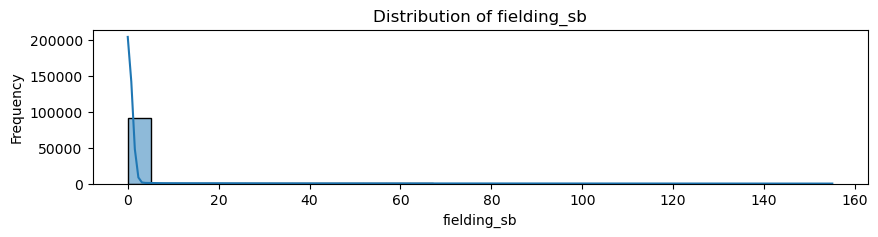

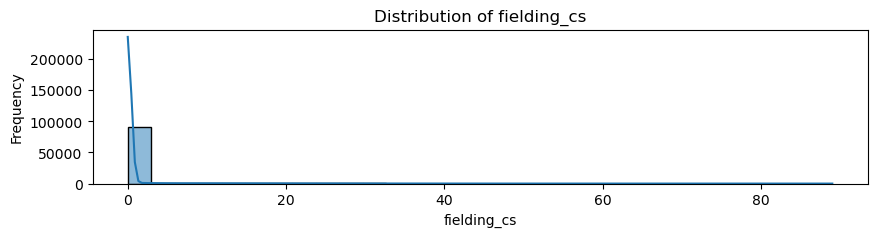

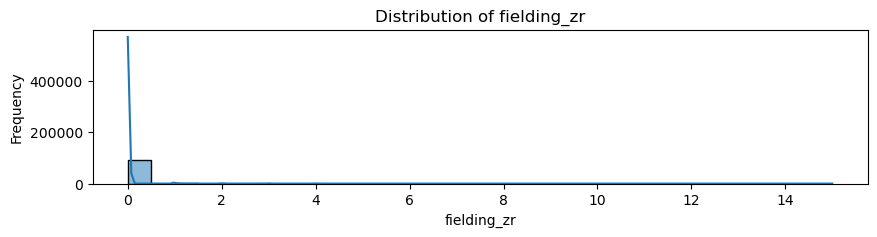

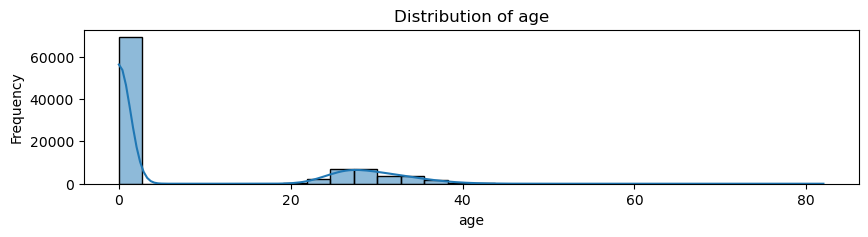

In [37]:
# plot the histogram to the numerical variables
for i in merged_df.select_dtypes(include="number").columns:
    plt.figure(figsize=(10, 2))
    sns.histplot(data=merged_df, x=i, bins=30, kde=True, edgecolor='k')
    plt.title(f'Distribution of {i}')
    plt.xlabel(i)
    plt.ylabel('Frequency')
    plt.show()

## 2.2 Quanitfying missing data <a id="2.2"></a>
[Back to Content](#Table-of-Content_01)

In [38]:
# I will check the total number and mean percentage of missing values first

# Quantify the total number of missing values
missing_data = merged_df.isnull().sum()

# Quantify the mean of missing values
missing_data_mean = merged_df.isnull().mean()
missing_data_mean_percent = missing_data_mean * 100

# Now I will combine them side by side for easy viewing.
missing_values_summary = pd.DataFrame({'Missing Values': missing_data,'Mean Percentage': missing_data_mean_percent})

# To sort by 'Missing Values' in ascending order
missing_values_summary = missing_values_summary.sort_values(by='Missing Values')

missing_values_summary

,Missing Values,Mean Percentage
player_id,0,0.0
pitching_cg,0,0.0
pitching_sho,0,0.0
pitching_sv,0,0.0
pitching_ipouts,0,0.0
pitching_h,0,0.0
pitching_er,0,0.0
pitching_hr,0,0.0
pitching_bb,0,0.0
pitching_so,0,0.0


## 2.3 Categorical & Numerical Variables <a id="2.3"></a>
[Back to Content](#Table-of-Content_01)

In [39]:
# Find categorical variables
cat_cols = [c for c in merged_df.columns if merged_df[c].dtypes == 'O']

# Calculate the sum and mean (percentage) of missing values
missing_sum = merged_df[cat_cols].isnull().sum()
missing_mean = merged_df[cat_cols].isnull().mean() * 100

missing_summary_cat = pd.DataFrame({'Missing Values': missing_sum,'Mean Percentage': missing_mean})

# To sort by 'Missing Values' in ascending order
missing_summary_cat = missing_summary_cat.sort_values(by='Missing Values')

missing_summary_cat

,Missing Values,Mean Percentage
player_id,0,0.0
team_id,0,0.0
league_id,0,0.0
bats,0,0.0
throws,0,0.0


In [40]:
# Find numerical variables
num_cols = [n for n in merged_df.columns if merged_df[n].dtypes != 'O']

# Calculate the sum and mean (percentage) of missing values
missing_sum_num = merged_df[num_cols].isnull().sum()
missing_mean_num = merged_df[num_cols].isnull().mean() * 100

missing_summary_num = pd.DataFrame({'Missing Values': missing_sum_num,'Mean Percentage': missing_mean_num})

# To sort by 'Missing Values' in ascending order
missing_summary_num = missing_summary_num.sort_values(by='Missing Values')

missing_summary_num

,Missing Values,Mean Percentage
year,0,0.0
pitching_sv,0,0.0
pitching_ipouts,0,0.0
pitching_h,0,0.0
pitching_er,0,0.0
pitching_hr,0,0.0
pitching_bb,0,0.0
pitching_so,0,0.0
pitching_baopp,0,0.0
pitching_era,0,0.0


## 2.4 Identify Unique Values <a id="2.4"></a>
[Back to Content](#Table-of-Content_01)

In [41]:
# Get the number of unique values for each column
unique_counts = merged_df.nunique()

# Get the total number of rows
total_rows = len(merged_df)

# Calculate the number of repeated values for each column
repeated_counts = total_rows - unique_counts

# Create a summary DataFrame
unique_summary = pd.DataFrame({'Unique Values': unique_counts,'Total Rows': total_rows,'Repeated Values': repeated_counts})

# Display the summary
unique_summary = unique_summary.sort_values(by='Repeated Values', ascending=False)
print("Unique values and repetition summary:")
unique_summary

Unique values and repetition summary:


,Unique Values,Total Rows,Repeated Values
throws,3,94785,94782
league_id,3,94785,94782
bats,4,94785,94781
pitching_sho,15,94785,94770
fielding_zr,18,94785,94767
height,19,94785,94766
pitching_ibb,23,94785,94762
batting_triple,32,94785,94753
pitching_hbp,35,94785,94750
age,36,94785,94749


## 2.5 Explore Salary Relationship with Other Features <a id="2.5"></a>
[Back to Content](#Table-of-Content_01)

### 2.5.1 Relationship between Salary & Player Attributes <a id="2.5.1"></a>
[Back to Content](#Table-of-Content_01)

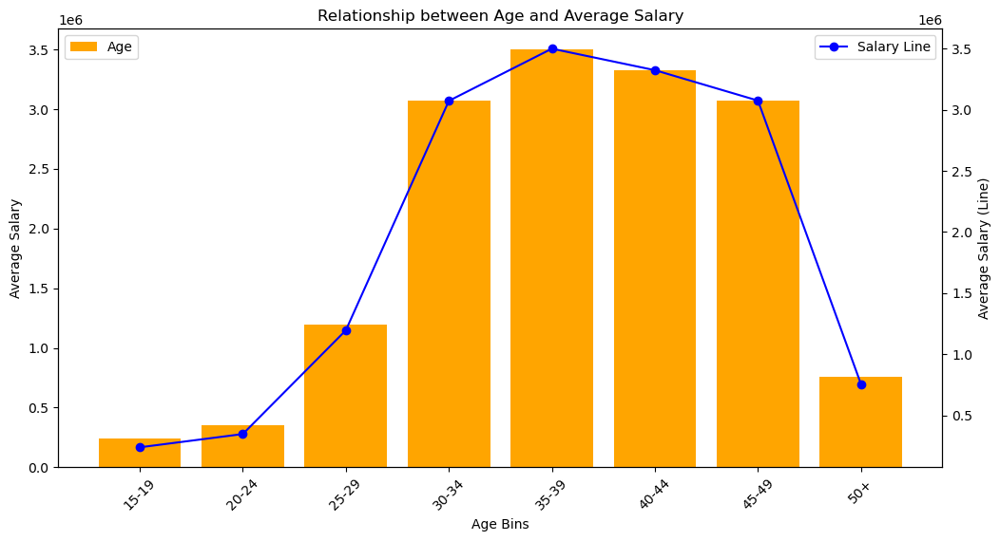

In [42]:
# Define age bins and labels
bins = list(range(15, 51, 5)) + [60]  # Bins of 5 years up to 50, and a final bin for ages 50+
labels = [f'{i}-{i+4}' for i in range(15, 50, 5)] + ['50+']

# Bin the ages temporarily
temp_df = merged_df.copy()
temp_df['age_bin'] = pd.cut(temp_df['age'], bins=bins, labels=labels, right=False, include_lowest=True)

# Group the data by 'age_bin' and calculate the mean salary
grouped_data = temp_df.groupby('age_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars = ax1.bar(grouped_data['age_bin'], grouped_data['salary'], color='orange', label='Age')
ax1.set_xlabel('Age Bins')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Age and Average Salary')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Create the line chart
ax2 = ax1.twinx()
line = ax2.plot(grouped_data['age_bin'], grouped_data['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Performance Peak and Decline**: Players' performance often peaks in their late 20s to early 30s, after which it may decline. Understanding a player's age helps in predicting future performance and career longevity.
- **Injury Risk**: Older players may be more prone to injuries, which can affect their availability and performance.
- **Contract Negotiations**: Teams often consider age when negotiating contracts, as younger players may be seen as having more potential and longer careers ahead, while older players might be viewed as higher risk investments.

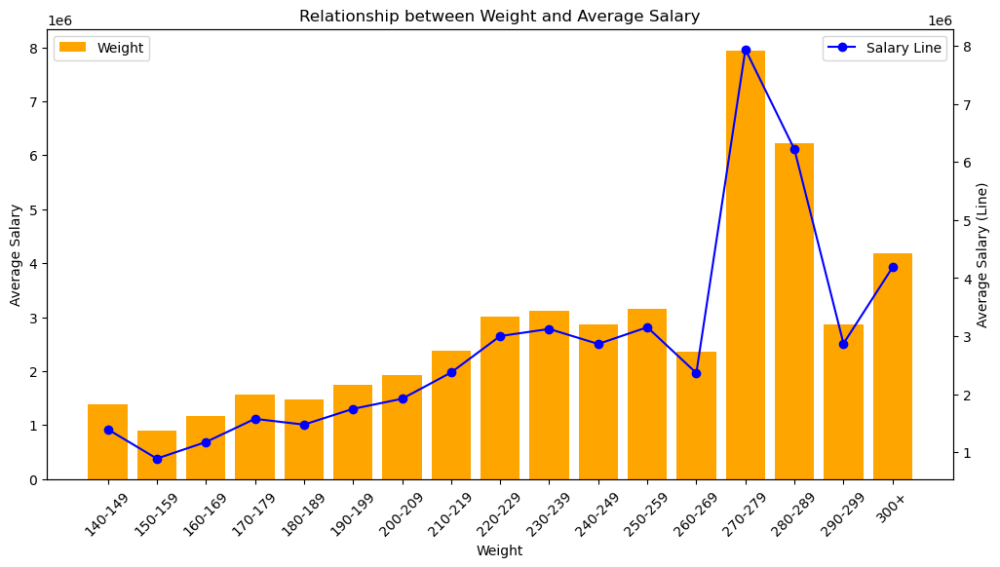

In [43]:
# Define weight bins
bins = [140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310]
labels = ['140-149', '150-159', '160-169', '170-179', '180-189', '190-199', '200-209', '210-219', '220-229', '230-239', '240-249', '250-259', '260-269', '270-279', '280-289', '290-299', '300+']

# Bin the weights
temp_df = merged_df.copy()
temp_df['weight_bin'] = pd.cut(temp_df['weight'], bins=bins, labels=labels, right=False)

# Group the data by 'weight_bin' and calculate the mean salary
grouped_data = temp_df.groupby('weight_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars = ax1.bar(grouped_data['weight_bin'], grouped_data['salary'], color='orange', label='Weight')
ax1.set_xlabel('Weight')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Weight and Average Salary')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Create the line chart
ax2 = ax1.twinx()
line = ax2.plot(grouped_data['weight_bin'], grouped_data['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Strength and Power**: Weight can correlate with a player's strength and power, which are important for batting (hitting home runs) and pitching (throwing fast pitches).
- **Speed and Agility**: While some weight is beneficial for strength, too much weight can negatively affect a player's speed and agility, which are crucial for base running and fielding.
- **Injury Risk and Health**: Maintaining an optimal weight is important for overall health and injury prevention. Overweight or underweight players may be more prone to injuries.

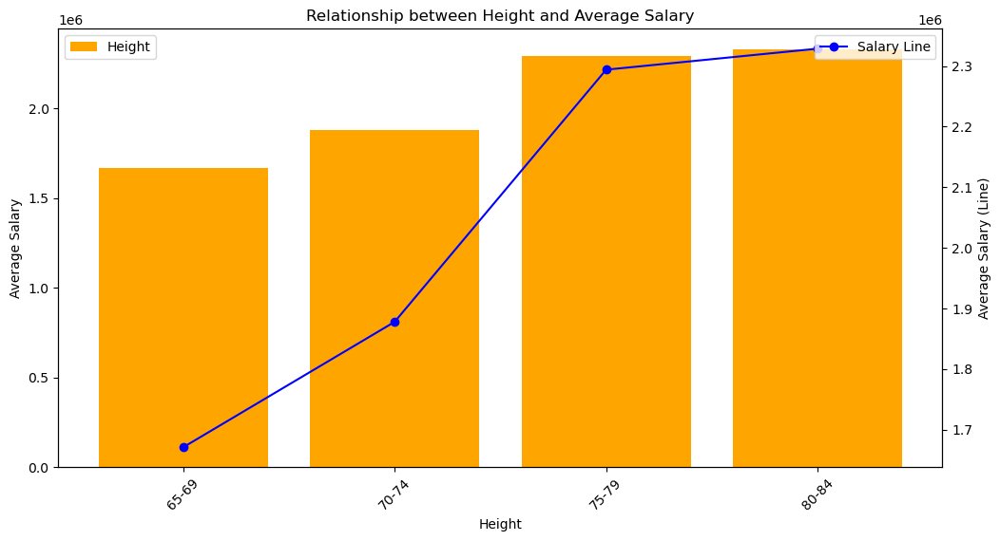

In [44]:
# Define height bins
bins = list(range(60, 86, 5))  # Bins of 5 inches from 60 to 85 inches
labels = [f'{i}-{i+4}' for i in range(60, 81, 5)]  # Labels should be one fewer than bins

# Bin the heights
temp_df = merged_df.copy()
temp_df['height_bin'] = pd.cut(temp_df['height'], bins=bins, labels=labels, right=False, include_lowest=True)

# Group the data by 'height_bin' and calculate the mean salary
grouped_data = temp_df.groupby('height_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars = ax1.bar(grouped_data['height_bin'], grouped_data['salary'], color='orange', label='Height')
ax1.set_xlabel('Height')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Height and Average Salary')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Create the line chart
ax2 = ax1.twinx()
line = ax2.plot(grouped_data['height_bin'], grouped_data['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Physical Advantages**: Height can provide significant physical advantages in baseball, particularly in certain positions. For instance, taller pitchers often have a longer reach, which can impact the angle and velocity of pitches, making them more effective against batters.
- **Position-Specific Benefits**: Certain positions in baseball favor players of particular heights. For example, shorter and more compact catchers might benefit from their stature when maneuvering behind the plate, while taller outfielders benefit from a greater reach, which can be advantageous for catching fly balls and covering more ground.

### 2.5.2 Relationship between Salary & Batting Performance <a id="2.5.2"></a>
[Back to Content](#Table-of-Content_01)

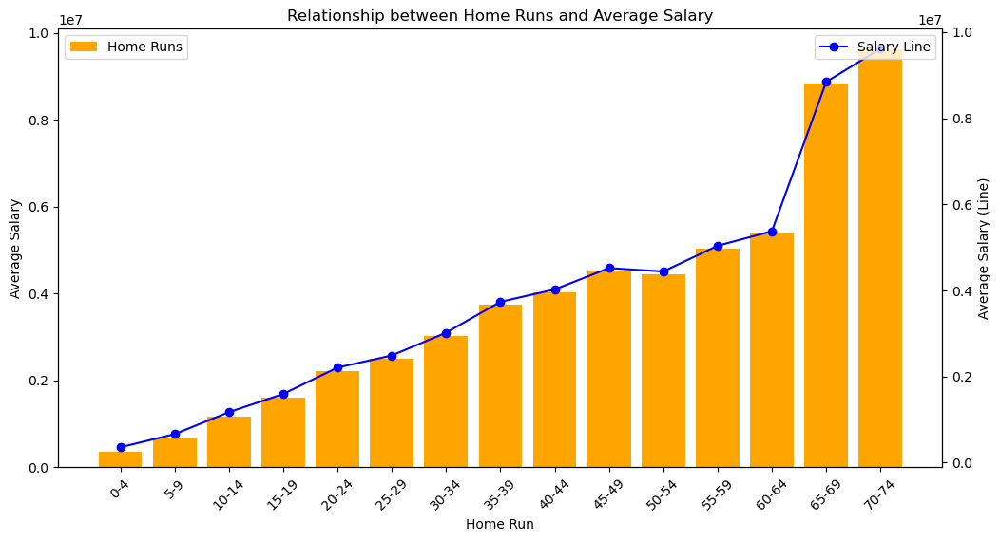

In [45]:
# Define home run bins
bins = list(range(0, 76, 5))  # Bins of 5 home runs up to 75
labels = [f'{i}-{i+4}' for i in range(0, 71, 5)]  # Labels should be one fewer than bins

# Bin the home runs
temp_df = merged_df.copy()
temp_df['hr_bin'] = pd.cut(temp_df['batting_hr'], bins=bins, labels=labels, right=False, include_lowest=True)

# Group the data by 'hr_bin' and calculate the mean salary
grouped_data = temp_df.groupby('hr_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars = ax1.bar(grouped_data['hr_bin'], grouped_data['salary'], color='orange', label='Home Runs')
ax1.set_xlabel('Home Run')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Home Runs and Average Salary')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Create the line chart
ax2 = ax1.twinx()
line = ax2.plot(grouped_data['hr_bin'], grouped_data['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Direct Correlation with Salary:** There is a clear upward trend indicating that players who hit more home runs generally earn higher salaries. This suggests that home run capability is highly valued in player contracts.

- **Significant Salary Increase at High Home Run Tiers:** The most substantial increases in salary occur as players exceed 60 home runs, highlighting the premium placed on top-tier power hitters who can significantly impact a team's scoring potential.

- **Consistent Value Across Mid-Tiers:** Players hitting between 20 to 59 home runs per season also see steady salary increases, showing that even moderate power is rewarded consistently in the league.

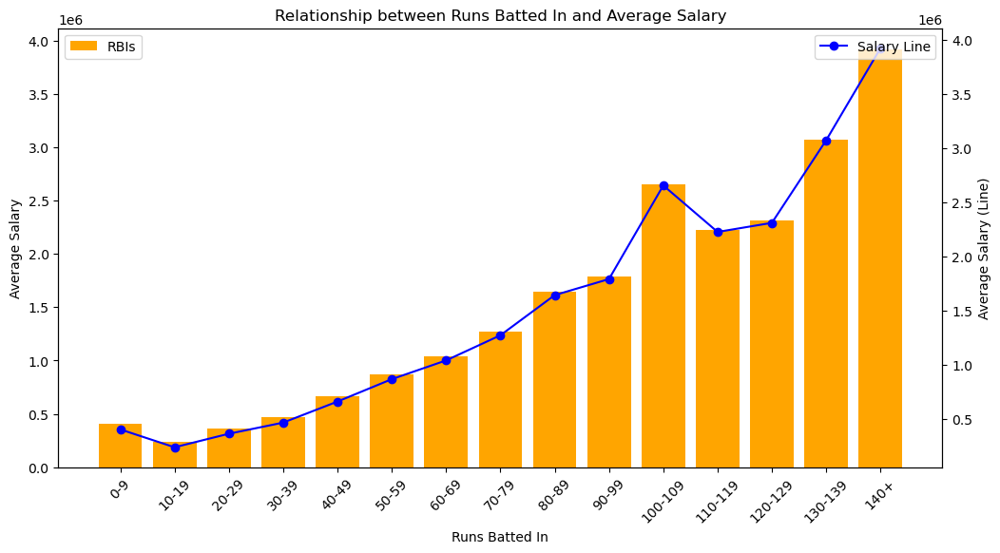

In [46]:
# Define RBI bins
bins = list(range(0, 151, 10))  # Bins of 10 RBIs up to 150
labels = [f'{i}-{i+9}' for i in range(0, 140, 10)] + ['140+']

# Bin the RBIs
temp_df = merged_df.copy()
temp_df['rbi_bin'] = pd.cut(temp_df['batting_rbi'], bins=bins, labels=labels, right=False, include_lowest=True)

# Group the data by 'rbi_bin' and calculate the mean salary
grouped_data = temp_df.groupby('rbi_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars = ax1.bar(grouped_data['rbi_bin'], grouped_data['salary'], color='orange', label='RBIs')
ax1.set_xlabel('Runs Batted In')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Runs Batted In and Average Salary')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Create the line chart
ax2 = ax1.twinx()
line = ax2.plot(grouped_data['rbi_bin'], grouped_data['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Positive Correlation with Salary:** The graph shows a positive correlation between RBIs and average salary, indicating that players with higher RBI counts tend to earn more. This reflects the value placed on players who can consistently drive in runs.

- **Significant Salary Increase Beyond 100 RBIs:** A noticeable spike in salary occurs when players reach and exceed 100 RBIs, suggesting that crossing this threshold is particularly valued in contract negotiations.

- **Consistency in Mid-Tiers:** Players who accumulate between 50 and 100 RBIs also see a steady increase in salary, emphasizing the consistent value placed on run production at different levels.

C:\Users\zavie\AppData\Local\Temp\ipykernel_37980\947372189.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data_sb = temp_df.groupby('sb_bin')['salary'].mean().reset_index()


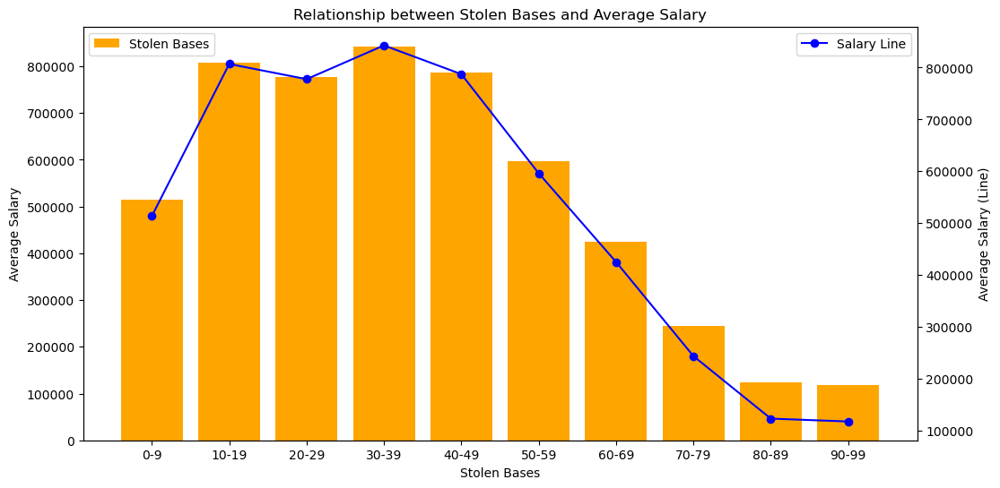

In [47]:
# Define SB bins
bins_sb = list(range(0, 101, 10))  # Bins of 10 stolen bases up to 100
labels_sb = [f'{i}-{i+9}' for i in range(0, 100, 10)]  # Labels for the bins, should be one fewer than the number of bins

# Bin the stolen bases
temp_df = merged_df.copy()
temp_df['sb_bin'] = pd.cut(temp_df['batting_sb'], bins=bins_sb, labels=labels_sb, include_lowest=True, right=False)

# Group the data by 'sb_bin' and calculate the mean salary
grouped_data_sb = temp_df.groupby('sb_bin')['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars_sb = ax1.bar(grouped_data_sb['sb_bin'], grouped_data_sb['salary'], color='orange', label='Stolen Bases')
ax1.set_xlabel('Stolen Bases')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Stolen Bases and Average Salary')

# Create the line chart
ax2 = ax1.twinx()
line_sb = ax2.plot(grouped_data_sb['sb_bin'], grouped_data_sb['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend_sb = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend_sb = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Peak Salary at Mid-Range Stolen Bases:** Players who achieve between 30 and 49 stolen bases earn the highest average salaries, indicating that a moderate number of stolen bases is highly valued.

- **Declining Salary Beyond 50 Stolen Bases:** There is a noticeable decline in salary as stolen bases increase beyond 50, suggesting that excessive base stealing may not be as highly valued, or it may be associated with roles that typically have lower pay.

- **Lower Salaries for Few or Many Stolen Bases:** Players with either very few (0-9) or a high number (70+) of stolen bases tend to have lower salaries, which may reflect the specialization of roles or reduced overall impact on a game.

### 2.5.3 Relationship between Salary & Pitching Performance <a id="2.5.3"></a>
[Back to Content](#Table-of-Content_01)

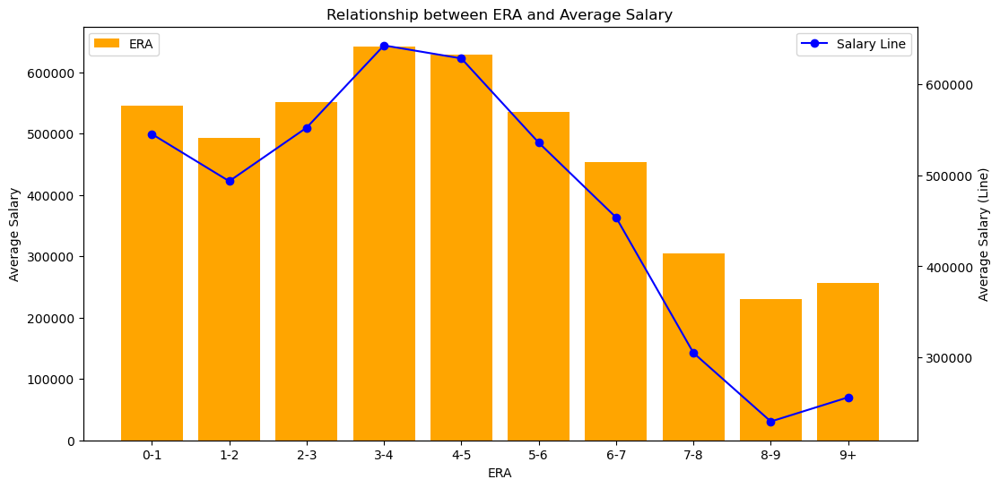

In [48]:
# Define ERA bins
bins_era = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  # Define appropriate bins for ERA
labels_era = [f'{i}-{i+1}' for i in range(0, 9)] + ['9+']

# Bin the ERA
temp_df = merged_df.copy()
temp_df['era_bin'] = pd.cut(temp_df['pitching_era'], bins=bins_era, labels=labels_era, include_lowest=True)

# Group the data by 'era_bin' and calculate the mean salary
grouped_data_era = temp_df.groupby('era_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars_era = ax1.bar(grouped_data_era['era_bin'], grouped_data_era['salary'], color='orange', label='ERA')
ax1.set_xlabel('ERA')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between ERA and Average Salary')

# Create the line chart
ax2 = ax1.twinx()
line_era = ax2.plot(grouped_data_era['era_bin'], grouped_data_era['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend_era = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend_era = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Highest Salaries for Mid-Range ERAs:** Players with an ERA between 3-4 and 4-5 command the highest average salaries, indicating that this is the most valued performance range for pitchers.

- **Declining Salaries with Higher ERAs:** As ERA increases beyond 5, there is a significant decline in average salary, reflecting the reduced effectiveness of pitchers who allow more earned runs.

- **Lower Salaries for Extreme ERAs:** Players with very low ERAs (0-1) and very high ERAs (8-9+) tend to have lower salaries, suggesting that extremes on either end might not align with the highest-paying roles, or might be associated with pitchers at different career stages or roles.

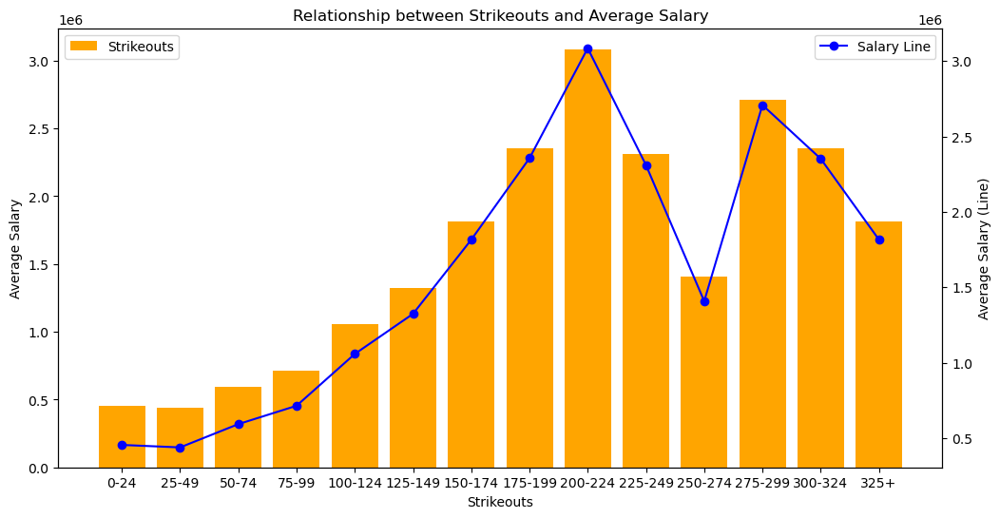

In [49]:
# Define SO bins with 25 strikeouts each
bins_so = list(range(0, 351, 25))  # Bins of 25 strikeouts up to 350
labels_so = [f'{i}-{i+24}' for i in range(0, 325, 25)] + ['325+']  # Adjusted for 350+ bin


# Bin the strikeouts
temp_df = merged_df.copy()
temp_df['so_bin'] = pd.cut(temp_df['pitching_so'], bins=bins_so, labels=labels_so, include_lowest=True)

# Group the data by 'so_bin' and calculate the mean salary
grouped_data_so = temp_df.groupby('so_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars_so = ax1.bar(grouped_data_so['so_bin'], grouped_data_so['salary'], color='orange', label='Strikeouts')
ax1.set_xlabel('Strikeouts')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Strikeouts and Average Salary')

# Create the line chart
ax2 = ax1.twinx()
line_so = ax2.plot(grouped_data_so['so_bin'], grouped_data_so['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend_so = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend_so = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Consistent Increase in Salary up to 200-224 Strikeouts:** There is a steady increase in average salary as the number of strikeouts rises, peaking in the 200-224 strikeout range. This indicates that reaching this range is highly valued by teams.

- **Peak Salary at 200-224 Strikeouts:** Players with 200-224 strikeouts earn the highest average salaries, showcasing this range as a critical threshold where strikeouts most significantly influence earnings.

- **Significant Drop After 224 Strikeouts:** After the 200-224 strikeout peak, there is a noticeable decline in average salary for the 225-274 strikeout range, suggesting diminishing returns for additional strikeouts beyond this point.

- **Recovery and Secondary Peak at 275-299 Strikeouts:** Interestingly, there is a rebound in salaries for players with 275-299 strikeouts, although it does not surpass the initial peak, highlighting that exceptionally high strikeout counts can still command a strong salary.

- **Decline Beyond 300 Strikeouts:** Players with over 300 strikeouts experience a gradual decrease in salary, which may indicate that extremely high strikeout numbers do not continue to add value in the eyes of teams, or that such performances are rare and come with other trade-offs.

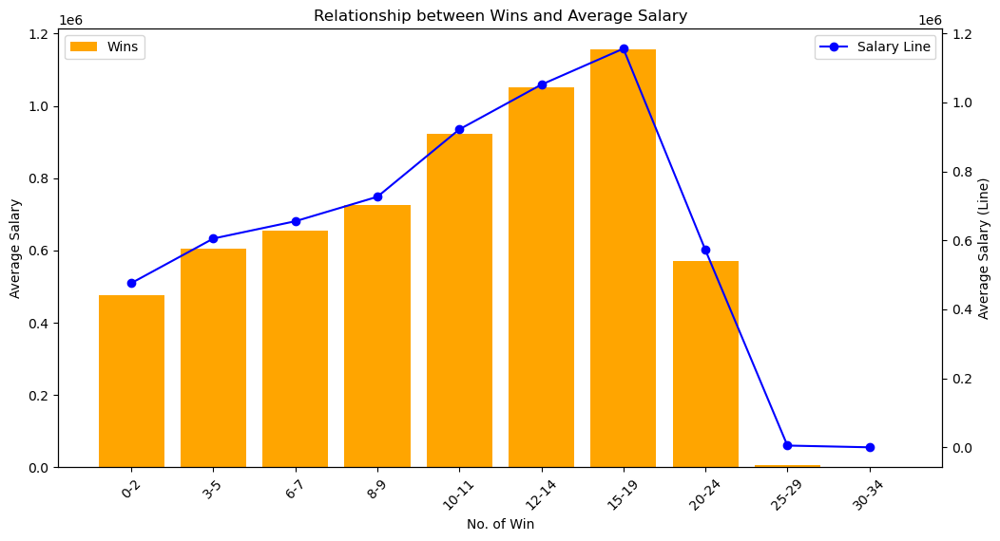

In [50]:
# Define win bins with the specified ranges
bins = [0, 3, 6, 8, 10, 12, 15, 20, 25, 30, 35]  # Adjusted bins
labels = ['0-2', '3-5', '6-7', '8-9', '10-11', '12-14', '15-19', '20-24', '25-29', '30-34'] 

# Bin the wins
temp_df = merged_df.copy()
temp_df['wins_bin'] = pd.cut(temp_df['pitching_w'], bins=bins, labels=labels, right=False, include_lowest=True)

# Group the data by 'wins_bin' and calculate the mean salary
grouped_data = temp_df.groupby('wins_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars = ax1.bar(grouped_data['wins_bin'], grouped_data['salary'], color='orange', label='Wins')
ax1.set_xlabel('No. of Win')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Wins and Average Salary')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Create the line chart
ax2 = ax1.twinx()
line = ax2.plot(grouped_data['wins_bin'], grouped_data['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Increasing Salaries with More Wins up to 15-19 Range:** There is a clear trend of increasing average salary as the number of wins increases, peaking in the 15-19 wins range. This indicates that players who contribute more wins to their teams are generally rewarded with higher salaries.

- **Highest Salary at 15-19 Wins:** Players in the 15-19 wins range earn the highest average salaries, suggesting that this range is particularly valued by teams, likely because it reflects consistent and impactful performance.

- **Sharp Decline Beyond 19 Wins:** There is a noticeable drop in average salary for players with 20-24 wins, and this trend continues steeply downwards for those with even more wins. This could imply that after a certain point, additional wins do not translate into higher salaries, possibly due to other factors such as injury risks or diminishing marginal returns.

- **Minimal or Zero Salary for 25+ Wins:** The data shows minimal to zero average salary for players with 25 or more wins, which could be due to the rarity of achieving this many wins or perhaps issues related to sustainability or the context of those wins.

C:\Users\zavie\AppData\Local\Temp\ipykernel_37980\1461313952.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data_sv = temp_df.groupby('sv_bin')['salary'].mean().reset_index()


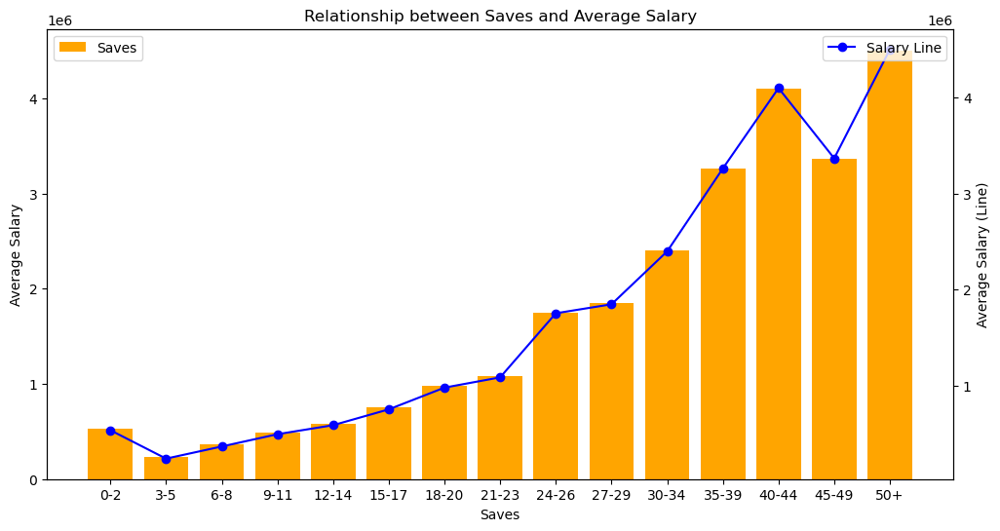

In [51]:
# Define SV bins
bins_sv = [0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 30, 35, 40, 45, 50, float('inf')]  # Adjusted bins
labels_sv = ['0-2', '3-5', '6-8', '9-11', '12-14', '15-17', '18-20', '21-23', '24-26', '27-29', '30-34', '35-39', '40-44', '45-49', '50+'] 

# Bin the saves
temp_df = merged_df.copy()
temp_df['sv_bin'] = pd.cut(temp_df['pitching_sv'], bins=bins_sv, labels=labels_sv, include_lowest=True, right=False)

# Group the data by 'sv_bin' and calculate the mean salary
grouped_data_sv = temp_df.groupby('sv_bin')['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars_sv = ax1.bar(grouped_data_sv['sv_bin'], grouped_data_sv['salary'], color='orange', label='Saves')
ax1.set_xlabel('Saves')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Saves and Average Salary')

# Create the line chart
ax2 = ax1.twinx()
line_sv = ax2.plot(grouped_data_sv['sv_bin'], grouped_data_sv['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend_sv = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend_sv = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Steady Increase in Salary with More Saves:** The graph shows a consistent increase in average salary as the number of saves increases, particularly notable from the 18-20 saves range onward. This suggests that players who are reliable in saving games are highly valued by teams.

- **Significant Salary Jump at 35+ Saves:** There is a marked increase in average salary starting at the 35-39 saves range, which continues to rise sharply for those with 50+ saves. This indicates that reaching or surpassing 35 saves in a season is a key performance threshold that teams reward with substantially higher salaries.

- **Highest Salaries at 50+ Saves:** Players with 50 or more saves command the highest average salaries, underscoring the importance of top-tier closers who can consistently secure wins in high-pressure situations.

- **Relatively Lower Salaries for Fewer Saves:** Players with fewer than 20 saves generally earn lower average salaries, reflecting a potential lower perceived value or fewer opportunities to close games.

### 2.5.4 Relationship between Salary & Fielding Performance <a id="2.5.4"></a>
[Back to Content](#Table-of-Content_01)

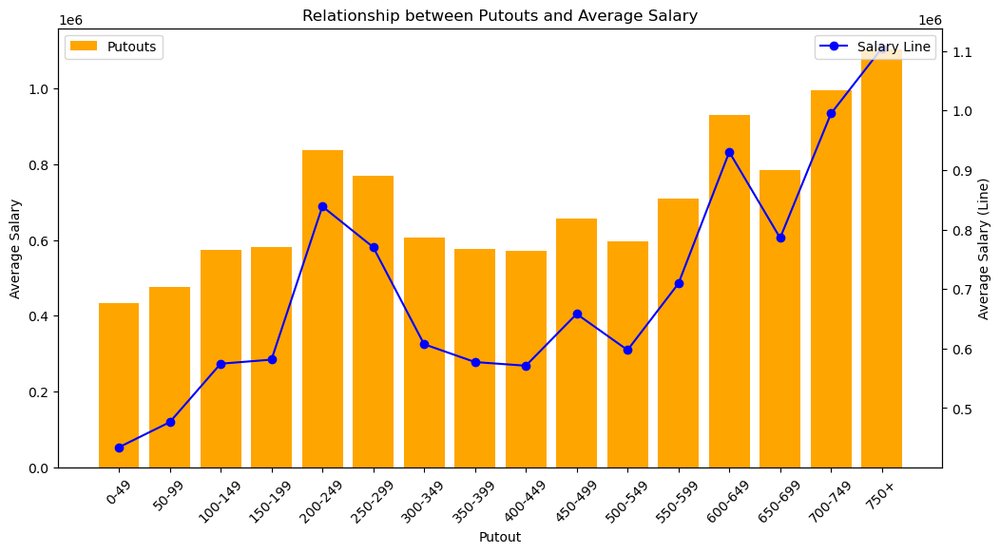

In [52]:
# Define putout bins
bins = list(range(0, 801, 50))  # Bins of 50 putouts up to 800
labels = [f'{i}-{i+49}' for i in range(0, 750, 50)] + ['750+']

# Bin the putouts
temp_df = merged_df.copy()
temp_df['po_bin'] = pd.cut(temp_df['fielding_po'], bins=bins, labels=labels, right=False, include_lowest=True)

# Group the data by 'po_bin' and calculate the mean salary
grouped_data = temp_df.groupby('po_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars = ax1.bar(grouped_data['po_bin'], grouped_data['salary'], color='orange', label='Putouts')
ax1.set_xlabel('Putout')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Putouts and Average Salary')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Create the line chart
ax2 = ax1.twinx()
line = ax2.plot(grouped_data['po_bin'], grouped_data['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Initial Salary Increase with More Putouts (0-249):** The graph shows a rise in average salary as the number of putouts increases from 0 to 249, with a peak at the 200-249 range. This suggests that players who are more involved in defensive plays are generally rewarded with higher salaries.

- **Decrease in Salary for Moderate Putouts (250-499):** After the initial peak, there's a notable decline in average salary as putouts increase from 250 to 499. This could imply that while some defensive involvement is valued, excessively high putout numbers without other complementary skills may not significantly boost a player's salary.

- **Significant Salary Increase at High Putout Levels (500+):** Beyond 500 putouts, average salaries begin to rise sharply again, with a major increase seen in the 600-649 and 750+ ranges. This suggests that very high levels of defensive activity, possibly indicating a player's key role in the field, are highly valued and lead to substantial salary increases.

- **Overall Trend:** The overall trend suggests that while moderate levels of defensive involvement might not greatly impact salaries, extremely high levels of putouts are highly valued, possibly reflecting the player's essential role in team defense.

C:\Users\zavie\AppData\Local\Temp\ipykernel_37980\3110485262.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data_a = temp_df.groupby('a_bin')['salary'].mean().reset_index()


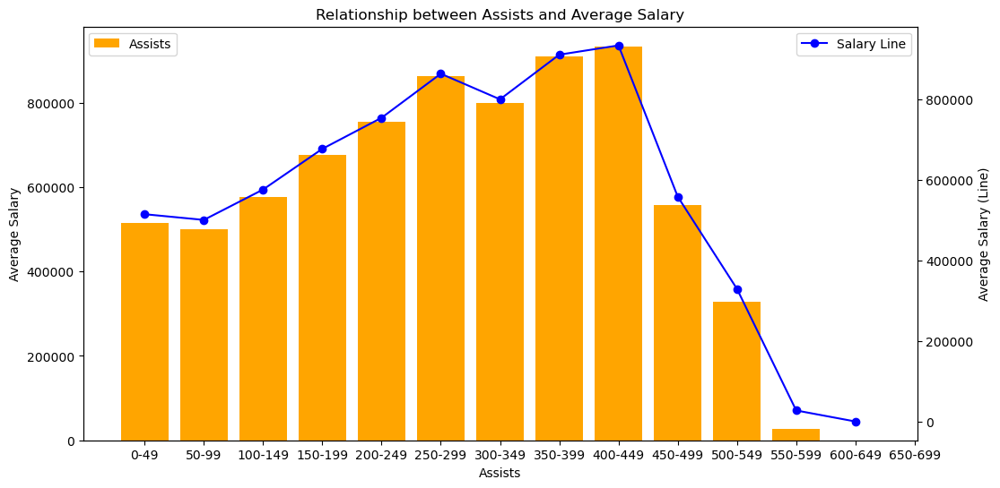

In [53]:
# Define Assists bins
bins_a = list(range(0, 1050, 50))  # Bins of 50 assists up to 1000
labels_a = [f'{i}-{i+49}' for i in range(0, 1000, 50)]  # Labels match the number of intervals

# Bin the assists
temp_df = merged_df.copy()
temp_df['a_bin'] = pd.cut(temp_df['fielding_a'], bins=bins_a, labels=labels_a, include_lowest=True)

# Group the data by 'a_bin' and calculate the mean salary
grouped_data_a = temp_df.groupby('a_bin')['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars_a = ax1.bar(grouped_data_a['a_bin'], grouped_data_a['salary'], color='orange', label='Assists')
ax1.set_xlabel('Assists')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Assists and Average Salary')

# Create the line chart
ax2 = ax1.twinx()
line_a = ax2.plot(grouped_data_a['a_bin'], grouped_data_a['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend_a = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend_a = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Salary Increase with Moderate Assists (0-399):** The average salary generally increases as the number of assists rises from 0 to 399, peaking in the 350-399 range. This indicates that a moderate level of assists is associated with higher salaries, possibly reflecting a player's consistent involvement in defensive plays.

- **Decline in Salary Beyond a Peak in Assists (400+):** After reaching the peak at 350-399 assists, the average salary begins to decrease sharply as the number of assists continues to rise. This suggests that while assists are valuable, an extremely high number of assists might not necessarily translate into higher pay, possibly due to the player being overworked or having limited impact in other areas.

- **Steep Salary Decline with Very High Assists (500-699):** The most significant decline in average salary occurs in the 500-699 assists range, where the salary drops to very low levels. This might indicate that excessively high assist numbers could be an indicator of over-specialization or lack of balance in a player's overall contribution, which is not as highly valued.

- **Overall Trend:** The trend suggests that while assists are positively correlated with salary up to a point, beyond a certain level, they may indicate diminishing returns, with the highest salaries being associated with players who maintain a balance of assists and other valuable contributions.

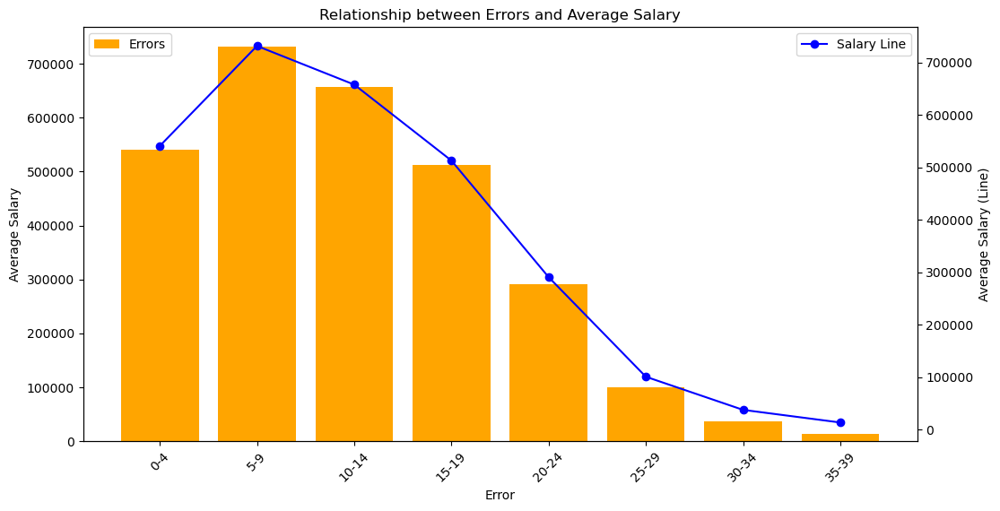

In [54]:
# Define error bins
bins = list(range(0, 45, 5))  # Bins of 5 errors up to 40
labels = [f'{i}-{i+4}' for i in range(0, 40, 5)]  # Labels should be one fewer than bins

# Bin the errors
temp_df = merged_df.copy()
temp_df['e_bin'] = pd.cut(temp_df['fielding_e'], bins=bins, labels=labels, right=False, include_lowest=True)

# Group the data by 'e_bin' and calculate the mean salary
grouped_data = temp_df.groupby('e_bin', observed=False)['salary'].mean().reset_index()

# Create the bar chart
fig, ax1 = plt.subplots(figsize=(12, 6))
bars = ax1.bar(grouped_data['e_bin'], grouped_data['salary'], color='orange', label='Errors')
ax1.set_xlabel('Error')
ax1.set_ylabel('Average Salary')
ax1.set_title('Relationship between Errors and Average Salary')

# Rotate the x-axis labels
plt.xticks(rotation=45)

# Create the line chart
ax2 = ax1.twinx()
line = ax2.plot(grouped_data['e_bin'], grouped_data['salary'], color='blue', marker='o', label='Salary Line')
ax2.set_ylabel('Average Salary (Line)')

# Add legends
bars_legend = ax1.legend(loc='upper left', bbox_to_anchor=(0, 1))
line_legend = ax2.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.show()

- **Inverse Relationship with Errors and Salary:** The graph clearly shows an inverse relationship between the number of errors and average salary. As the number of errors increases, the average salary decreases significantly. This indicates that players who commit fewer errors are more highly valued and thus command higher salaries.

- **Initial Tolerance (0-4 Errors):** Players with 0-4 errors still maintain a relatively high average salary, suggesting that a minimal number of errors is acceptable or even expected without a significant penalty in salary.

- **Sharp Decline After 15 Errors:** There is a noticeable decline in average salary for players who commit more than 15 errors. This suggests that once a player’s error count exceeds a certain threshold, their perceived value decreases sharply, resulting in lower salaries.

- **Very Low Salaries Beyond 20 Errors:** Players with more than 20 errors see a dramatic decrease in average salary, indicating that high error rates are highly detrimental to a player's earning potential. This may reflect the significant negative impact that a high error rate has on a player’s overall performance and reliability.

- **Overall Trend:** The trend reinforces the importance of defensive reliability in baseball, where reducing errors not only improves a player’s performance but also has a direct impact on their financial rewards.

## 2.6 Correlation Matrix <a id="2.6"></a>
[Back to Content](#Table-of-Content_01)

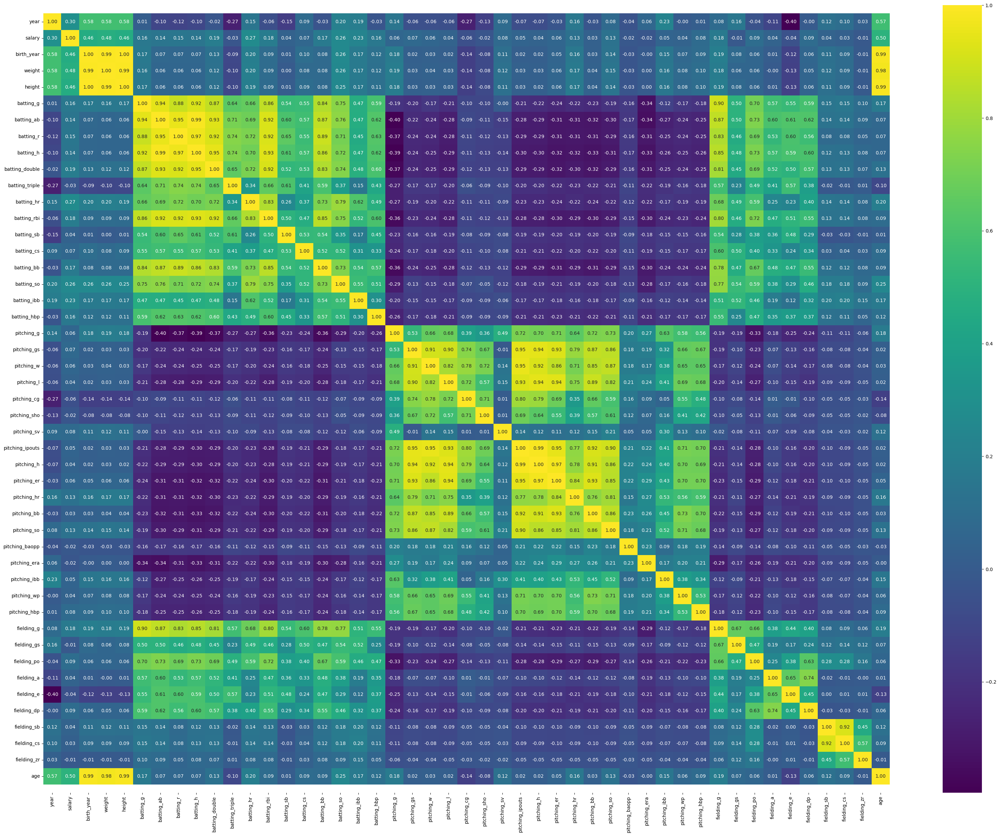

In [55]:
# Visualize the correlation through HeatMap
# plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['figure.figsize'] = (40, 30)
ax = sns.heatmap(merged_df[num_cols].corr(), annot=True, fmt=".2f", cmap='viridis')

# Adjust the bottom and top margins to make sure the heatmap is displayed correctly
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

plt.show()

- **High Correlation within Same Category:** Variables within the same category, such as batting stats, pitching stats, and fielding stats, tend to show high correlations with each other. This is expected as they measure similar aspects of performance.

- **Positive Correlation Between Salary and Performance Metrics:** Metrics related to player performance, particularly in batting (e.g., home runs, RBIs) and pitching (e.g., strikeouts, wins), generally show positive correlations with salary, indicating that better performance in these areas is associated with higher pay.

- **Negative Correlation Between Errors and Salary:** Errors, a fielding metric, show a negative correlation with salary, reinforcing the idea that higher error rates are detrimental to a player’s earnings.

- **Weak or No Correlation Between Some Fielding Metrics and Salary:** Some fielding metrics like putouts and assists show weaker correlations with salary, suggesting that these aspects of performance might be less influential in determining player pay.

- **Clustered Correlation:** The heatmap shows distinct clusters where variables are more strongly correlated within their groups (e.g., batting, pitching, and fielding), suggesting that these performance areas operate somewhat independently from each other in terms of their influence on overall player evaluation and salary determination.

In [56]:
# Assuming 'merged_df' is your DataFrame and 'salary' is the target variable
target_variable = 'salary'

# Select only numeric columns
numeric_df = merged_df.select_dtypes(include=[np.number])

# Calculate the correlation matrix
correlation_matrix = numeric_df.corr()

# Extract correlations with the target variable and sort by absolute value
correlation_with_target = correlation_matrix[target_variable].abs().sort_values(ascending=False)

# Display the sorted correlations
print(correlation_with_target)

salary             1.000000
age                0.500996
weight             0.477073
height             0.461674
birth_year         0.460520
year               0.301468
batting_hr         0.268987
batting_so         0.262054
batting_ibb        0.233994
batting_double     0.187518
batting_rbi        0.183750
fielding_g         0.175488
batting_bb         0.171244
batting_hbp        0.163760
batting_g          0.162585
batting_r          0.151575
batting_h          0.144799
batting_ab         0.143519
pitching_so        0.128683
pitching_hr        0.125930
fielding_po        0.094696
fielding_dp        0.093337
pitching_hbp       0.083586
pitching_sv        0.081647
pitching_gs        0.074789
batting_cs         0.065881
pitching_w         0.059086
pitching_g         0.058960
pitching_cg        0.058503
pitching_er        0.056441
pitching_ipouts    0.047213
pitching_ibb       0.047113
pitching_wp        0.044264
fielding_e         0.043460
pitching_h         0.043255
pitching_l         0

In [57]:
# Define the target variable
target_variable = 'salary'

# Select only numeric columns for correlation calculation
numeric_df = merged_df.select_dtypes(include=[np.number])

# Calculate the correlation matrix and extract the target variable's correlations
correlation_with_target = numeric_df.corr()[target_variable].abs()  # Absolute value for easy categorization

# Define thresholds for high, medium, and low correlations
high_corr_threshold = 0.7
low_corr_threshold = 0.3

# Filter the correlations based on the defined thresholds
high_corr = correlation_with_target[correlation_with_target >= high_corr_threshold]
mid_corr = correlation_with_target[(correlation_with_target >= low_corr_threshold) & (correlation_with_target < high_corr_threshold)]
low_corr = correlation_with_target[correlation_with_target < low_corr_threshold]

# Display the categorized correlations
print("High Correlation with Target Variable:")
print(high_corr)

print("\nMedium Correlation with Target Variable:")
print(mid_corr)

print("\nLow Correlation with Target Variable:")
print(low_corr)


High Correlation with Target Variable:
salary    1.0
Name: salary, dtype: float64

Medium Correlation with Target Variable:
year          0.301468
birth_year    0.460520
weight        0.477073
height        0.461674
age           0.500996
Name: salary, dtype: float64

Low Correlation with Target Variable:
batting_g          0.162585
batting_ab         0.143519
batting_r          0.151575
batting_h          0.144799
batting_double     0.187518
batting_triple     0.025568
batting_hr         0.268987
batting_rbi        0.183750
batting_sb         0.038129
batting_cs         0.065881
batting_bb         0.171244
batting_so         0.262054
batting_ibb        0.233994
batting_hbp        0.163760
pitching_g         0.058960
pitching_gs        0.074789
pitching_w         0.059086
pitching_l         0.040721
pitching_cg        0.058503
pitching_sho       0.022662
pitching_sv        0.081647
pitching_ipouts    0.047213
pitching_h         0.043255
pitching_er        0.056441
pitching_hr        0.

- **High Correlation with Salary**:
  - **Salary**: Perfect correlation as it is the target variable itself.

- **Medium Correlation with Salary**:
  - **Year (0.301)**: Indicates a moderate positive correlation between the year and salary, possibly reflecting trends in rising salaries over time.
  - **Birth Year (0.461)**: Suggests a moderate positive correlation; younger players might earn higher salaries.
  - **Weight (0.477)**: Shows a moderate positive correlation; heavier players might have a slight edge in salary.
  - **Height (0.462)**: Similar to weight, height has a moderate positive correlation with salary, possibly due to physical advantages in certain positions.
  - **Age (0.501)**: Indicates a moderate positive correlation; more experienced players might command higher salaries.

- **Low Correlation with Salary**:
  - **Batting Stats**:
    - **Games Played (0.163)**: Weak correlation with salary, indicating limited influence.
    - **At Bats (0.144)**: Also a weak correlation with salary.
    - **Runs (0.152), Hits (0.145), Doubles (0.188)**: These have weak correlations, suggesting these metrics are less impactful on salary.
    - **Home Runs (0.269)**: Slightly higher but still weak, indicating some importance but not as critical as other factors.
    - **Other Batting Metrics**: Such as RBIs, stolen bases, etc., have very low correlations, reflecting minimal impact on salary.
  
  - **Pitching Stats**:
    - **Games Played (0.059), Wins (0.059), Saves (0.082)**: These have very weak correlations with salary, suggesting they are not primary factors in salary determination.
    - **Earned Run Average (0.024)**: Very weak correlation, indicating ERA might not be heavily weighted in salary decisions.

  - **Fielding Stats**:
    - **Games Played (0.175), Putouts (0.095), Assists (0.041)**: These have weak correlations with salary, suggesting limited influence of fielding metrics on earnings.
    - **Zone Rating (0.014)**: Very low correlation, indicating almost no impact on salary.

# Step 3: Data Cleansing and Transformation <a id="3.0"></a>
[Back to Content](#Table-of-Content_01)

## 3.1 Checking for Missing Data <a id="3.1"></a>
[Back to Content](#Table-of-Content_01)

In [58]:
merged_df.head()

,player_id,year,team_id,league_id,salary,birth_year,weight,height,bats,throws,...,fielding_g,fielding_gs,fielding_po,fielding_a,fielding_e,fielding_dp,fielding_sb,fielding_cs,fielding_zr,age
0,aardsda01,2004,SFN,NL,300000.0,1981.0,220.0,75.0,R,R,...,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0
1,aardsda01,2006,0,0,0.0,0.0,0.0,0.0,0,0,...,45.0,0.0,1.0,5.0,0.0,1.0,0.0,0.0,0.0,0.0
2,aardsda01,2007,CHA,AL,387500.0,1981.0,220.0,75.0,R,R,...,25.0,0.0,2.0,4.0,1.0,0.0,0.0,0.0,0.0,26.0
3,aardsda01,2008,BOS,AL,403250.0,1981.0,220.0,75.0,R,R,...,47.0,0.0,3.0,6.0,0.0,0.0,0.0,0.0,0.0,27.0
4,aardsda01,2009,SEA,AL,419000.0,1981.0,220.0,75.0,R,R,...,73.0,0.0,2.0,5.0,0.0,1.0,0.0,0.0,0.0,28.0


In [59]:
# Quantify the total number of missing values
missing_data = merged_df.isnull().sum()

# Quantify the mean of missing values
missing_data_mean = merged_df.isnull().mean()
missing_data_mean_percent = missing_data_mean * 100

# Now I will combine them side by side for easy viewing.
missing_data_summary = pd.DataFrame({'Missing Values': missing_data,'Mean Percentage': missing_data_mean_percent})

# To sort by 'Missing Values' in ascending order (default):
missing_data_summary = missing_data_summary.sort_values(by='Missing Values')

missing_data_summary

,Missing Values,Mean Percentage
player_id,0,0.0
pitching_cg,0,0.0
pitching_sho,0,0.0
pitching_sv,0,0.0
pitching_ipouts,0,0.0
pitching_h,0,0.0
pitching_er,0,0.0
pitching_hr,0,0.0
pitching_bb,0,0.0
pitching_so,0,0.0


In [60]:
# Calculate the percentage of zero values for each column
zero_percentage = (merged_df == 0).mean() * 100

# Combine missing data and zero percentage data for easy viewing
missing_data_summary = pd.DataFrame({'Percentage of Zeros': zero_percentage})

# Sort by 'Percentage of Zeros' in descending order
missing_data_summary = missing_data_summary.sort_values(by='Percentage of Zeros', ascending=False)

# Display the summary
pd.set_option('display.max_columns', None)  # Ensure all columns are shown
print(missing_data_summary)

                 Percentage of Zeros
fielding_zr                98.501873
fielding_cs                94.993934
fielding_sb                94.606742
pitching_sho               89.929841
pitching_sv                86.429287
pitching_cg                82.258796
batting_ibb                80.916812
pitching_ibb               79.034657
batting_cs                 73.903044
salary                     73.028433
age                        73.026323
throws                     73.026323
bats                       73.026323
height                     73.026323
weight                     73.026323
birth_year                 73.026323
league_id                  73.026323
team_id                    73.026323
pitching_gs                72.218178
pitching_hbp               70.785462
pitching_wp                69.046790
pitching_w                 67.978056
fielding_gs                66.688822
pitching_l                 65.199135
batting_hbp                64.998681
pitching_hr                63.431978
b

In [61]:
# List of columns to drop based on high percentage of zero values
columns_to_drop = ['fielding_zr', 'pitching_sho', 'fielding_cs', 'fielding_sb', 'pitching_cg', 'pitching_sv']

# Drop the columns from the dataset
merged_df = merged_df.drop(columns=columns_to_drop)

# Verify the columns have been dropped
merged_df.head()

,player_id,year,team_id,league_id,salary,birth_year,weight,height,bats,throws,batting_g,batting_ab,batting_r,batting_h,batting_double,batting_triple,batting_hr,batting_rbi,batting_sb,batting_cs,batting_bb,batting_so,batting_ibb,batting_hbp,pitching_g,pitching_gs,pitching_w,pitching_l,pitching_ipouts,pitching_h,pitching_er,pitching_hr,pitching_bb,pitching_so,pitching_baopp,pitching_era,pitching_ibb,pitching_wp,pitching_hbp,fielding_g,fielding_gs,fielding_po,fielding_a,fielding_e,fielding_dp,age
0,aardsda01,2004,SFN,NL,300000.0,1981.0,220.0,75.0,R,R,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,1.0,0.0,32.0,20.0,8.0,1.0,10.0,5.0,0.417,6.75,0.0,0.0,2.0,11.0,0.0,0.0,0.0,0.0,0.0,23.0
1,aardsda01,2006,0,0,0.0,0.0,0.0,0.0,0,0,45.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0.0,3.0,0.0,159.0,41.0,24.0,9.0,28.0,49.0,0.214,4.08,0.0,1.0,1.0,45.0,0.0,1.0,5.0,0.0,1.0,0.0
2,aardsda01,2007,CHA,AL,387500.0,1981.0,220.0,75.0,R,R,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.0,0.0,2.0,1.0,97.0,39.0,23.0,4.0,17.0,36.0,0.300,6.40,3.0,2.0,1.0,25.0,0.0,2.0,4.0,1.0,0.0,26.0
3,aardsda01,2008,BOS,AL,403250.0,1981.0,220.0,75.0,R,R,47.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,47.0,0.0,4.0,2.0,146.0,49.0,30.0,4.0,35.0,49.0,0.268,5.55,2.0,3.0,5.0,47.0,0.0,3.0,6.0,0.0,0.0,27.0
4,aardsda01,2009,SEA,AL,419000.0,1981.0,220.0,75.0,R,R,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,73.0,0.0,3.0,6.0,214.0,49.0,20.0,4.0,34.0,80.0,0.189,2.52,3.0,2.0,0.0,73.0,0.0,2.0,5.0,0.0,1.0,28.0


In [62]:
# Check how many rows and columns there are now.
num_rows, num_columns = merged_df.shape
print(f'The merged DataFrame has {num_rows} rows and {num_columns} columns.')

The merged DataFrame has 94785 rows and 46 columns.


In [63]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94785 entries, 0 to 94784
Data columns (total 46 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   player_id        94785 non-null  object 
 1   year             94785 non-null  int64  
 2   team_id          94785 non-null  object 
 3   league_id        94785 non-null  object 
 4   salary           94785 non-null  float64
 5   birth_year       94785 non-null  float64
 6   weight           94785 non-null  float64
 7   height           94785 non-null  float64
 8   bats             94785 non-null  object 
 9   throws           94785 non-null  object 
 10  batting_g        94785 non-null  float64
 11  batting_ab       94785 non-null  float64
 12  batting_r        94785 non-null  float64
 13  batting_h        94785 non-null  float64
 14  batting_double   94785 non-null  float64
 15  batting_triple   94785 non-null  float64
 16  batting_hr       94785 non-null  float64
 17  batting_rbi 

In [64]:
# Display basic statistics of the salary column
salary_stats = salary_data['salary'].describe()
print(salary_stats)

count    2.557500e+04
mean     2.008563e+06
std      3.315706e+06
min      0.000000e+00
25%      2.750000e+05
50%      5.500000e+05
75%      2.250000e+06
max      3.300000e+07
Name: salary, dtype: float64


## 3.2 Transformation of Variables <a id="3.2"></a>
[Back to Content](#Table-of-Content_01)

In [65]:
num_cols = [n for n in merged_df.columns if merged_df[n].dtypes!='O']
merged_df[num_cols].head()

,year,salary,birth_year,weight,height,batting_g,batting_ab,batting_r,batting_h,batting_double,batting_triple,batting_hr,batting_rbi,batting_sb,batting_cs,batting_bb,batting_so,batting_ibb,batting_hbp,pitching_g,pitching_gs,pitching_w,pitching_l,pitching_ipouts,pitching_h,pitching_er,pitching_hr,pitching_bb,pitching_so,pitching_baopp,pitching_era,pitching_ibb,pitching_wp,pitching_hbp,fielding_g,fielding_gs,fielding_po,fielding_a,fielding_e,fielding_dp,age
0,2004,300000.0,1981.0,220.0,75.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,1.0,0.0,32.0,20.0,8.0,1.0,10.0,5.0,0.417,6.75,0.0,0.0,2.0,11.0,0.0,0.0,0.0,0.0,0.0,23.0
1,2006,0.0,0.0,0.0,0.0,45.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,0.0,3.0,0.0,159.0,41.0,24.0,9.0,28.0,49.0,0.214,4.08,0.0,1.0,1.0,45.0,0.0,1.0,5.0,0.0,1.0,0.0
2,2007,387500.0,1981.0,220.0,75.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.0,0.0,2.0,1.0,97.0,39.0,23.0,4.0,17.0,36.0,0.300,6.40,3.0,2.0,1.0,25.0,0.0,2.0,4.0,1.0,0.0,26.0
3,2008,403250.0,1981.0,220.0,75.0,47.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,47.0,0.0,4.0,2.0,146.0,49.0,30.0,4.0,35.0,49.0,0.268,5.55,2.0,3.0,5.0,47.0,0.0,3.0,6.0,0.0,0.0,27.0
4,2009,419000.0,1981.0,220.0,75.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,73.0,0.0,3.0,6.0,214.0,49.0,20.0,4.0,34.0,80.0,0.189,2.52,3.0,2.0,0.0,73.0,0.0,2.0,5.0,0.0,1.0,28.0


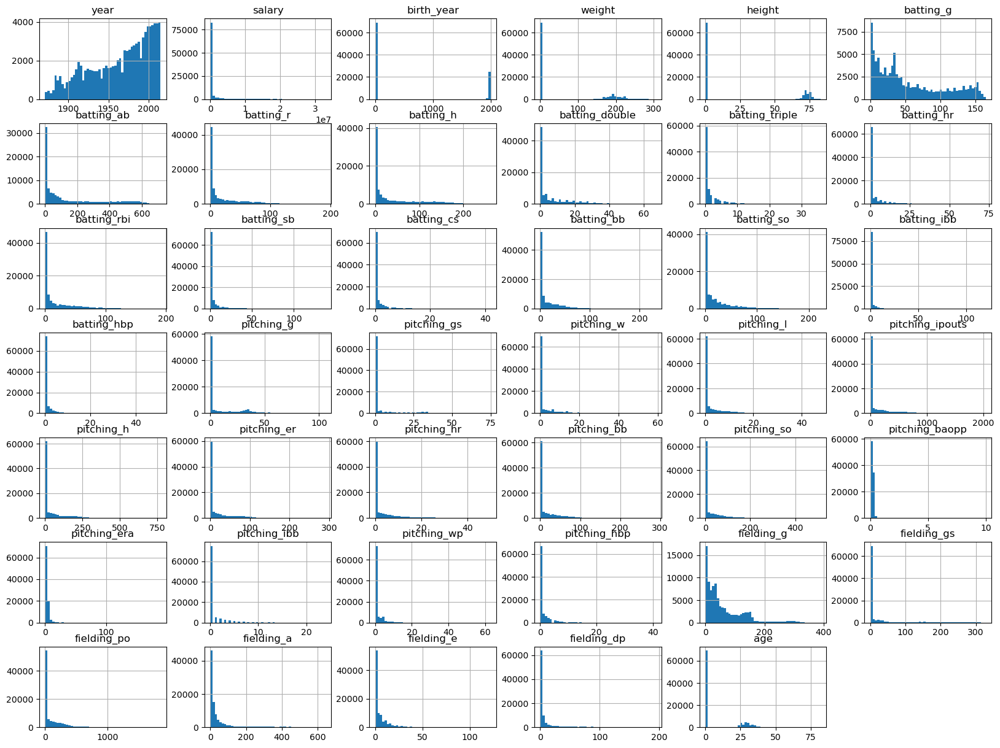

In [66]:
# plot the histogram to the num variables
merged_df[num_cols].hist(bins=50, figsize=(20,15))
plt.show()

- **Year**: The data appears to be right-skewed, with a significant increase in player entries after the 1950s, indicating more recent data points in the dataset.
  
- **Salary**: The salary distribution is highly right-skewed, with most players earning lower salaries and a few earning significantly higher salaries, reflecting income disparity among players.

- **Birth Year**: This variable is heavily skewed, with a concentration of players born in the late 20th century, suggesting a focus on more recent players.

- **Weight and Height**: Both variables are normally distributed, with most players falling within a specific range, indicating standard physical profiles for athletes.

- **Batting Statistics**:
  - **At Bats, Runs, Hits, etc.**: These variables are right-skewed, showing that while a few players have very high performance metrics, most have relatively lower stats.
  - **Home Runs, RBIs**: Similarly skewed, with most players achieving lower totals, while a few excel significantly.

- **Pitching Statistics**:
  - **Games Started, Wins, Innings Pitched**: These variables are right-skewed, indicating that most players have lower totals in these categories, with a few outliers performing exceptionally.
  - **Earned Run Average (ERA)**: ERA distribution shows that most players have lower ERA scores, indicating better performance.
  
- **Fielding Statistics**:
  - **Games Played, Putouts, Assists**: These variables are also right-skewed, with most players having lower values in these metrics, again highlighting a few players with exceptional defensive stats.

- **Age**: The age distribution is right-skewed, with most players being younger, which aligns with typical athlete demographics.

These insights indicate that the dataset contains a broad range of player performances, with many variables showing a concentration around lower values and a few outliers representing high-achieving players. The data distribution suggests potential areas for further analysis, such as the impact of outliers on model performance and the need for data transformation in certain cases.

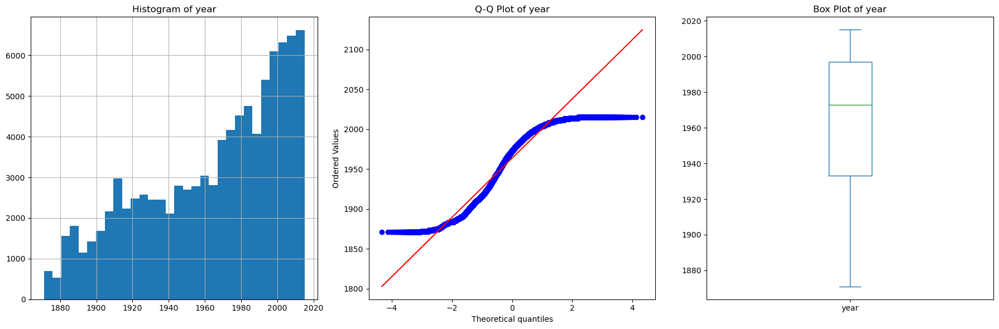

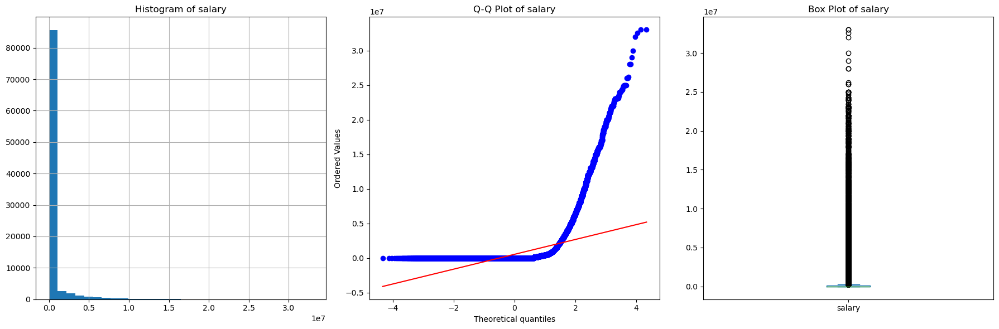

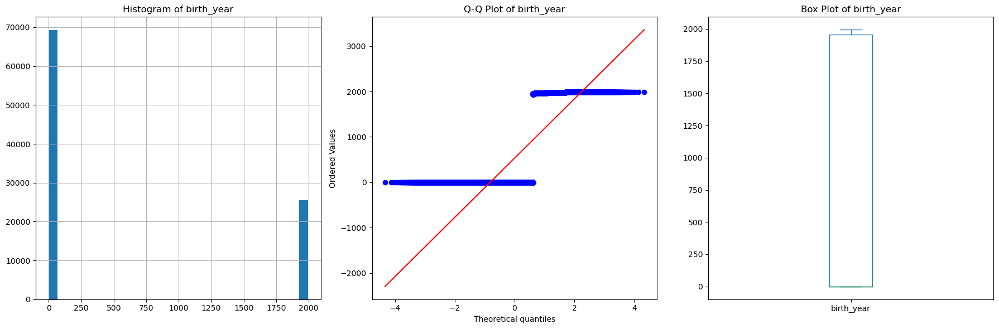

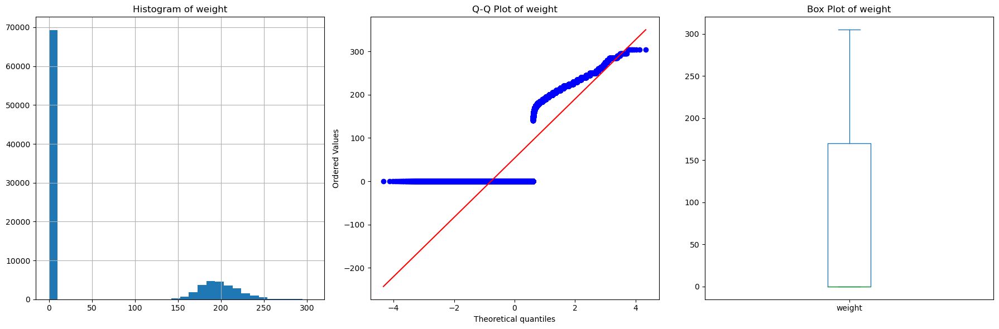

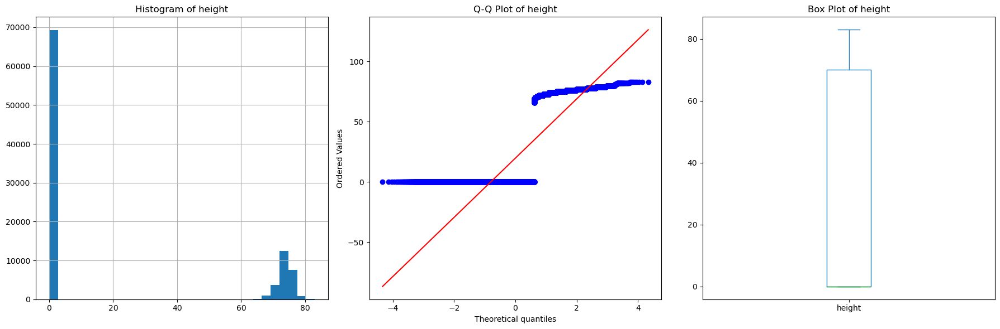

...

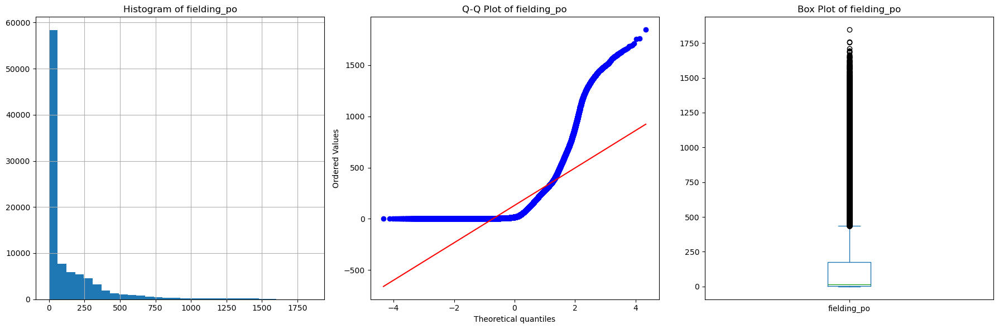

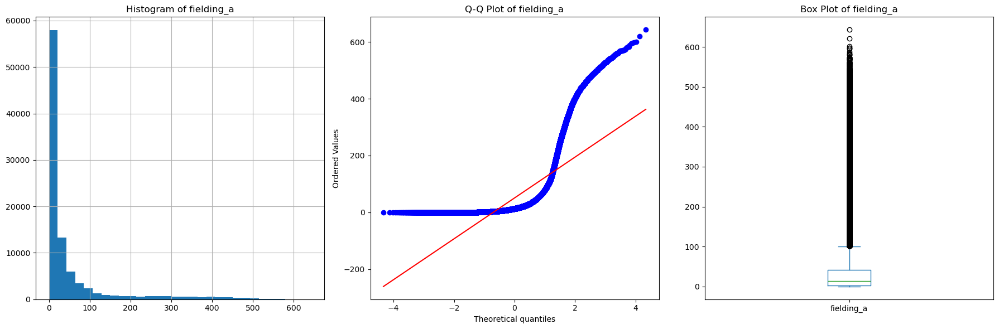

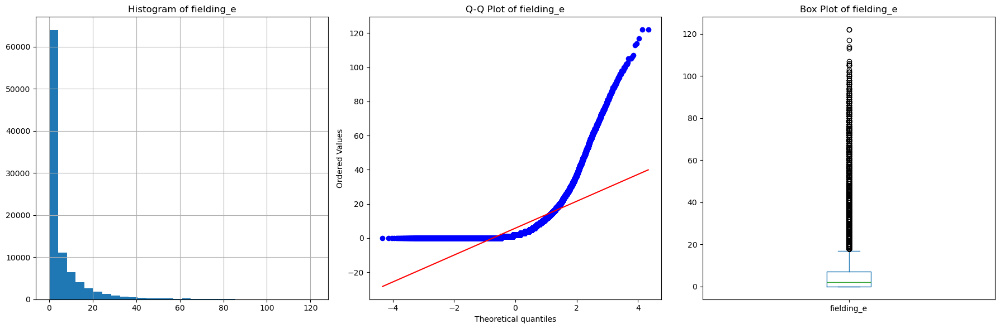

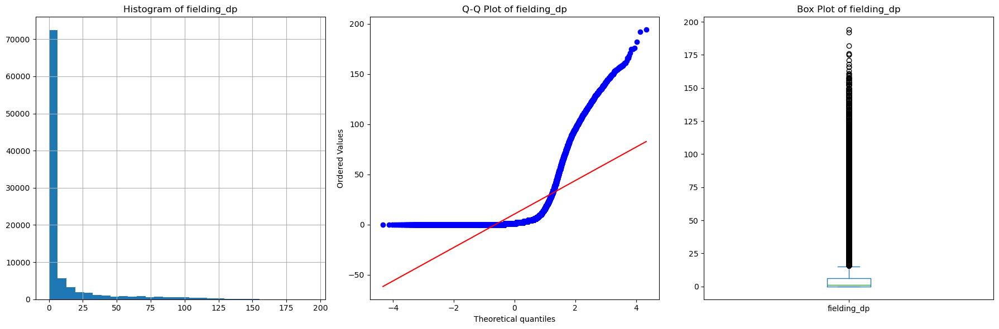

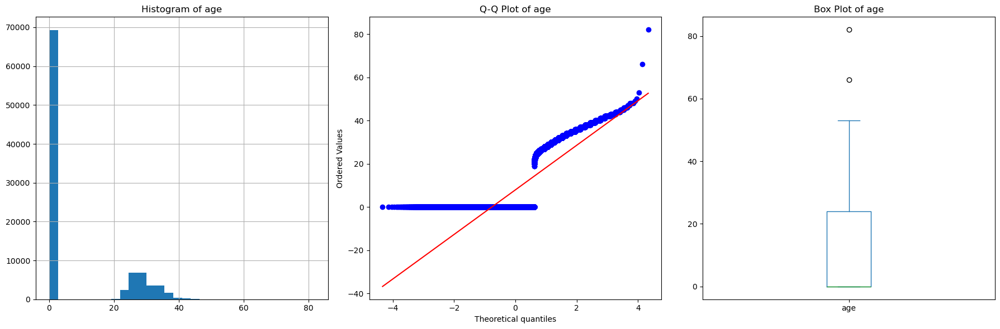

In [67]:
# Plot histogram and Q-Q plots for numerical variables
# to have a look at the variable distribution

# Define the diagnostic plot function
def diagnostic_plots(df, variable):
    plt.figure(figsize=(18, 6))
    
    # Histogram
    plt.subplot(1, 3, 1)
    df[variable].hist(bins=30)
    plt.title(f'Histogram of {variable}')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {variable}')

    # Box plot
    plt.subplot(1, 3, 3)
    df[variable].plot.box()
    plt.title(f'Box Plot of {variable}')

    plt.tight_layout()
    plt.show()
    
    
for variable in merged_df[num_cols].columns:
    diagnostic_plots(merged_df, variable)

### 3.2.1 Winsorization Method <a id="3.2.1"></a>
[Back to Content](#Table-of-Content_01)

Winsorization is a statistical technique used to handle outliers in a dataset. It involves replacing extreme values with less extreme ones, rather than removing them entirely.
Here's a basic overview of what winsorization does:

- It identifies data points that fall outside a specified percentile range (e.g., below the 5th percentile or above the 95th percentile).
- Instead of removing these outliers, it replaces them with the values at those percentile thresholds.
- This process reduces the impact of extreme values on statistical analyses without completely eliminating the data points.

Winsorization helps to mitigate the influence of outliers while preserving the overall shape of the data distribution. It's often used in financial analysis, data preprocessing, and other fields where extreme values can skew results but completely removing them might lead to loss of important information.

In [68]:
# Winsorising those with outliers

# Define the variables to be trimmed
#variables_to_trim = ['weight', 'height', 'batting_r', 'batting_h', 'batting_double', 'batting_triple', 'batting_hr',
#                           'batting_rbi', 'batting_sb', 'batting_cs', 'batting_bb', 'batting_so', 'batting_ibb', 'batting_hbp',
#                           'pitching_g', 'pitching_gs', 'pitching_w', 'pitching_l', 'pitching_ipouts', 'pitching_h', 'pitching_er',
#                           'pitching_hr', 'pitching_bb', 'pitching_so', 'pitching_baopp', 'pitching_era', 'pitching_ibb','pitching_wp',
#                           'pitching_hbp', 'fielding_g', 'fielding_gs', 'fielding_po', 'fielding_a', 'fielding_e', 'fielding_dp']

# Apply Winsorization
#winsorizer = Winsorizer(capping_method ='quantiles', 
#                        tail='both', # cap left, right or both tails
#                        fold =0.05,
#                        variables=['weight', 'height', 'batting_r', 'batting_h', 'batting_double', 'batting_triple', 'batting_hr',
#                           'batting_rbi', 'batting_sb', 'batting_cs', 'batting_bb', 'batting_so', 'batting_ibb', 'batting_hbp',
#                           'pitching_g', 'pitching_gs', 'pitching_w', 'pitching_l', 'pitching_ipouts', 'pitching_h', 'pitching_er',
#                           'pitching_hr', 'pitching_bb', 'pitching_so', 'pitching_baopp', 'pitching_era', 'pitching_ibb','pitching_wp',
#                           'pitching_hbp', 'fielding_g', 'fielding_gs', 'fielding_po', 'fielding_a', 'fielding_e', 'fielding_dp'])

#winsorizer.fit(merged_df[variables_to_trim])

In [69]:
# Winsorizing those with outliers v2 (outer)

# Define the variables to be trimmed
variables_to_trim = ['weight', 'height', 'batting_r', 'batting_h', 'batting_double', 'batting_hr',
                           'batting_rbi', 'batting_bb', 'batting_so',
                           'pitching_g', 'pitching_gs', 'pitching_w', 'pitching_l', 'pitching_ipouts', 'pitching_h', 'pitching_er',
                           'pitching_hr', 'pitching_bb', 'pitching_so', 'pitching_baopp', 'pitching_era', 'pitching_ibb','pitching_wp',
                           'pitching_hbp', 'fielding_g', 'fielding_gs', 'fielding_po', 'fielding_a', 'fielding_e', 'fielding_dp']

# Apply Winsorization
winsorizer = Winsorizer(capping_method ='quantiles', 
                        tail='both', # cap left, right or both tails
                        fold =0.05,
                        variables=['weight', 'height', 'batting_r', 'batting_h', 'batting_double', 'batting_hr',
                           'batting_rbi', 'batting_bb', 'batting_so',
                           'pitching_g', 'pitching_gs', 'pitching_w', 'pitching_l', 'pitching_ipouts', 'pitching_h', 'pitching_er',
                           'pitching_hr', 'pitching_bb', 'pitching_so', 'pitching_baopp', 'pitching_era', 'pitching_ibb','pitching_wp',
                           'pitching_hbp', 'fielding_g', 'fielding_gs', 'fielding_po', 'fielding_a', 'fielding_e', 'fielding_dp'])

winsorizer.fit(merged_df[variables_to_trim])

Winsorizer(capping_method='quantiles', fold=0.05, tail='both',
           variables=['weight', 'height', 'batting_r', 'batting_h',
                      'batting_double', 'batting_hr', 'batting_rbi',
                      'batting_bb', 'batting_so', 'pitching_g', 'pitching_gs',
                      'pitching_w', 'pitching_l', 'pitching_ipouts',
                      'pitching_h', 'pitching_er', 'pitching_hr', 'pitching_bb',
                      'pitching_so', 'pitching_baopp', 'pitching_era',
                      'pitching_ibb', 'pitching_wp', 'pitching_hbp',
                      'fielding_g', 'fielding_gs', 'fielding_po', 'fielding_a',
                      'fielding_e', 'fielding_dp'])

In [70]:
merged_df_selected_cols = winsorizer.transform(merged_df[variables_to_trim])

In [71]:
# Combine the winsorized columns back with the original DataFrame
for col in variables_to_trim:
    merged_df[col] = merged_df_selected_cols[col]

In [72]:
# Verify all columns are present
print(merged_df.columns)

Index(['player_id', 'year', 'team_id', 'league_id', 'salary', 'birth_year',
       'weight', 'height', 'bats', 'throws', 'batting_g', 'batting_ab',
       'batting_r', 'batting_h', 'batting_double', 'batting_triple',
       'batting_hr', 'batting_rbi', 'batting_sb', 'batting_cs', 'batting_bb',
       'batting_so', 'batting_ibb', 'batting_hbp', 'pitching_g', 'pitching_gs',
       'pitching_w', 'pitching_l', 'pitching_ipouts', 'pitching_h',
       'pitching_er', 'pitching_hr', 'pitching_bb', 'pitching_so',
       'pitching_baopp', 'pitching_era', 'pitching_ibb', 'pitching_wp',
       'pitching_hbp', 'fielding_g', 'fielding_gs', 'fielding_po',
       'fielding_a', 'fielding_e', 'fielding_dp', 'age'],
      dtype='object')


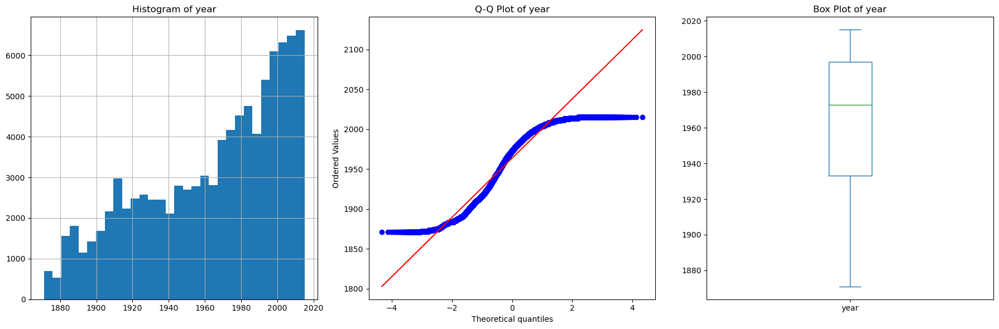

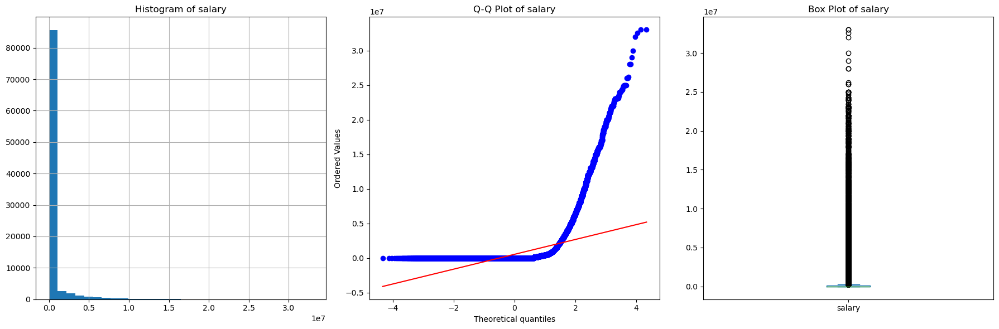

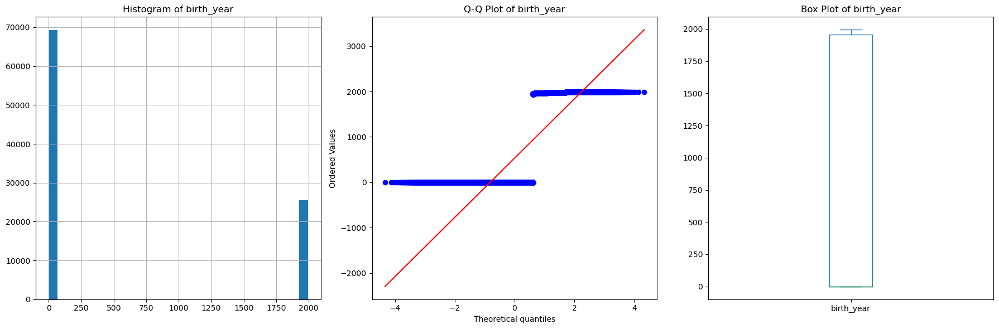

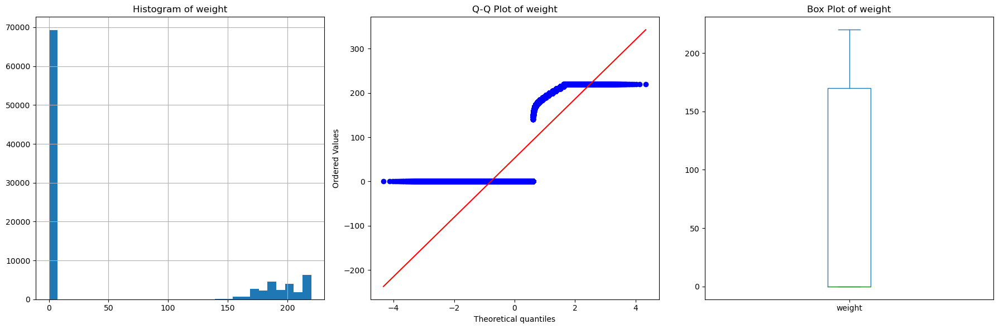

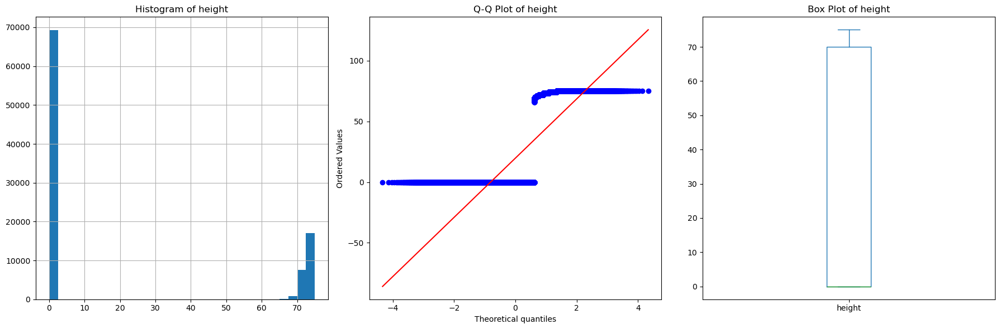

...

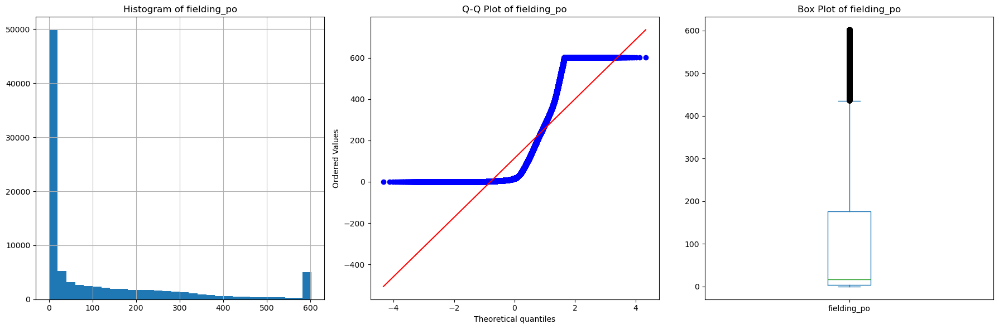

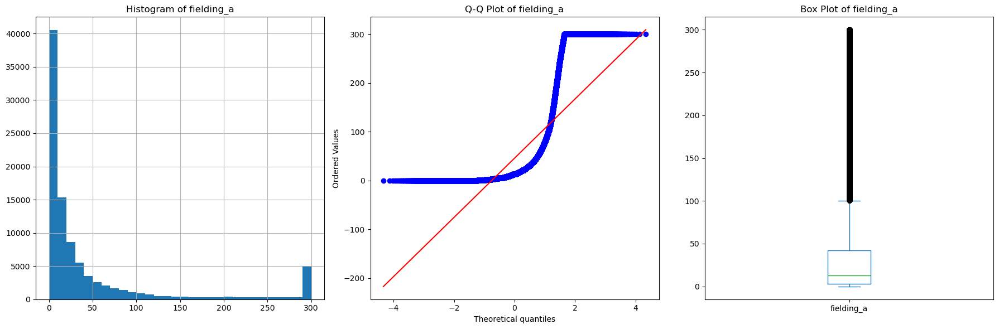

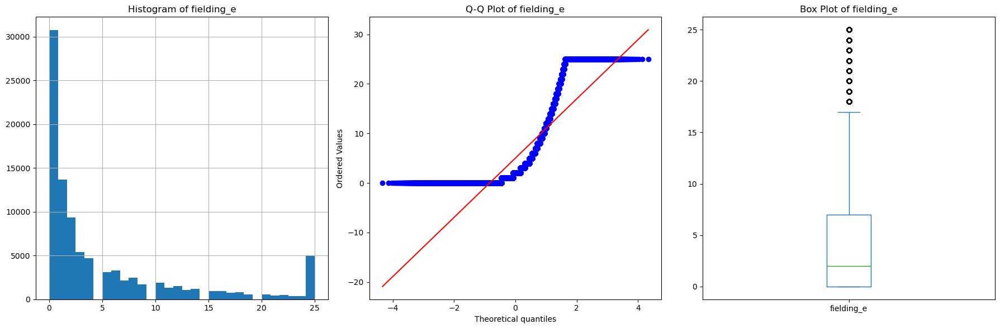

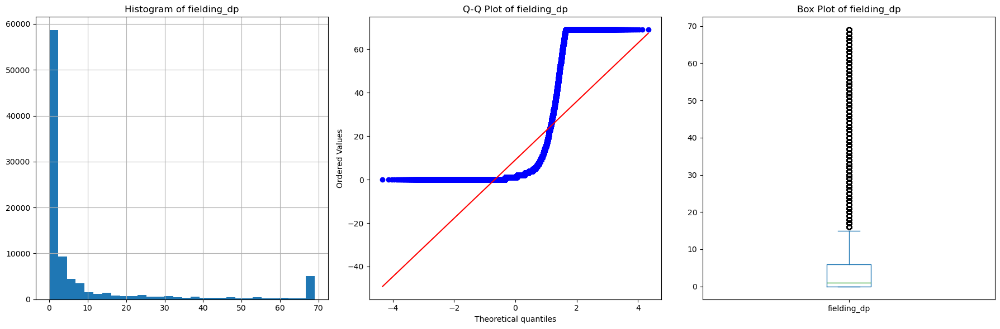

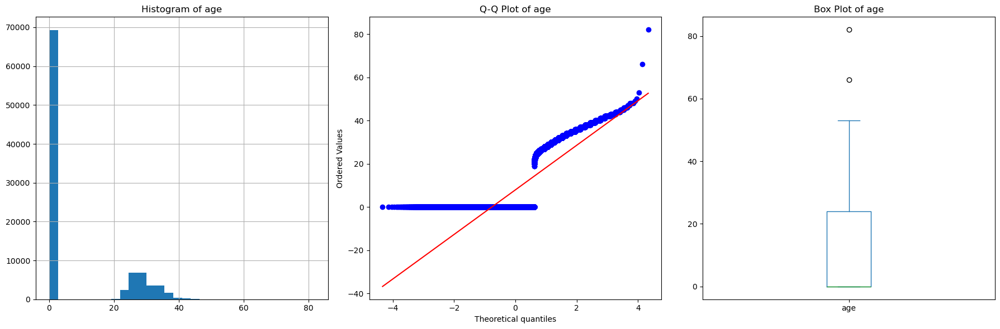

In [73]:
# Plot again to see if it is better after transformation
for variable in merged_df[num_cols].columns:
    diagnostic_plots(merged_df, variable)

In [74]:
# Winsorizing again with those that still have outliers v2 (outer)

# Define the variables to be trimmed
#variables_to_trim = ['batting_ab', 'batting_r', 'batting_double','batting_hr',
#                           'batting_rbi', 'batting_bb', 'batting_so',
#                           'pitching_gs', 'pitching_w', 'pitching_l', 'pitching_ipouts', 'pitching_h', 'pitching_er',
#                           'pitching_hr', 'pitching_bb', 'pitching_so','pitching_wp',
#                           'pitching_hbp', 'fielding_gs', 'fielding_po', 'fielding_a', 'fielding_e', 'fielding_dp']

# Apply Winsorization
#winsorizer = Winsorizer(capping_method ='quantiles', 
#                        tail='both', # cap left, right or both tails
#                        fold =0.05,
#                        variables=['batting_ab', 'batting_r', 'batting_double','batting_hr',
#                           'batting_rbi', 'batting_bb', 'batting_so',
#                           'pitching_gs', 'pitching_w', 'pitching_l', 'pitching_ipouts', 'pitching_h', 'pitching_er',
#                           'pitching_hr', 'pitching_bb', 'pitching_so','pitching_wp',
#                           'pitching_hbp', 'fielding_gs', 'fielding_po', 'fielding_a', 'fielding_e', 'fielding_dp'])

#winsorizer.fit(merged_df[variables_to_trim])

In [75]:
#merged_df_selected_cols = winsorizer.transform(merged_df[variables_to_trim])

In [76]:
# Combine the winsorized columns back with the original DataFrame
#for col in variables_to_trim:
#    merged_df[col] = merged_df_selected_cols[col]

In [77]:
# Verify all columns are present
#print(merged_df.columns)

In [78]:
# Plot again to see if it is better after transformation
#for variable in merged_df[num_cols].columns:
#    diagnostic_plots(merged_df, variable)

 ### 3.2.2 Trimming Method <a id="3.2.2"></a>
[Back to Content](#Table-of-Content_01)

- **Definition:** Trimming is a statistical technique where extreme values (outliers) are removed from a dataset.
- **Method:** It involves cutting off a specified percentage of data points from both the lower and upper ends of the dataset (e.g., removing the lowest and highest 5% of values).
- **Purpose:** The goal is to minimize the influence of outliers that could skew statistical results, particularly in measures like the mean or standard deviation.
- **Application:** Trimming is often used when outliers are considered to be errors or anomalies that do not represent the true nature of the data.
- **Outcome:** By removing the extreme values, trimming provides a cleaner dataset for analysis, but it can reduce the overall sample size.

In [79]:
# Experimented and found it not helping. 
# Function to find boundaries for outliers
#def find_boundaries(df, variable, distance):
        
#        IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)
#        lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
#        upper_boundary = df[variable].quantile(0.75) + (IQR * distance)
    
#        return upper_boundary, lower_boundary

In [80]:
# Function to flag outliers for a given variable
#def flag_outliers(df, variable, upper_limit, lower_limit):
#    return np.where(df[variable] > upper_limit, True, np.where(df[variable] < lower_limit, True, False))

In [81]:
# List of variables to trim
#variables_to_trim = ['batting_triple', 'batting_hr', 'batting_rbi', 'batting_sb', 'batting_cs', 
#                    'batting_bb', 'batting_so', 'batting_ibb', 'batting_hbp', 'pitching_gs', 'pitching_w', 'pitching_l', 'pitching_ipouts',
#                    'pitching_h', 'pitching_er', 'pitching_hr', 'pitching_bb', 'pitching_so', 'pitching_ibb', 'pitching_wp', 'pitching_hbp',
#                    'fielding_gs', 'fielding_po', 'fielding_a', 'fielding_e', 'fielding_dp']

In [82]:
# Function to trim outliers for multiple variables
#def trim_outliers_multiple(df, variables, distance=1.5):
#    for variable in variables:
#        upper_limit, lower_limit = find_boundaries(df, variable, distance)
#        outliers = flag_outliers(df, variable, upper_limit, lower_limit)
#        df = df.loc[~outliers]
#    return df

In [83]:
# Apply trimming function
#merged_df_trim_cols = trim_outliers_multiple(merged_df, variables_to_trim)

In [84]:
# Combine the trimmed columns back with the original DataFrame
#for col in variables_to_trim:
#    merged_df[col] = merged_df_trim_cols[col]

In [85]:
# Verify all columns are present
#print(merged_df.columns)

In [86]:
# Plot again to see if it is better after transformation
#for variable in merged_df[num_cols].columns:
#    diagnostic_plots(merged_df, variable)

## 3.3 Train And Test Split <a id="3.3"></a>
[Back to Content](#Table-of-Content_01)

In [87]:
# Separate the data into training (70%) and testing sets (30%)
# Target Variable is "salary"
merged_df['salary'] = merged_df['salary'] / 1000
X_train, X_test, y_train, y_test = train_test_split(
    merged_df.drop('salary', axis=1), merged_df['salary'], test_size=0.3, random_state=0)

I divided the salary values by 1000 to make the data easier to read and interpret. By scaling down the salary, which is very large numbers, I simplified the values, making it more manageable during analysis.

In [88]:
X_train.shape, X_test.shape

((66349, 45), (28436, 45))

In [89]:
y_train.shape, y_test.shape

((66349,), (28436,))

## 3.4 Missing Value Imputation <a id="3.4"></a>
[Back to Content](#Table-of-Content_01)

In [90]:
# Find categorical variables 
train_cat_cols = [c for c in X_train.columns if merged_df[c].dtypes=='O']
X_train[train_cat_cols].isnull().mean().sort_values()

player_id    0.0
team_id      0.0
league_id    0.0
bats         0.0
throws       0.0
dtype: float64

In [91]:
# find numerical variables
train_num_cols = [c for c in X_train.columns if merged_df[c].dtypes!='object']
X_train[train_num_cols].isnull().mean().sort_values()

year               0.0
pitching_ipouts    0.0
pitching_h         0.0
pitching_er        0.0
pitching_hr        0.0
pitching_bb        0.0
pitching_so        0.0
pitching_baopp     0.0
pitching_l         0.0
pitching_era       0.0
pitching_wp        0.0
pitching_hbp       0.0
fielding_g         0.0
fielding_gs        0.0
fielding_po        0.0
fielding_a         0.0
fielding_e         0.0
pitching_ibb       0.0
pitching_w         0.0
pitching_gs        0.0
pitching_g         0.0
birth_year         0.0
weight             0.0
height             0.0
batting_g          0.0
batting_ab         0.0
batting_r          0.0
batting_h          0.0
batting_double     0.0
batting_triple     0.0
batting_hr         0.0
batting_rbi        0.0
batting_sb         0.0
batting_cs         0.0
batting_bb         0.0
batting_so         0.0
batting_ibb        0.0
batting_hbp        0.0
fielding_dp        0.0
age                0.0
dtype: float64

In [92]:
# Find the percentage of missing data within those variables
X_train.isnull().mean().sort_values(ascending=True)

player_id          0.0
pitching_gs        0.0
pitching_w         0.0
pitching_l         0.0
pitching_ipouts    0.0
pitching_h         0.0
pitching_er        0.0
pitching_hr        0.0
pitching_bb        0.0
pitching_so        0.0
pitching_baopp     0.0
pitching_era       0.0
pitching_ibb       0.0
pitching_wp        0.0
pitching_hbp       0.0
fielding_g         0.0
fielding_gs        0.0
fielding_po        0.0
fielding_a         0.0
fielding_e         0.0
pitching_g         0.0
fielding_dp        0.0
batting_hbp        0.0
batting_so         0.0
year               0.0
team_id            0.0
league_id          0.0
birth_year         0.0
weight             0.0
height             0.0
bats               0.0
throws             0.0
batting_g          0.0
batting_ab         0.0
batting_r          0.0
batting_h          0.0
batting_double     0.0
batting_triple     0.0
batting_hr         0.0
batting_rbi        0.0
batting_sb         0.0
batting_cs         0.0
batting_bb         0.0
batting_ibb

In [93]:
# Identify columns with missing values
# Numerical variables lists
features_num_arbitrary = ['batting_hr', 'batting_double', 'batting_bb', 'batting_rbi', 'batting_r',
                          'fielding_dp', 'batting_h', 'fielding_e', 'batting_so', 'batting_ab',
                          'fielding_po', 'fielding_a', 'batting_g']  # High missing data, less sensitive to arbitrary

# Categorical variables lists
features_cat_frequent = ['bats', 'throws', 'team_id', 'league_id']  # Lower missing values, can use the most frequent category

In [94]:
# Assembling an imputation pipeline with scikit-learn
pipe = Pipeline(steps=[
    ('imp_num_arbitrary', mdi.ArbitraryNumberImputer(variables = features_num_arbitrary)),
    ('imp_cat_frequent', mdi.CategoricalImputer(variables = features_cat_frequent, imputation_method='frequent')),
])

In [95]:
# now we fit the preprocessor
pipe.fit(X_train)

Pipeline(steps=[('imp_num_arbitrary',
                 ArbitraryNumberImputer(variables=['batting_hr',
                                                   'batting_double',
                                                   'batting_bb', 'batting_rbi',
                                                   'batting_r', 'fielding_dp',
                                                   'batting_h', 'fielding_e',
                                                   'batting_so', 'batting_ab',
                                                   'fielding_po', 'fielding_a',
                                                   'batting_g'])),
                ('imp_cat_frequent',
                 CategoricalImputer(imputation_method='frequent',
                                    variables=['bats', 'throws', 'team_id',
                                               'league_id']))])

In [96]:
# and now we impute the data
X_train = pipe.transform(X_train)
X_test = pipe.transform(X_test)

In [97]:
X_test.isnull().sum()

player_id          0
year               0
team_id            0
league_id          0
birth_year         0
weight             0
height             0
bats               0
throws             0
batting_g          0
batting_ab         0
batting_r          0
batting_h          0
batting_double     0
batting_triple     0
batting_hr         0
batting_rbi        0
batting_sb         0
batting_cs         0
batting_bb         0
batting_so         0
batting_ibb        0
batting_hbp        0
pitching_g         0
pitching_gs        0
pitching_w         0
pitching_l         0
pitching_ipouts    0
pitching_h         0
pitching_er        0
pitching_hr        0
pitching_bb        0
pitching_so        0
pitching_baopp     0
pitching_era       0
pitching_ibb       0
pitching_wp        0
pitching_hbp       0
fielding_g         0
fielding_gs        0
fielding_po        0
fielding_a         0
fielding_e         0
fielding_dp        0
age                0
dtype: int64

In [98]:
X_train.isnull().sum()

player_id          0
year               0
team_id            0
league_id          0
birth_year         0
weight             0
height             0
bats               0
throws             0
batting_g          0
batting_ab         0
batting_r          0
batting_h          0
batting_double     0
batting_triple     0
batting_hr         0
batting_rbi        0
batting_sb         0
batting_cs         0
batting_bb         0
batting_so         0
batting_ibb        0
batting_hbp        0
pitching_g         0
pitching_gs        0
pitching_w         0
pitching_l         0
pitching_ipouts    0
pitching_h         0
pitching_er        0
pitching_hr        0
pitching_bb        0
pitching_so        0
pitching_baopp     0
pitching_era       0
pitching_ibb       0
pitching_wp        0
pitching_hbp       0
fielding_g         0
fielding_gs        0
fielding_po        0
fielding_a         0
fielding_e         0
fielding_dp        0
age                0
dtype: int64

In [99]:
X_train

,player_id,year,team_id,league_id,birth_year,weight,height,bats,throws,batting_g,batting_ab,batting_r,batting_h,batting_double,batting_triple,batting_hr,batting_rbi,batting_sb,batting_cs,batting_bb,batting_so,batting_ibb,batting_hbp,pitching_g,pitching_gs,pitching_w,pitching_l,pitching_ipouts,pitching_h,pitching_er,pitching_hr,pitching_bb,pitching_so,pitching_baopp,pitching_era,pitching_ibb,pitching_wp,pitching_hbp,fielding_g,fielding_gs,fielding_po,fielding_a,fielding_e,fielding_dp,age
88400,wadderu01,1901,0,0,0.0,0.0,0.0,0,0,32.0,101.0,16.0,25.0,3.0,3.0,2.0,14.0,2.0,0.0,2.0,0.0,0.0,0.0,31.0,30.0,13.0,12.0,636.0,210.0,84.0,5.0,70.0,114.0,0.2800,6.10,0.0,6.0,6.0,32.0,0.0,38.0,66.0,5.0,1.0,0.0
29725,gaudich01,2009,0,0,0.0,0.0,0.0,0,0,31.0,28.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,14.0,0.0,0.0,31.0,25.0,6.0,10.0,442.0,146.0,76.0,14.0,70.0,114.0,0.2565,4.28,4.0,6.0,6.0,31.0,0.0,12.0,21.0,2.0,2.0,0.0
41520,jamesdi01,1984,0,0,0.0,0.0,0.0,0,0,128.0,387.0,52.0,114.0,19.0,5.0,1.0,30.0,10.0,10.0,32.0,41.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.00,0.0,0.0,0.0,186.0,144.0,504.0,13.0,6.0,2.0,0.0
56551,mechegi01,2007,KCA,AL,1978.0,180.0,75.0,R,R,34.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,34.0,31.0,9.0,12.0,636.0,210.0,87.0,17.0,62.0,114.0,0.2630,3.67,2.0,3.0,3.0,34.0,0.0,15.0,22.0,3.0,5.0,29.0
43340,jonestr01,1990,DET,AL,1961.0,180.0,75.0,R,R,75.0,204.0,23.0,53.0,8.0,1.0,6.0,24.0,1.0,2.0,9.0,25.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.00,0.0,0.0,0.0,116.0,72.0,134.0,6.0,4.0,0.0,29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21243,devinjo01,2011,0,0,0.0,0.0,0.0,0,0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26.0,0.0,1.0,1.0,69.0,18.0,9.0,0.0,11.0,20.0,0.2140,3.52,0.0,0.0,2.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0
45891,knabeot01,1907,0,0,0.0,0.0,0.0,0,0,129.0,444.0,67.0,113.0,16.0,9.0,1.0,34.0,18.0,0.0,52.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.00,0.0,0.0,0.0,126.0,0.0,301.0,300.0,25.0,54.0,0.0
42613,johnsni01,2012,BAL,AL,1978.0,220.0,75.0,L,L,38.0,87.0,9.0,18.0,4.0,0.0,4.0,11.0,2.0,0.0,11.0,26.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.00,0.0,0.0,0.0,5.0,0.0,51.0,3.0,1.0,7.0,34.0
43567,joycebi01,1897,0,0,0.0,0.0,0.0,0,0,109.0,388.0,85.0,118.0,15.0,13.0,3.0,64.0,33.0,0.0,61.0,0.0,0.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.00,0.0,0.0,0.0,108.0,0.0,187.0,199.0,25.0,19.0,0.0


In [100]:
X_test

,player_id,year,team_id,league_id,birth_year,weight,height,bats,throws,batting_g,batting_ab,batting_r,batting_h,batting_double,batting_triple,batting_hr,batting_rbi,batting_sb,batting_cs,batting_bb,batting_so,batting_ibb,batting_hbp,pitching_g,pitching_gs,pitching_w,pitching_l,pitching_ipouts,pitching_h,pitching_er,pitching_hr,pitching_bb,pitching_so,pitching_baopp,pitching_era,pitching_ibb,pitching_wp,pitching_hbp,fielding_g,fielding_gs,fielding_po,fielding_a,fielding_e,fielding_dp,age
75390,sandesc01,1993,NYA,AL,1956.0,195.0,75.0,R,R,32.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,11.0,0.0,0.0,32.0,29.0,11.0,12.0,552.0,201.0,86.0,17.0,34.0,102.0,0.265,3.985,5.0,1.0,6.0,32.0,29.0,13.0,23.0,2.0,1.0,37.0
20990,dennyjo01,1984,0,0,0.0,0.0,0.0,0,0,22.0,47.0,3.0,9.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,11.0,0.0,0.0,22.0,22.0,7.0,7.0,463.0,122.0,42.0,11.0,29.0,94.0,0.210,2.450,2.0,0.0,4.0,22.0,22.0,20.0,36.0,1.0,2.0,0.0
46654,krawcra01,1986,PIT,NL,1959.0,184.0,73.0,R,R,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,1.0,37.0,17.0,10.0,3.0,10.0,7.0,0.320,7.300,0.0,0.0,0.0,12.0,0.0,2.0,0.0,1.0,0.0,27.0
23989,eggerel01,1927,0,0,0.0,0.0,0.0,0,0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
90130,weilmca01,1917,0,0,0.0,0.0,0.0,0,0,5.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,5.0,3.0,1.0,2.0,57.0,19.0,4.0,1.0,6.0,9.0,0.260,1.890,0.0,0.0,0.0,5.0,0.0,0.0,10.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53256,martihe02,1963,0,0,0.0,0.0,0.0,0,0,6.0,14.0,2.0,4.0,0.0,0.0,1.0,3.0,0.0,1.0,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.0,0.0,6.0,6.0,13.0,0.0,0.0,0.0,0.0
17557,corsiji01,1998,BOS,AL,1961.0,210.0,73.0,R,R,59.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49.0,0.0,3.0,2.0,198.0,58.0,19.0,6.0,23.0,49.0,0.000,2.590,2.0,3.0,1.0,59.0,0.0,3.0,16.0,2.0,2.0,37.0
5288,bellga01,1960,0,0,0.0,0.0,0.0,0,0,30.0,47.0,6.0,7.0,1.0,0.0,0.0,3.0,1.0,0.0,2.0,9.0,0.0,1.0,28.0,23.0,9.0,10.0,464.0,139.0,71.0,15.0,70.0,109.0,0.240,4.130,2.0,6.0,6.0,28.0,23.0,11.0,26.0,2.0,4.0,0.0
52606,manuech01,1974,0,0,0.0,0.0,0.0,0,0,4.0,3.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [101]:
y_train.isnull().mean()

0.0

In [102]:
y_test.isnull().mean()

0.0

## 3.5 Categorical Encoding <a id="3.5"></a>
[Back to Content](#Table-of-Content_01)

In [103]:
X_train.head()

,player_id,year,team_id,league_id,birth_year,weight,height,bats,throws,batting_g,batting_ab,batting_r,batting_h,batting_double,batting_triple,batting_hr,batting_rbi,batting_sb,batting_cs,batting_bb,batting_so,batting_ibb,batting_hbp,pitching_g,pitching_gs,pitching_w,pitching_l,pitching_ipouts,pitching_h,pitching_er,pitching_hr,pitching_bb,pitching_so,pitching_baopp,pitching_era,pitching_ibb,pitching_wp,pitching_hbp,fielding_g,fielding_gs,fielding_po,fielding_a,fielding_e,fielding_dp,age
88400,wadderu01,1901,0,0,0.0,0.0,0.0,0,0,32.0,101.0,16.0,25.0,3.0,3.0,2.0,14.0,2.0,0.0,2.0,0.0,0.0,0.0,31.0,30.0,13.0,12.0,636.0,210.0,84.0,5.0,70.0,114.0,0.2800,6.10,0.0,6.0,6.0,32.0,0.0,38.0,66.0,5.0,1.0,0.0
29725,gaudich01,2009,0,0,0.0,0.0,0.0,0,0,31.0,28.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,14.0,0.0,0.0,31.0,25.0,6.0,10.0,442.0,146.0,76.0,14.0,70.0,114.0,0.2565,4.28,4.0,6.0,6.0,31.0,0.0,12.0,21.0,2.0,2.0,0.0
41520,jamesdi01,1984,0,0,0.0,0.0,0.0,0,0,128.0,387.0,52.0,114.0,19.0,5.0,1.0,30.0,10.0,10.0,32.0,41.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.00,0.0,0.0,0.0,186.0,144.0,504.0,13.0,6.0,2.0,0.0
56551,mechegi01,2007,KCA,AL,1978.0,180.0,75.0,R,R,34.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,34.0,31.0,9.0,12.0,636.0,210.0,87.0,17.0,62.0,114.0,0.2630,3.67,2.0,3.0,3.0,34.0,0.0,15.0,22.0,3.0,5.0,29.0
43340,jonestr01,1990,DET,AL,1961.0,180.0,75.0,R,R,75.0,204.0,23.0,53.0,8.0,1.0,6.0,24.0,1.0,2.0,9.0,25.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.00,0.0,0.0,0.0,116.0,72.0,134.0,6.0,4.0,0.0,29.0


In [104]:
# Define columns to drop
columns_to_drop = ['pitching_gs', 'pitching_w', 'pitching_l', 'pitching_ipouts', 'pitching_h', 'pitching_er',
                   'pitching_hr', 'pitching_bb', 'pitching_so', 'pitching_baopp', 'pitching_era', 'pitching_ibb',
                   'pitching_wp', 'pitching_hbp', 'fielding_gs', 'fielding_dp', 'batting_hbp', 'batting_so',
                   'batting_ibb', 'batting_triple', 'player_id']

# Drop the columns
X_train = X_train.drop(columns=columns_to_drop)

In [105]:
# Define columns to drop
columns_to_drop = ['pitching_gs', 'pitching_w', 'pitching_l', 'pitching_ipouts', 'pitching_h', 'pitching_er',
                   'pitching_hr', 'pitching_bb', 'pitching_so', 'pitching_baopp', 'pitching_era', 'pitching_ibb',
                   'pitching_wp', 'pitching_hbp', 'fielding_gs', 'fielding_dp', 'batting_hbp', 'batting_so',
                   'batting_ibb', 'batting_triple', 'player_id']

# Drop the columns
X_test = X_test.drop(columns=columns_to_drop)

In [106]:
# Check how many rows and columns there are in X_train
num_rows, num_columns = X_train.shape
print(f'The merged DataFrame has {num_rows} rows and {num_columns} columns.')

The merged DataFrame has 66349 rows and 24 columns.


In [107]:
# Check how many rows and columns there are in X_test.
num_rows, num_columns = X_test.shape
print(f'The merged DataFrame has {num_rows} rows and {num_columns} columns.')

The merged DataFrame has 28436 rows and 24 columns.


### 3.5.1 Ordinal Encoding <a id="3.5.1"></a>
[Back to Content](#Table-of-Content_01)

In [108]:
# Encode X_train & X_test using ordinal / label encoding
# Using Feature Engine
# Create the ordinal encoder specifying the variables to encode
#ordinal_enc = OrdinalEncoder(
#    #encoding_method='arbitrary',
#    variables=['bats', 'throws']
#)

In [109]:
# Combine training and test sets for consistent encoding
#X_train_combine = pd.concat([X_train,X_test],ignore_index=True)
#y_train_combine = pd.concat([y_train,y_test],ignore_index=True)

In [110]:
#X_train_combine[['bats', 'throws']].isnull().mean()

In [111]:
# Check the shapes of X_train_combine and y_train_combine before fitting
#print("Shape of X_train_combine:", X_train_combine.shape)
#print("Shape of y_train_combine:", y_train_combine.shape)

In [112]:
#ordinal_enc.fit(X_train_combine, y_train_combine)

In [113]:
# let's inspect which variables the encoder will encode
#ordinal_enc.variables

In [114]:
# in the encoder dict we can observe the numbers
# assigned to each category for all the indicated variables
#ordinal_enc.encoder_dict_

In [115]:
# transform combined data
#X_combined_enc = ordinal_enc.transform(X_train_combine)

In [116]:
# split the encoded data back into training and testing data sets
#X_train = X_combined_enc.iloc[:len(X_train)]
#X_test = X_combined_enc.iloc[len(X_train):]

In [117]:
X_train.head()

,year,team_id,league_id,birth_year,weight,height,bats,throws,batting_g,batting_ab,batting_r,batting_h,batting_double,batting_hr,batting_rbi,batting_sb,batting_cs,batting_bb,pitching_g,fielding_g,fielding_po,fielding_a,fielding_e,age
88400,1901,0,0,0.0,0.0,0.0,0,0,32.0,101.0,16.0,25.0,3.0,2.0,14.0,2.0,0.0,2.0,31.0,32.0,38.0,66.0,5.0,0.0
29725,2009,0,0,0.0,0.0,0.0,0,0,31.0,28.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,31.0,31.0,12.0,21.0,2.0,0.0
41520,1984,0,0,0.0,0.0,0.0,0,0,128.0,387.0,52.0,114.0,19.0,1.0,30.0,10.0,10.0,32.0,0.0,186.0,504.0,13.0,6.0,0.0
56551,2007,KCA,AL,1978.0,180.0,75.0,R,R,34.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,34.0,15.0,22.0,3.0,29.0
43340,1990,DET,AL,1961.0,180.0,75.0,R,R,75.0,204.0,23.0,53.0,8.0,6.0,24.0,1.0,2.0,9.0,0.0,116.0,134.0,6.0,4.0,29.0


In [118]:
X_test.head()

,year,team_id,league_id,birth_year,weight,height,bats,throws,batting_g,batting_ab,batting_r,batting_h,batting_double,batting_hr,batting_rbi,batting_sb,batting_cs,batting_bb,pitching_g,fielding_g,fielding_po,fielding_a,fielding_e,age
75390,1993,NYA,AL,1956.0,195.0,75.0,R,R,32.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,32.0,32.0,13.0,23.0,2.0,37.0
20990,1984,0,0,0.0,0.0,0.0,0,0,22.0,47.0,3.0,9.0,0.0,0.0,4.0,0.0,0.0,1.0,22.0,22.0,20.0,36.0,1.0,0.0
46654,1986,PIT,NL,1959.0,184.0,73.0,R,R,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,12.0,2.0,0.0,1.0,27.0
23989,1927,0,0,0.0,0.0,0.0,0,0,5.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
90130,1917,0,0,0.0,0.0,0.0,0,0,5.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,10.0,1.0,0.0


### 3.5.2 One Hot Encoding <a id="3.5.2"></a>
[Back to Content](#Table-of-Content_01)

One-hot encoding converts each category in a categorical variable into a new binary column. Each column represents a single category, with 1 indicating the presence of that category and 0 indicating its absence.

In [119]:
# One Hot Encoding
# let's create the encoder
ohe_enc = OneHotEncoder(
    top_categories=None,
    drop_last=True) # to return k-1, false to return k

In [120]:
X_train_combine = pd.concat([X_train,X_test],ignore_index=True)
y_train_combine = pd.concat([y_train,y_test],ignore_index=True)

In [121]:
# Check the shapes of X_train_combine and y_train_combine before fitting
print("Shape of X_train_combine:", X_train_combine.shape)
print("Shape of y_train_combine:", y_train_combine.shape)

Shape of X_train_combine: (94785, 24)
Shape of y_train_combine: (94785,)


In [122]:
# categories to encode
ohe_enc.fit(X_train_combine, y_train_combine)

OneHotEncoder(drop_last=True)

In [123]:
# we can see which variables the encoder will encode
ohe_enc.variables_

['team_id', 'league_id', 'bats', 'throws']

In [124]:
# let's transform train and test set
#X_train = ohe_enc.transform(X_train)
#X_test = ohe_enc.transform(X_test)
X_combined_enc = ohe_enc.transform(X_train_combine)

In [125]:
# split the encoded data back into training and testing data sets
X_train = X_combined_enc.iloc[:len(X_train)]
X_test = X_combined_enc.iloc[len(X_train):]

In [126]:
# Check how many rows and columns there are in X_train
num_rows, num_columns = X_train.shape
print(f'The merged DataFrame has {num_rows} rows and {num_columns} columns.')

The merged DataFrame has 66349 rows and 62 columns.


In [127]:
# Check how many rows and columns there are in X_test.
num_rows, num_columns = X_test.shape
print(f'The merged DataFrame has {num_rows} rows and {num_columns} columns.')

The merged DataFrame has 28436 rows and 62 columns.


## 3.6 Yeo-Johnson Transformation <a id="3.6"></a>
[Back to Content](#Table-of-Content_01)

#### Usefulness of the Yeo-Johnson Transformation

#### Enhances Model Performance
- **Normalization**: YJT helps in adjusting data distributions to be more Gaussian-like, which is crucial for the optimal performance of many algorithms.
- **Variance Stabilization**: It stabilizes variance across the data, which is particularly beneficial for models that assume constant variance.

#### Increases Versatility
- **Handling Negative Values**: Unlike some transformations that are limited to positive data, YJT can be applied to data with both positive and negative values, making it more versatile.

#### Improves Parameter Estimation
- **Reliability**: By reducing skewness and stabilizing variance, YJT can lead to more reliable parameter estimates, which is essential for models like linear regression.

#### Aids in Data Interpretation
- **Statistical Methods**: The transformation makes it easier to apply and interpret classical statistical methods that assume normality, enhancing the clarity and effectiveness of analytical outcomes.

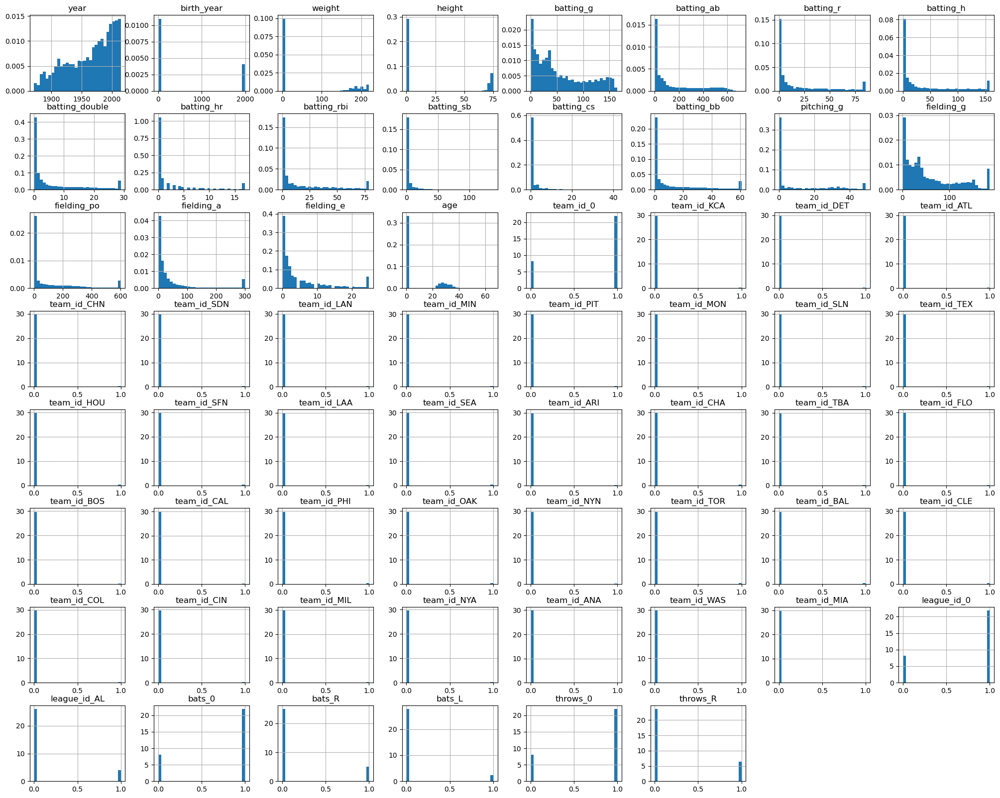

In [128]:
# visualize the variable distributions
X_train.hist(bins=30, figsize=(25,20), density=True)
plt.show()

In [129]:
# Apply Yeo-Johnson Transformation.
cols_to_transform = ['batting_hr', 'batting_rbi', 'batting_sb', 'batting_cs', 'batting_bb', 
                        'pitching_g', 'fielding_g', 'fielding_po', 'fielding_a', 'fielding_e']

# Initialize the transformer
yjt = YeoJohnsonTransformer(variables = cols_to_transform)

In [130]:
# fit transformer to the dataframe
yjt.fit(X_train)

YeoJohnsonTransformer(variables=['batting_hr', 'batting_rbi', 'batting_sb',
                                 'batting_cs', 'batting_bb', 'pitching_g',
                                 'fielding_g', 'fielding_po', 'fielding_a',
                                 'fielding_e'])

In [131]:
# transform indicated variables
X_train = yjt.transform(X_train)
X_test = yjt.transform(X_test)

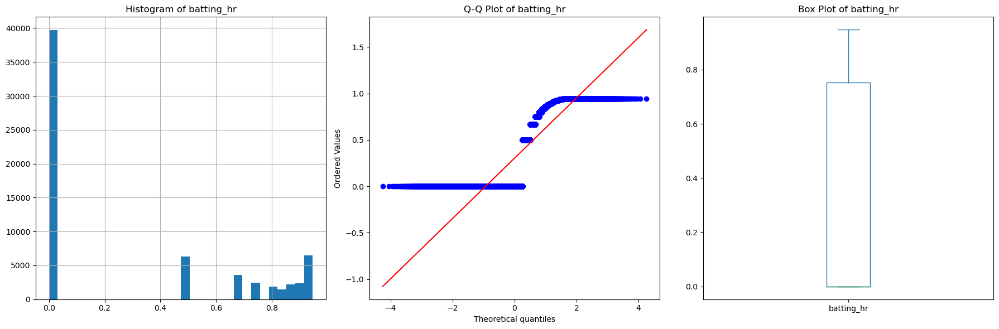

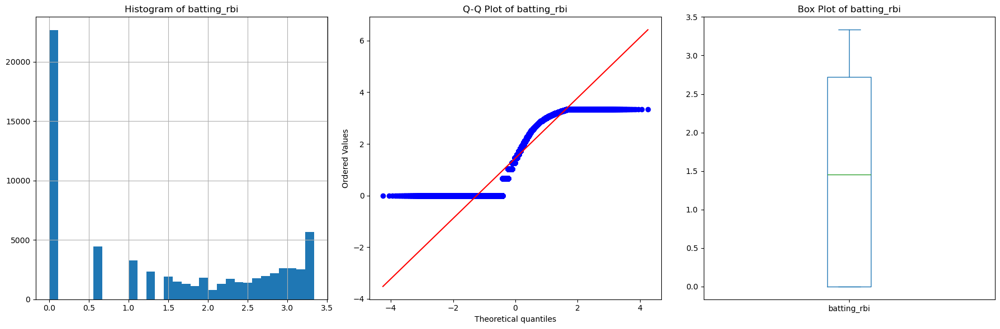

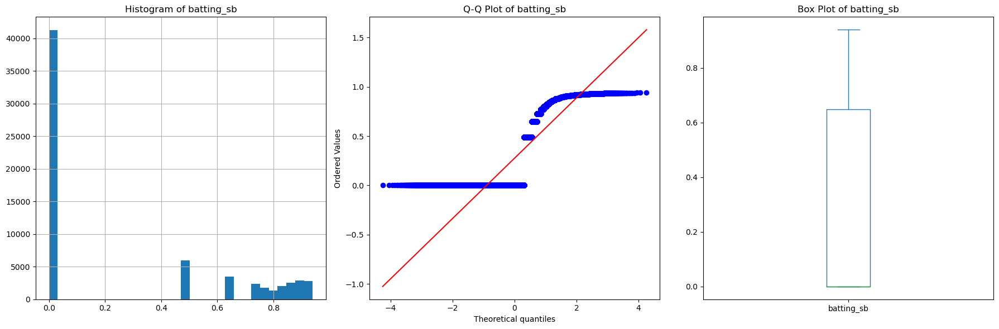

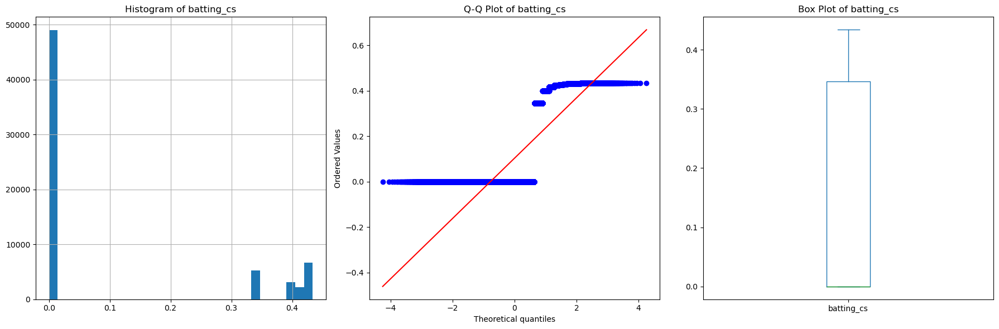

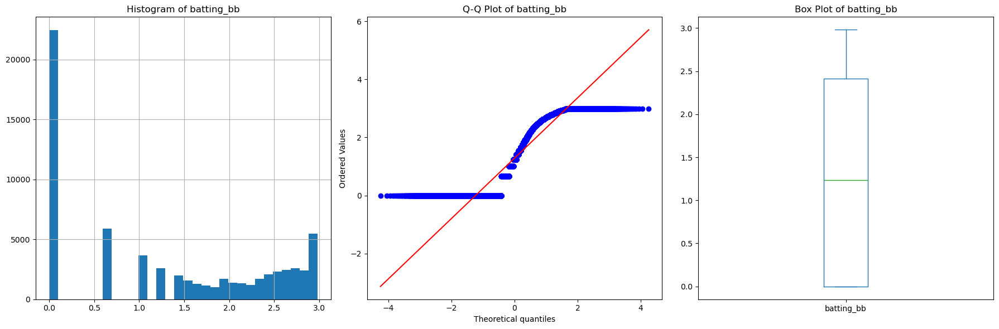

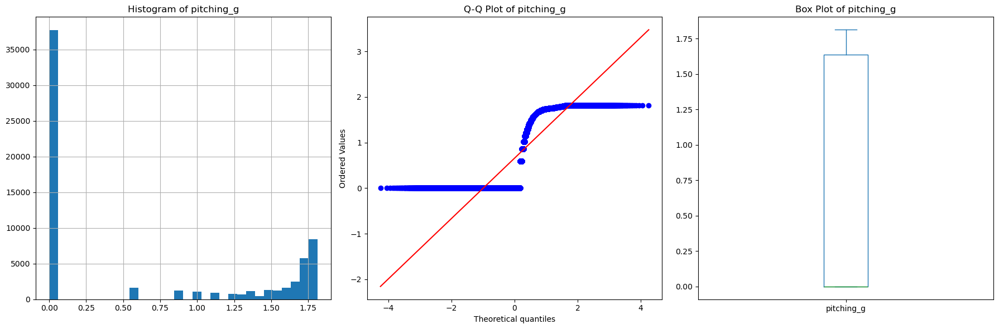

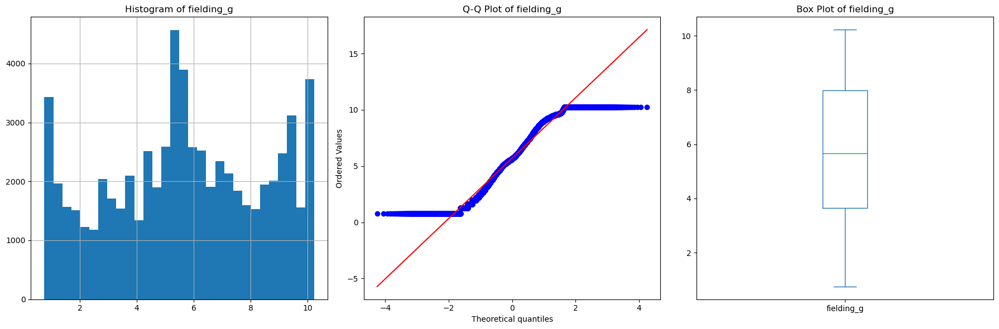

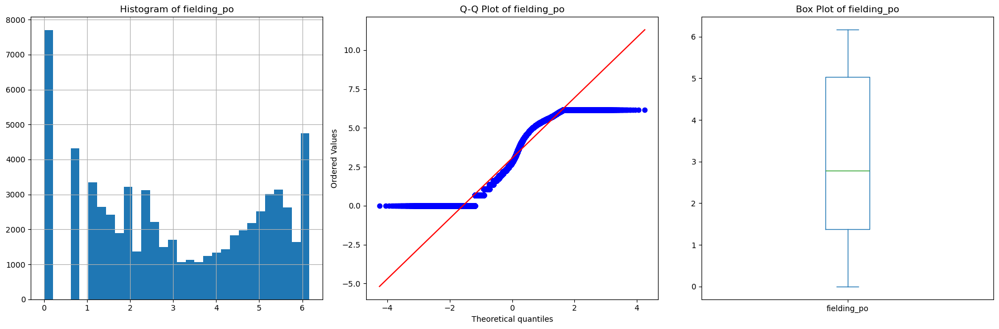

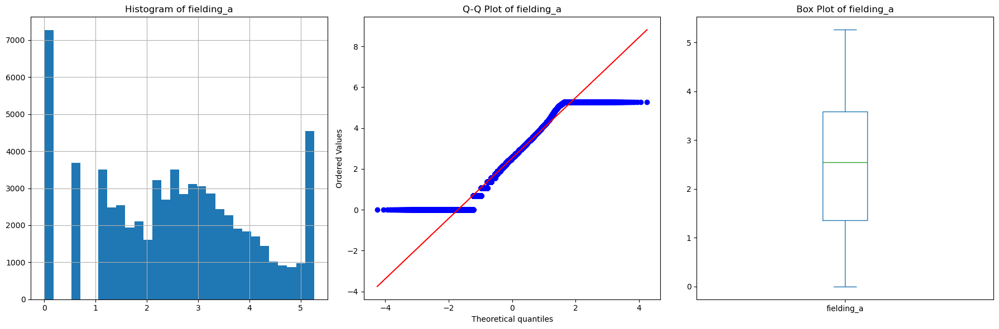

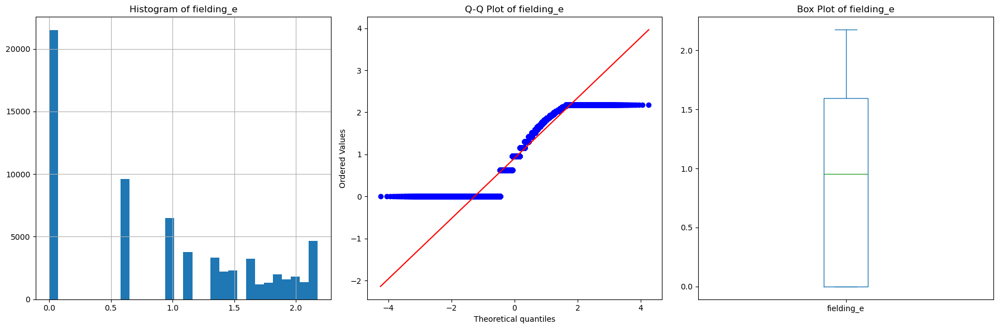

In [132]:
# make diagnostic plot of transformed variable
for variable in cols_to_transform:
    diagnostic_plots(X_train, variable)

## 3.7 Feature Scaling <a id="3.7"></a>
[Back to Content](#Table-of-Content_01)

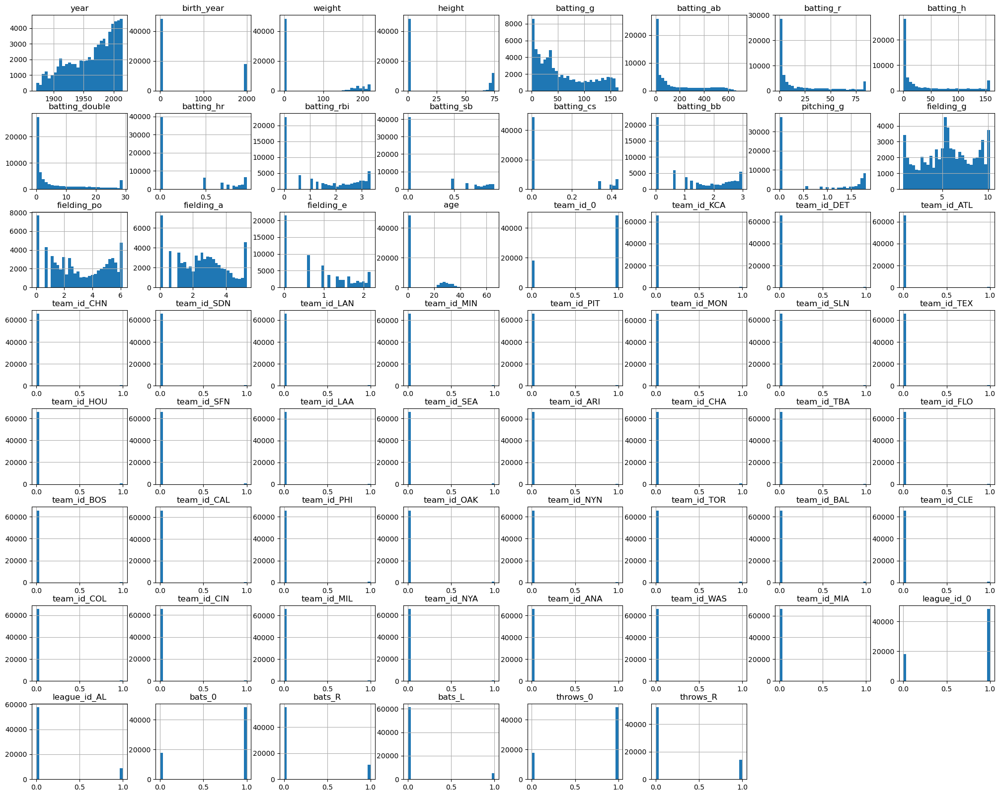

In [133]:
# plot the histogram to the num variables
# Identify numerical columns in the training dataset
train_num_cols = X_train.select_dtypes(include=[np.number]).columns

X_train[train_num_cols].hist(bins=30, figsize=(25,20))
plt.show()

### 3.7.1 Robust Scaling <a id="3.7.1"></a>
[Back to Content](#Table-of-Content_01)

Robust scaling is a data preprocessing technique used in machine learning to handle datasets with outliers. It scales the features of the data using statistics that are robust to outliers, making it a better choice when the dataset has extreme values or is not normally distributed.

In [134]:
# set up the scaler
scaler = RobustScaler()

# fit the scaler to the train set, it will learn the parameters
scaler.fit(X_train)

# transform train and test sets
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [135]:
scaler.center_

array([1.97300000e+03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       3.80000000e+01, 5.50000000e+01, 5.00000000e+00, 1.00000000e+01,
       1.00000000e+00, 0.00000000e+00, 1.45110261e+00, 0.00000000e+00,
       0.00000000e+00, 1.23723750e+00, 0.00000000e+00, 5.66084433e+00,
       2.78635391e+00, 2.54144251e+00, 9.51922388e-01, 0.00000000e+00,
       1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00,
      

In [136]:
# the scaler stores the standard deviation deviation of the features,
# learned from train set
scaler.scale_

array([6.30000000e+01, 1.95700000e+03, 1.70000000e+02, 7.00000000e+01,
       7.60000000e+01, 2.61000000e+02, 3.20000000e+01, 6.70000000e+01,
       1.10000000e+01, 7.51358919e-01, 2.72279108e+00, 6.49586388e-01,
       3.46069530e-01, 2.41330514e+00, 1.63703380e+00, 4.33664574e+00,
       3.65145641e+00, 2.22660239e+00, 1.59500416e+00, 2.40000000e+01,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
      

In [137]:
# the scaler stores the IQR values of the features as learned from train set
scaler.scale_

array([6.30000000e+01, 1.95700000e+03, 1.70000000e+02, 7.00000000e+01,
       7.60000000e+01, 2.61000000e+02, 3.20000000e+01, 6.70000000e+01,
       1.10000000e+01, 7.51358919e-01, 2.72279108e+00, 6.49586388e-01,
       3.46069530e-01, 2.41330514e+00, 1.63703380e+00, 4.33664574e+00,
       3.65145641e+00, 2.22660239e+00, 1.59500416e+00, 2.40000000e+01,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
      

In [138]:
# let's transform the returned NumPy arrays to dataframes
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

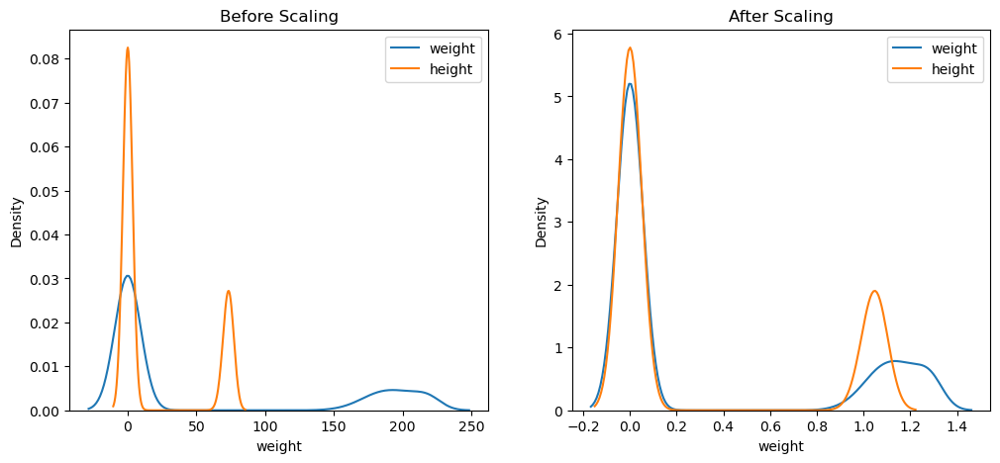

In [139]:
# let's compare the variable distributions before and after scaling
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(X_train['weight'], ax=ax1, label ='weight')
sns.kdeplot(X_train['height'], ax=ax1, label ='height')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(X_train_scaled['weight'], ax=ax2, label ='weight')
sns.kdeplot(X_train_scaled['height'], ax=ax2, label ='height')
ax2.legend()
plt.show()

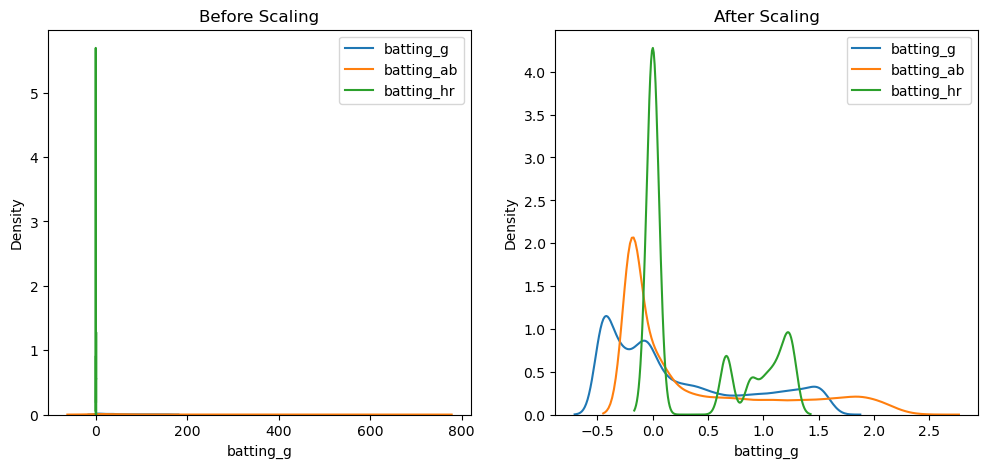

In [140]:
# let's compare the variable distributions before and after scaling
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(X_train['batting_g'], ax=ax1, label ='batting_g')
sns.kdeplot(X_train['batting_ab'], ax=ax1, label ='batting_ab')
sns.kdeplot(X_train['batting_hr'], ax=ax1, label ='batting_hr')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(X_train_scaled['batting_g'], ax=ax2, label ='batting_g')
sns.kdeplot(X_train_scaled['batting_ab'], ax=ax2, label ='batting_ab')
sns.kdeplot(X_train_scaled['batting_hr'], ax=ax2, label ='batting_hr')
ax2.legend()
plt.show()

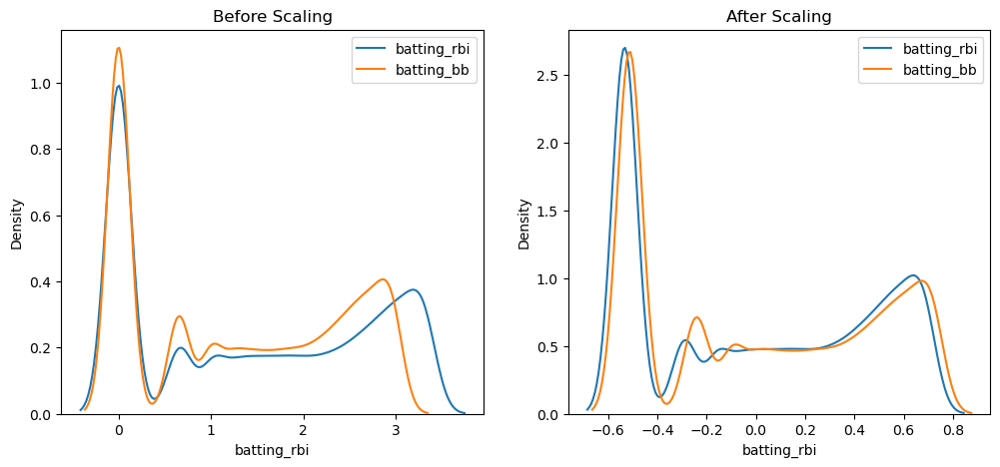

In [141]:
# let's compare the variable distributions before and after scaling
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(X_train['batting_rbi'], ax=ax1, label ='batting_rbi')
sns.kdeplot(X_train['batting_bb'], ax=ax1, label ='batting_bb')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(X_train_scaled['batting_rbi'], ax=ax2, label ='batting_rbi')
sns.kdeplot(X_train_scaled['batting_bb'], ax=ax2, label ='batting_bb')
ax2.legend()
plt.show()

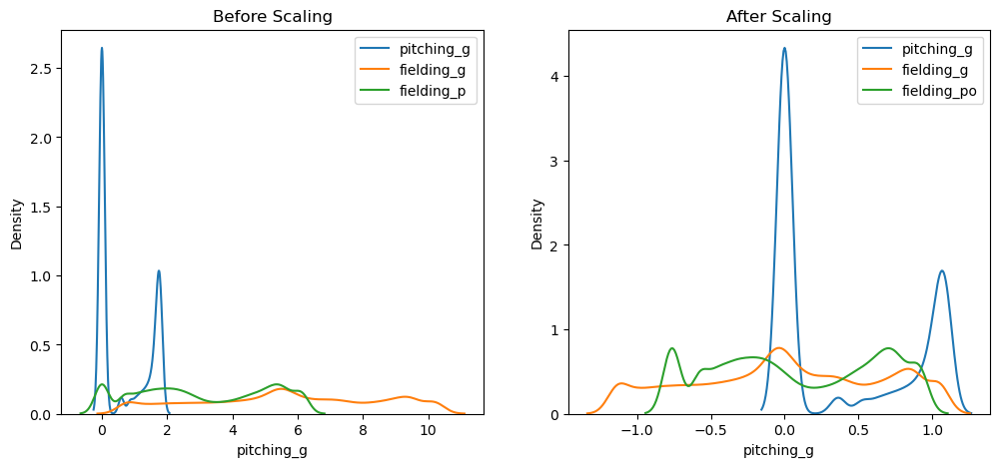

In [142]:
# let's compare the variable distributions before and after scaling
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(X_train['pitching_g'], ax=ax1, label ='pitching_g')
sns.kdeplot(X_train['fielding_g'], ax=ax1, label ='fielding_g')
sns.kdeplot(X_train['fielding_po'], ax=ax1, label ='fielding_p')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(X_train_scaled['pitching_g'], ax=ax2, label ='pitching_g')
sns.kdeplot(X_train_scaled['fielding_g'], ax=ax2, label ='fielding_g')
sns.kdeplot(X_train_scaled['fielding_po'], ax=ax2, label ='fielding_po')
ax2.legend()
plt.show()

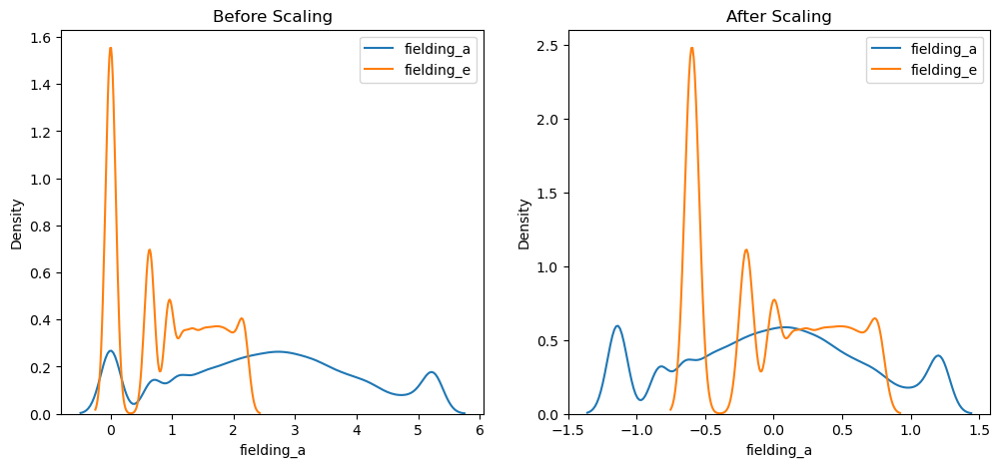

In [143]:
# let's compare the variable distributions before and after scaling
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(X_train['fielding_a'], ax=ax1, label ='fielding_a')
sns.kdeplot(X_train['fielding_e'], ax=ax1, label ='fielding_e')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(X_train_scaled['fielding_a'], ax=ax2, label ='fielding_a')
sns.kdeplot(X_train_scaled['fielding_e'], ax=ax2, label ='fielding_e')
ax2.legend()
plt.show()

### 3.7.2 Standardization <a id="3.7.2"></a>
[Back to Content](#Table-of-Content_01)

Standard scaling is a data preprocessing technique commonly used in machine learning to standardize the features of a dataset. The goal of standard scaling is to transform the features so that they have the properties of a standard normal distribution with a mean of 0 and a standard deviation of 1.

In [144]:
# standardization: with the StandardScaler from sklearn

# set up the scaler
scaler = StandardScaler()

# fit the scaler to the train set
scaler.fit(X_train_scaled)

# transform train and test sets
X_train_scaled_v2 = scaler.transform(X_train_scaled)
X_test_scaled_v2 = scaler.transform(X_test_scaled)

In [145]:
# the scaler stores the mean of the features, learned from train set
scaler.mean_

array([-0.14588299,  0.27187042,  0.31120625,  0.28220664,  0.22529114,
        0.37376813,  0.44940909,  0.43182039,  0.49448851,  0.40492065,
       -0.00066022,  0.42609342,  0.2997642 ,  0.02023647,  0.4025945 ,
        0.01092272,  0.07560156, -0.00564725, -0.02554983,  0.33153979,
       -0.26995132,  0.00949524,  0.00914859,  0.00975147,  0.00929931,
        0.00988711,  0.00929931,  0.00813878,  0.00910338,  0.00616437,
        0.00993233,  0.00928424,  0.00889237,  0.00955553,  0.00324044,
        0.00904309,  0.00529021,  0.00917874,  0.00516963,  0.00655624,
        0.00914859,  0.00373781,  0.00997754,  0.00999261,  0.00910338,
        0.0095706 ,  0.00963089,  0.00951032,  0.00706868,  0.00979668,
        0.00536557,  0.00967611,  0.00238135,  0.0034213 ,  0.00114546,
       -0.26995132,  0.13101931, -0.26995132,  0.16805076,  0.07538923,
       -0.26995132,  0.21323607])

In [146]:
# the scaler stores the standard deviation deviation of the features,
# learned from train set
scaler.scale_

array([0.6101109 , 0.44709714, 0.51470503, 0.46428178, 0.63462176,
       0.72942204, 0.83604968, 0.77151338, 0.82381137, 0.51365174,
       0.46451824, 0.56551197, 0.50621171, 0.46503742, 0.48178029,
       0.63018821, 0.55133127, 0.67472197, 0.47886708, 0.55280519,
       0.44393423, 0.09697982, 0.09520975, 0.09826685, 0.09598351,
       0.09894118, 0.09598351, 0.08984732, 0.09497635, 0.07827116,
       0.0991649 , 0.09590642, 0.09387917, 0.09728424, 0.05683256,
       0.09466421, 0.07254117, 0.09536502, 0.07171407, 0.08070475,
       0.09520975, 0.06102327, 0.09938809, 0.09946237, 0.09497635,
       0.09736019, 0.09766339, 0.09705602, 0.08377778, 0.09849216,
       0.07305325, 0.09789014, 0.04874091, 0.05839176, 0.03382523,
       0.44393423, 0.33742147, 0.44393423, 0.37391136, 0.26401836,
       0.44393423, 0.40959303])

In [147]:
# let's transform the returned NumPy arrays to dataframes
X_train_scaled_v2 = pd.DataFrame(X_train_scaled_v2, columns=X_train_scaled.columns)
X_test_scaled_v2 = pd.DataFrame(X_test_scaled_v2, columns=X_test_scaled.columns)

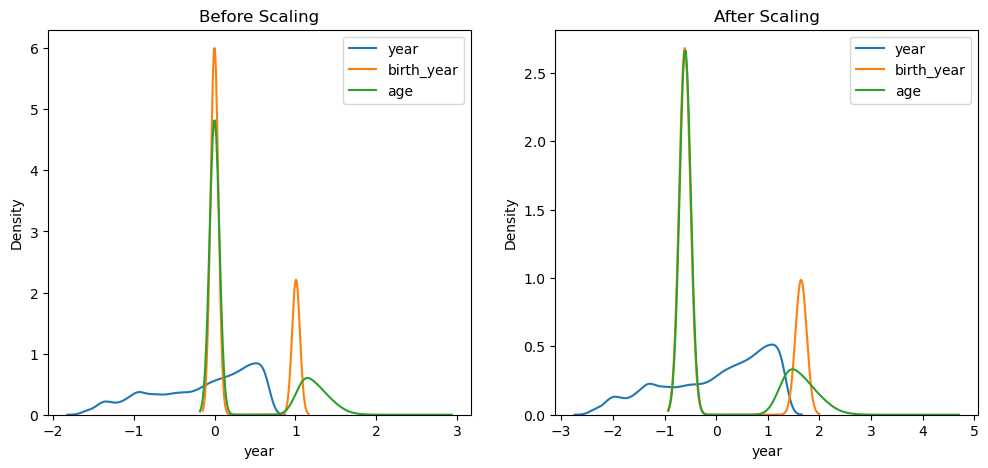

In [148]:
# let's compare the variable distributions before and after scaling
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(X_train_scaled['year'], ax=ax1, label ='year')
sns.kdeplot(X_train_scaled['birth_year'], ax=ax1, label ='birth_year')
sns.kdeplot(X_train_scaled['age'], ax=ax1, label ='age')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(X_train_scaled_v2['year'], ax=ax2, label ='year')
sns.kdeplot(X_train_scaled_v2['birth_year'], ax=ax2, label ='birth_year')
sns.kdeplot(X_train_scaled_v2['age'], ax=ax2, label ='age')
ax2.legend()
plt.show()

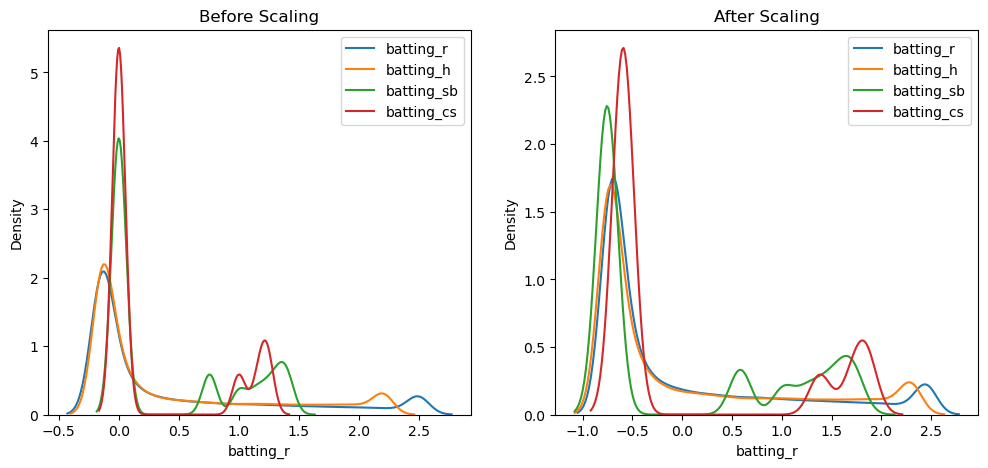

In [149]:
# let's compare the variable distributions before and after scaling
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(X_train_scaled['batting_r'], ax=ax1, label ='batting_r')
sns.kdeplot(X_train_scaled['batting_h'], ax=ax1, label ='batting_h')
sns.kdeplot(X_train_scaled['batting_sb'], ax=ax1, label ='batting_sb')
sns.kdeplot(X_train_scaled['batting_cs'], ax=ax1, label ='batting_cs')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(X_train_scaled_v2['batting_r'], ax=ax2, label ='batting_r')
sns.kdeplot(X_train_scaled_v2['batting_h'], ax=ax2, label ='batting_h')
sns.kdeplot(X_train_scaled_v2['batting_sb'], ax=ax2, label ='batting_sb')
sns.kdeplot(X_train_scaled_v2['batting_cs'], ax=ax2, label ='batting_cs')
ax2.legend()
plt.show()

## 3.8 Feature Engineering <a id="3.8"></a>
[Back to Content](#Table-of-Content_01)

### 3.8.1 Principal Component Analysis (PCA) <a id="3.8.1"></a>
[Back to Content](#Table-of-Content_01)

Principal Component Analysis (PCA) is a statistical technique used in data analysis and machine learning to reduce the dimensionality of a dataset while preserving as much of the data's variability as possible. PCA transforms the original variables (features) into a new set of uncorrelated variables called principal components. 

In [150]:
# Visualize the correlation through HeatMap
# plt.rcParams['figure.figsize'] = (15, 10)
#plt.rcParams['figure.figsize'] = (40, 30)
#ax = sns.heatmap(X_train_scaled_v2[train_num_cols].corr(), annot=True, fmt=".2f", cmap='viridis')

# Adjust the bottom and top margins to make sure the heatmap is displayed correctly
#bottom, top = ax.get_ylim()
#ax.set_ylim(bottom + 0.5, top - 0.5)

#plt.show()

In [151]:
# Batting features
#batting_features = ['batting_g', 'batting_ab', 'batting_r', 'batting_h', 
#                    'batting_double', 'batting_hr', 'batting_rbi', 
#                    'batting_cs', 'batting_bb']

# Fielding features
#fielding_features = ['fielding_g', 'fielding_po', 'fielding_a', 'fielding_e']

In [152]:
#from sklearn.decomposition import PCA

# Function to apply PCA to a subset of features
#def apply_pca(features, data_train, data_test, variance_retained=0.95):
#    pca = PCA(n_components=variance_retained)
#    pca_train = pca.fit_transform(data_train[features])
#    pca_test = pca.transform(data_test[features])
#    pca_df_train = pd.DataFrame(pca_train, columns=[f'{features[0].split("_")[0]}_pc{i+1}' for i in range(pca_train.shape[1])])
#    pca_df_test = pd.DataFrame(pca_test, columns=[f'{features[0].split("_")[0]}_pc{i+1}' for i in range(pca_test.shape[1])])
#    return pca_df_train, pca_df_test, pca.explained_variance_ratio_

In [153]:
# Apply PCA to batting features
#batting_pca_train, batting_pca_test, batting_variance_ratio = apply_pca(batting_features, X_train_scaled_v2, X_test_scaled_v2)

# Apply PCA to fielding features
#fielding_pca_train, fielding_pca_test, fielding_variance_ratio = apply_pca(fielding_features, X_train_scaled_v2, X_test_scaled_v2)

In [154]:
# Combine PCA components with other features (excluding the ones transformed by PCA)
#X_train_v3 = pd.concat([X_train_scaled_v2.drop(columns=batting_features + fielding_features),
#                            batting_pca_train, fielding_pca_train], axis=1)
#X_test_v3 = pd.concat([X_test_scaled_v2.drop(columns=batting_features + fielding_features),
#                       batting_pca_test, fielding_pca_test], axis=1)

In [155]:
# determine the number of informative components

# the number of components is determined by the change
# in the decay in the percentage of variance explained
# by each component

#plt.plot(batting_variance_ratio, linewidth=2)
#plt.title('Percentage of Variance Explained')
#plt.xlabel('Index Number of Components')
#plt.ylabel('Percentage of Variance Explained')

In [156]:
# determine the number of informative components

# the number of components is determined by the change
# in the decay in the percentage of variance explained
# by each component

#plt.plot(fielding_variance_ratio, linewidth=2)
#plt.title('Percentage of Variance Explained')
#plt.xlabel('Index Number of Components')
#plt.ylabel('Percentage of Variance Explained')

### 3.8.2 Polynomial Expansion <a id="3.8.2"></a>
[Back to Content](#Table-of-Content_01)

Polynomial expansion is a technique used in machine learning and statistics to increase the complexity of a model by creating new features based on the original features, but raised to various powers (degrees). This method is particularly useful when the relationship between the input features and the target variable is non-linear, and linear models might not capture the underlying patterns adequately.

In [157]:
#from sklearn.linear_model import LassoCV

# LassoCV automatically tunes the alpha parameter using cross-validation
#lasso = LassoCV(cv=5)  # 5-fold cross-validation
#lasso.fit(X_train_scaled_v2, y_train)

In [158]:
# Get the coefficients of the features
#coef = lasso.coef_

In [159]:
# Get the feature names
#feature_names = X_train_scaled_v2.columns

In [160]:
# Select features with non-zero coefficients
#selected_features = feature_names[coef != 0]

In [161]:
# Print selected features
#print(f"Selected features: {selected_features}")

In [162]:
# Part of the Seventh Run Testing
#selected_features_for_expansion = ['year', 'birth_year', 'weight', 'height', 'batting_g', 'batting_ab', 
#                     'batting_r', 'batting_h', 'batting_double', 'batting_hr', 
#                     'batting_rbi', 'batting_cs', 'batting_bb', 'pitching_g', 
#                     'fielding_g', 'fielding_po', 'fielding_a', 'fielding_e', 'age']

In [163]:
# Check how many rows and columns there are now.
num_rows, num_columns = X_train_scaled_v2.shape
print(f'The merged DataFrame has {num_rows} rows and {num_columns} columns.')

The merged DataFrame has 66349 rows and 62 columns.


In [164]:
# set up the polynomial expansion transformer
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)

In [165]:
# Fit the transformer to the selected features
poly.fit(X_train_scaled_v2)

PolynomialFeatures(include_bias=False)

In [166]:
# Part of seventh run testing
# Fit the transformer to the selected features
#poly.fit(X_train_scaled_v2[selected_features_for_expansion])

In [167]:
# create the new features
X_train_v3 = poly.transform(X_train_scaled_v2)

X_test_v3 = poly.transform(X_test_scaled_v2)

In [168]:
# Part of seventh run testing
# create the new features
#X_train_v3 = poly.transform(X_train_scaled_v2[selected_features_for_expansion])

#X_test_v3 = poly.transform(X_test_scaled_v2[selected_features_for_expansion])

In [169]:
# visualise the name of the created features
feature_names = poly.get_feature_names_out(X_train_scaled_v2.columns)

# Part of seventh run testing
#feature_names = poly.get_feature_names_out(input_features=selected_features_for_expansion)

In [170]:
# Get the number of new features created
num_features = len(feature_names)

# Print the number of features
print(f"Number of features after polynomial expansion: {num_features}")

Number of features after polynomial expansion: 2015


In [171]:
# capture the returned features in a dataframe
X_train_v3 = pd.DataFrame(X_train_v3, columns=feature_names)
X_test_v3 = pd.DataFrame(X_test_v3, columns=feature_names)

In [172]:
# Check how many rows and columns there are now.
num_rows, num_columns = X_train_v3.shape
print(f'The merged DataFrame has {num_rows} rows and {num_columns} columns.')

The merged DataFrame has 66349 rows and 2015 columns.


In [173]:
X_train_v3.head()

year  birth_year    weight    height  batting_g  batting_ab  batting_r  \
0 -1.634087   -0.608079 -0.604630 -0.607835  -0.479401   -0.270794  -0.126379   
1  1.175707   -0.608079 -0.604630 -0.607835  -0.500135   -0.654239  -0.724430   
2  0.525292   -0.608079 -0.604630 -0.607835   1.511009    1.231472   1.219235   
3  1.123674    1.652572  1.452516  1.699877  -0.437934   -0.780303  -0.724430   
4  0.681391    1.633143  1.452516  1.699877   0.412137    0.270232   0.135268   

   batting_h  batting_double  batting_hr  batting_rbi  batting_sb  batting_cs  \
0  -0.269522       -0.379541    0.941703     0.656649    1.014844   -0.592172   
1  -0.733816       -0.710597   -0.788317    -1.145889   -0.753465   -0.592172   
2   1.452235        1.386088    0.508570     1.040653    1.616080    1.874710   
3  -0.753161       -0.710597   -0.788317    -1.145889   -0.753465   -0.592172   
4   0.272154        0.172218    1.437680     0.930646    0.583742    1.687672   

   batting_bb  pitching_g  fielding_g  fielding_po  fielding_a  fielding_e  \
0   -0.251752    1.359452   -0.113089     0.259818    0.952957    0.670811   
1   -0.562800    1.359452   -0.138411    -0.266201    0.285442    0.053355   
2    1.212650   -0.835639    1.651916     1.459863    0.008370    0.793252   
3   -1.145951    1.382011   -0.064161    -0.166259    0.312498    0.323581   
4    0.556704   -0.835639    1.102485     0.846198   -0.423593    0.519325   

        age  team_id_0  team_id_KCA  team_id_DET  team_id_ATL  team_id_CHN  \
0 -0.599741   0.608089    -0.097909    -0.096089    -0.099235    -0.096884   
1 -0.599741   0.608089    -0.097909    -0.096089    -0.099235    -0.096884   
2 -0.599741   0.608089    -0.097909    -0.096089    -0.099235    -0.096884   
3  1.586081  -1.644497    10.213514    -0.096089    -0.099235    -0.096884   
4  1.586081  -1.644497    -0.097909    10.407037    -0.099235    -0.096884   

   team_id_SDN  team_id_LAN  team_id_MIN  team_id_PIT  team_id_MON  \
0    -0.099929    -0.096884    -0.090585    -0.095849    -0.078757   
1    -0.099929    -0.096884    -0.090585    -0.095849    -0.078757   
2    -0.099929    -0.096884    -0.090585    -0.095849    -0.078757   
3    -0.099929    -0.096884    -0.090585    -0.095849    -0.078757   
4    -0.099929    -0.096884    -0.090585    -0.095849    -0.078757   

   team_id_SLN  team_id_TEX  team_id_HOU  team_id_SFN  team_id_LAA  \
0     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   
1     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   
2     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   
3     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   
4     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   

   team_id_SEA  team_id_ARI  team_id_CHA  team_id_TBA  team_id_FLO  \
0    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   
1    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   
2    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   
3    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   
4    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   

   team_id_BOS  team_id_CAL  team_id_PHI  team_id_OAK  team_id_NYN  \
0    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   
1    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   
2    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   
3    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   
4    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   

   team_id_TOR  team_id_BAL  team_id_CLE  team_id_COL  team_id_CIN  \
0    -0.098301    -0.098613    -0.097988    -0.084374    -0.099467   
1    -0.098301    -0.098613    -0.097988    -0.084374    -0.099467   
2    -0.098301    -0.098613    -0.097988    -0.084374    -0.099467   
3    -0.098301    -0.098613    -0.097988    -0.084374    -0.099467   
4    -0.098301    -0.098613    -0.097988    -0.084374    -0.0

In [174]:
X_test_v3.head()

year  birth_year    weight    height  batting_g  batting_ab  batting_r  \
0  0.759441    1.627428  1.623945  1.699877  -0.479401   -0.727777  -0.687051   
1  0.525292   -0.608079 -0.604630 -0.607835  -0.686736   -0.554438  -0.612295   
2  0.577325    1.630857  1.498230  1.638338  -0.894070   -0.801314  -0.724430   
3 -0.957655   -0.608079 -0.604630 -0.607835  -1.039204   -0.785556  -0.724430   
4 -1.217821   -0.608079 -0.604630 -0.607835  -1.039204   -0.780303  -0.724430   

   batting_h  batting_double  batting_hr  batting_rbi  batting_sb  batting_cs  \
0  -0.753161       -0.710597   -0.788317    -1.145889   -0.753465   -0.592172   
1  -0.579051       -0.710597   -0.788317     0.001421   -0.753465   -0.592172   
2  -0.753161       -0.710597   -0.788317    -1.145889   -0.753465   -0.592172   
3  -0.753161       -0.710597   -0.788317    -1.145889   -0.753465   -0.592172   
4  -0.753161       -0.710597   -0.788317    -1.145889   -0.753465   -0.592172   

   batting_bb  pitching_g  fielding_g  fielding_po  fielding_a  fielding_e  \
0   -0.562800    1.367303   -0.113089    -0.230503    0.338369    0.053355   
1   -0.562800    1.267792   -0.399050    -0.035741    0.599712   -0.364600   
2   -1.145951    1.072561   -0.804717    -0.979003   -1.683289   -0.364600   
3   -0.562800   -0.835639   -1.813457    -1.521194   -1.683289   -1.192951   
4   -1.145951    0.711174   -1.275154    -1.521194   -0.140945   -0.364600   

        age  team_id_0  team_id_KCA  team_id_DET  team_id_ATL  team_id_CHN  \
0  2.189066  -1.644497    -0.097909    -0.096089    -0.099235    -0.096884   
1 -0.599741   0.608089    -0.097909    -0.096089    -0.099235    -0.096884   
2  1.435334  -1.644497    -0.097909    -0.096089    -0.099235    -0.096884   
3 -0.599741   0.608089    -0.097909    -0.096089    -0.099235    -0.096884   
4 -0.599741   0.608089    -0.097909    -0.096089    -0.099235    -0.096884   

   team_id_SDN  team_id_LAN  team_id_MIN  team_id_PIT  team_id_MON  \
0    -0.099929    -0.096884    -0.090585    -0.095849    -0.078757   
1    -0.099929    -0.096884    -0.090585    -0.095849    -0.078757   
2    -0.099929    -0.096884    -0.090585    10.433089    -0.078757   
3    -0.099929    -0.096884    -0.090585    -0.095849    -0.078757   
4    -0.099929    -0.096884    -0.090585    -0.095849    -0.078757   

   team_id_SLN  team_id_TEX  team_id_HOU  team_id_SFN  team_id_LAA  \
0     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   
1     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   
2     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   
3     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   
4     -0.10016    -0.096805    -0.094721    -0.098223    -0.057017   

   team_id_SEA  team_id_ARI  team_id_CHA  team_id_TBA  team_id_FLO  \
0    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   
1    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   
2    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   
3    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   
4    -0.095528    -0.072927    -0.096248    -0.072087    -0.081237   

   team_id_BOS  team_id_CAL  team_id_PHI  team_id_OAK  team_id_NYN  \
0    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   
1    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   
2    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   
3    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   
4    -0.096089    -0.061252     -0.10039    -0.100466    -0.095849   

   team_id_TOR  team_id_BAL  team_id_CLE  team_id_COL  team_id_CIN  \
0    -0.098301    -0.098613    -0.097988    -0.084374    -0.099467   
1    -0.098301    -0.098613    -0.097988    -0.084374    -0.099467   
2    -0.098301    -0.098613    -0.097988    -0.084374    -0.099467   
3    -0.098301    -0.098613    -0.097988    -0.084374    -0.099467   
4    -0.098301    -0.098613    -0.097988    -0.084374    -0.0

# Step 4: Machine Learning Modeling <a id="4.0"></a>
[Back to Content](#Table-of-Content_01)

## 4.1 Naive Baseline Model <a id="4.1"></a>
[Back to Content](#Table-of-Content_01)

The **Naive Baseline Model** is a simple model used in machine learning and statistical analysis as a reference point to evaluate the performance of more complex models. The primary purpose of a Naive Baseline Model is to provide a basic, straightforward prediction that can be used as a benchmark for comparison. By establishing a minimum standard, it allows practitioners to determine whether a more sophisticated model offers a meaningful improvement.

#### 1. Simple Prediction Strategy
- The Naive Baseline Model often uses a very basic strategy to make predictions. For example, in regression tasks, a common naive baseline might predict the mean or median of the target variable for all instances, regardless of the input features.
- In classification tasks, it might simply predict the most frequent class (mode) or distribute predictions according to the class distribution in the training set.

#### 2. Purpose and Role
- The primary role of the Naive Baseline Model is to set a minimal benchmark. If a more complex model does not perform significantly better than the naive baseline, it indicates that the model might not be effectively capturing the patterns in the data.
- It helps avoid over-complicating the modeling process. If a simple baseline performs similarly to a complex model, it might suggest that simpler, more interpretable methods are sufficient.

#### 3. Evaluation of Model Performance
- The performance of more advanced models is often compared against the naive baseline to assess their effectiveness. For example, if the baseline model has a Mean Squared Error (MSE) of 10,000 and a new model reduces this to 2,000, the new model demonstrates a clear improvement.
- By serving as a reference point, the baseline helps in identifying whether enhancements or adjustments to the model or features are genuinely improving predictive accuracy.

#### 4. Limitations
- While the Naive Baseline Model is useful as a benchmark, it does not take into account any of the input features and thus cannot capture any complex relationships in the data.
- It is not intended to be a competitive model but rather a baseline against which the performance of more complex models can be measured.

In [175]:
# pick the mean target value from all of train data
print(y_train.mean())

mean_target_value = y_train.mean()

print(f"The train mean target value is {mean_target_value:.2f}.")

541.8427016081629
The train mean target value is 541.84.


In [176]:
y_train_preds_naive = [round(mean_target_value,2) for row in X_train.iloc[:,0]]
y_train_preds_naive[0:5]

[541.84, 541.84, 541.84, 541.84, 541.84]

In [177]:
y_test_preds_naive = [round(mean_target_value,2) for row in X_test.iloc[:,0]]
y_test_preds_naive[0:5]

[541.84, 541.84, 541.84, 541.84, 541.84]

In [178]:
# Mean Squared Error (the lower the better, 0 is best possible score)

# train MSE score
y_true = y_train
y_pred = y_train_preds_naive

train_mse_naive = mean_squared_error(y_true, y_pred)
print(f"The Naive Baseline Model's MSE on train data is {train_mse_naive:.2f}.")

# test MSE score
y_true = y_test
y_pred = y_test_preds_naive

test_mse_naive = mean_squared_error(y_true, y_pred)
print(f"The Naive Baseline Model's MSE on test data is {test_mse_naive:.2f}.")

print()

# Root Mean Squared Error (if MSE < 1, rooting it makes it numerically larger, vice-versa if MSE > 1)

# train RMSE score
y_true = y_train
y_pred = y_train_preds_naive

train_rmse_naive = mean_squared_error(y_true, y_pred, squared=False)
print(f"The Naive Baseline Model's RMSE on train data is {train_rmse_naive:.2f}.")

# test RMSE score
y_true = y_test
y_pred = y_test_preds_naive

test_rmse_naive = mean_squared_error(y_true, y_pred, squared=False)
print(f"The Naive Baseline Model's RMSE on test data is {test_rmse_naive:.2f}.")

print()

# R2 Value (Coefficient of Determination, which measures how well the X cols account for y's variance, 1.0 is best score)

# train R2 score
y_true = y_train
y_pred = y_train_preds_naive

train_r2_naive = r2_score(y_true, y_pred)
print(f"The Naive Baseline Model's R2 on train data is {train_r2_naive:.2f}.")

# test R2 score
y_true = y_test
y_pred = y_test_preds_naive

test_r2_naive = r2_score(y_true, y_pred)
print(f"The Naive Baseline Model's R2 on test data is {test_r2_naive:.2f}.")

The Naive Baseline Model's MSE on train data is 3775465.11.
The Naive Baseline Model's MSE on test data is 3714239.63.

The Naive Baseline Model's RMSE on train data is 1943.06.
The Naive Baseline Model's RMSE on test data is 1927.24.

The Naive Baseline Model's R2 on train data is -0.00.
The Naive Baseline Model's R2 on test data is -0.00.


C:\Users\zavie\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zavie\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## 4.2 Linear Regression Model <a id="4.2"></a>
[Back to Content](#Table-of-Content_01)

Linear regression is defined as a machine learning model in which the model finds the best fit linear line between the independent and dependent variables in which the aim is to find the best fit linear line and the optimal values of intercept and coefficients such that errors are minimized. For the purpose of this analysis, the goal is to use the X variables e.g. columns other than item outlet sales,to predict the item outlet sales (y variable, or target variable).
#### Building and Evaluating the Model
In order to evaluate the model performance of a linear regression model, a range of measures can be used, but in this ASG2 we will focus on:

- Mean Square Error (MSE): The MSE is the variance of the residuals, that is, the squared differences between prediction and actual observation. Lower values of MSE indicate better fit and model performance.
- R-Square: R-square represents the percentage of the response variable variation that is explained by a linear model. The closer to 1.0 the value of R-square, the more indicative of a better fit and model performance.

In [179]:
#X_train_student_final_premodel_version = X_train_v3
#X_test_student_final_premodel_version = X_test_v3
#y_train_student_final_premodel_version = y_train
#y_test_student_final_premodel_version = y_test

In [180]:
#X_train_final = X_train_student_final_premodel_version
#X_test_final = X_test_student_final_premodel_version

#y_train_final = y_train_student_final_premodel_version
#y_test_final = y_test_student_final_premodel_version

In [181]:
# Build Linear Regression Model
#model_linear_regression = LinearRegression()
#model_linear_regression.fit(X_train_final, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
#print('train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(X_train_final)), 
#      '\n test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(X_test_final)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
#print('train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(X_train_final)), 
#      '\n test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(X_test_final)))

In [182]:
linreg = LinearRegression().fit(X_train_v3, y_train)

In [183]:
y_train_preds_linreg = linreg.predict(X_train_v3)
y_test_preds_linreg = linreg.predict(X_test_v3)

In [184]:
# Mean Squared Error (the lower the better, 0 is best possible score)

# train MSE score
y_true = y_train
y_pred = y_train_preds_linreg

train_mse_linreg = mean_squared_error(y_true, y_pred)
print(f"The LinReg Model's MSE on train data is {train_mse_linreg:.4f}.")

# test MSE score
y_true = y_test
y_pred = y_test_preds_linreg

test_mse_linreg = mean_squared_error(y_true, y_pred)
print(f"The LinReg Model's MSE on test data is {test_mse_linreg:.4f}.")

print()

# Root Mean Squared Error (if MSE < 1, rooting it makes it numerically larger, vice-versa if MSE > 1)

# train RMSE score
y_true = y_train
y_pred = y_train_preds_linreg

train_rmse_linreg = mean_squared_error(y_true, y_pred, squared=False)
print(f"The LinReg Model's RMSE on train data is {train_rmse_linreg:.4f}.")

# test RMSE score
y_true = y_test
y_pred = y_test_preds_linreg

test_rmse_linreg = mean_squared_error(y_true, y_pred, squared=False)
print(f"The LinReg Model's RMSE on test data is {test_rmse_linreg:.4f}.")

print()

# R2 Value (Coefficient of Determination, which measures how well the X cols account for y's variance, 1.0 is best score)

# train R2 score
y_true = y_train
y_pred = y_train_preds_linreg

train_r2_linreg = r2_score(y_true, y_pred)
print(f"The LinReg Model's R2 on train data is {train_r2_linreg:.4f}.")

# test R2 score
y_true = y_test
y_pred = y_test_preds_linreg

test_r2_linreg = r2_score(y_true, y_pred)
print(f"The LinReg Model's R2 on test data is {test_r2_linreg:.4f}.")

The LinReg Model's MSE on train data is 1350056.5600.
The LinReg Model's MSE on test data is 1498301.3953.

The LinReg Model's RMSE on train data is 1161.9193.
The LinReg Model's RMSE on test data is 1224.0512.

The LinReg Model's R2 on train data is 0.6424.
The LinReg Model's R2 on test data is 0.5966.


C:\Users\zavie\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zavie\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [185]:
# First Run (left join)
# train_mse: 7024425.884026265 
# test_mse: 7168640.253866109
# train_r-sq: 0.35585265038222946 
# test_r-sq: 0.35845987953183867

#Second Run (outer + single winsor)
# train_mse: 2131024.8974498706 
# test_mse: 2079101.4437882632
# train_r-sq: 0.4355596374701942 
# test_r-sq: 0.4402347743967113

#Third Run (outer + double winsor)
#train_mse: 2134293.343782778 
# test_mse: 2085828.0374577353
#train_r-sq: 0.43469393053487737 
# test_r-sq: 0.43842374529364214

#Fourth Run (Outer + double winsor + Robust Scaling & Standardization)
#train_mse: 2134293.3437827765 
# test_mse: 2085828.0374577257
#train_r-sq: 0.4346939305348777 
# test_r-sq: 0.4384237452936448

#Fifth Run (Outer + single winsor + Robust Scaling & Standardization)
#train_mse: 2131028.663589186 
# test_mse: 2079102.99719357
#train_r-sq: 0.4355586399403 
# test_r-sq: 0.44023435616686757

#////Best Run//// 
#Sixth Run (Outer + single winsor + Robust Scaling & Standardization + Expansion(all))
#train_mse: 1350056.5599741293 
# test_mse: 1498301.3952695546
#train_r-sq: 0.6424131810663345 
# test_r-sq: 0.5966060140785523

#Seventh Run (Outer + single winsor + Robust Scaling & Standardization + Expansion(selected features))
#train_mse: 1633553.8652919214 
# test_mse: 1635263.480286125
#train_r-sq: 0.5673238088204798 
# test_r-sq: 0.5597311359202717

#Eighth Run (Outer + single winsor + Robust Scaling & Standardization + PCA + Expansion(all))
#train_mse: 1512521.2205275674 
# test_mse: 1601194.7820923682
#train_r-sq: 0.599381486781204 
# test_r-sq: 0.5689035948146732

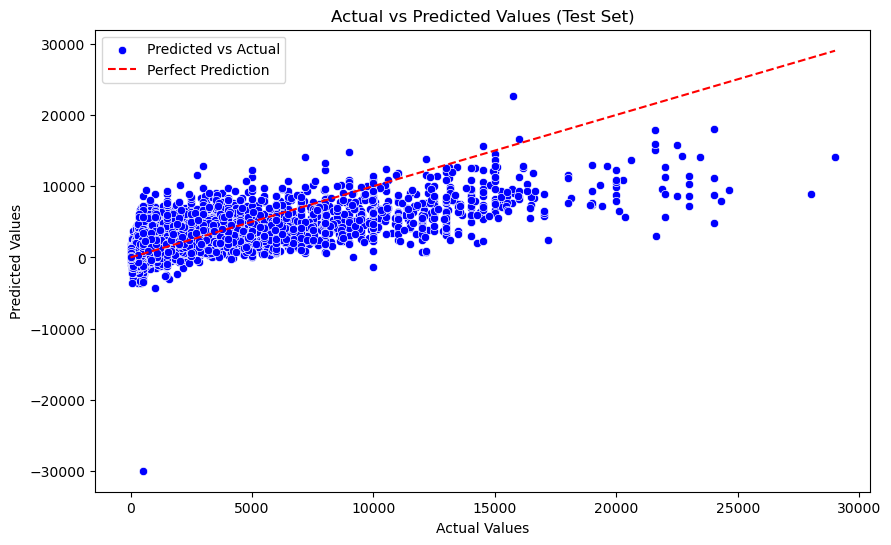

In [186]:
# Plot Actual vs. Predicted values for Test Set
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_test_preds_linreg, label='Predicted vs Actual', color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label='Perfect Prediction')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values (Test Set)')
plt.legend()
plt.show()

The purpose of the scatter plot shown is to visually assess the performance of a regression model by comparing the predicted values against the actual values in the test set. Here’s how the plot is typically interpreted:

1. **Visual Comparison**: Each point on the plot represents a data point from the test set. The x-axis shows the actual values, and the y-axis shows the predicted values generated by the model.

2. **Perfect Prediction Line**: The red dashed line represents the "perfect prediction" line where predicted values would equal the actual values. If all points were to lie exactly on this line, it would indicate that the model's predictions are perfect.

3. **Model Accuracy**: The closer the points are to the red line, the more accurate the model's predictions. Points above the line represent overestimations, while points below the line represent underestimations.

4. **Outliers**: The plot also helps identify outliers or areas where the model may not be performing well, as indicated by points that are far from the perfect prediction line.

Overall, this plot is crucial for understanding how well the regression model is capturing the relationship between the features and the target variable. It highlights areas where the model performs well and where it may need improvement.

In [187]:
# Calculate residuals
train_residuals = y_train - y_train_preds_linreg
test_residuals = y_test - y_test_preds_linreg

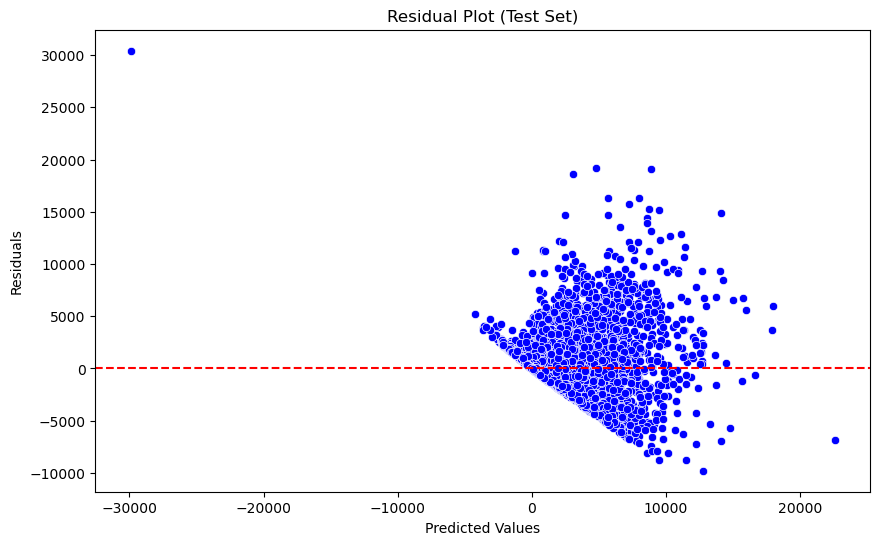

In [188]:
# Plot Residuals for Test Set
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test_preds_linreg, y=test_residuals, color='blue')
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot (Test Set)')
plt.show()

The purpose of the residual plot shown is to assess the performance of a regression model by visualizing the residuals, which are the differences between the actual and predicted values. This plot helps in identifying patterns in the residuals that may indicate potential problems with the model. Here’s how the plot is typically interpreted:

1. **Residuals vs. Predicted Values**: Each point on the plot represents a residual, calculated as the difference between the actual and predicted values. The x-axis shows the predicted values, while the y-axis shows the residuals.

2. **Zero Residual Line**: The red dashed line represents the zero-residual line, where the model’s predictions would perfectly match the actual values. Ideally, the residuals should be randomly scattered around this line.

3. **Model Performance**: A well-performing model typically has residuals randomly scattered around the zero line, without any clear patterns. If the residuals show a pattern (e.g., funnel shape, curve), it suggests that the model may not be capturing some aspects of the data correctly.

4. **Homoscedasticity Check**: The plot is also used to check for homoscedasticity, meaning that the residuals have constant variance across all levels of predicted values. A funnel-shaped pattern (widening or narrowing) would indicate heteroscedasticity, suggesting the model’s errors are not consistent across predictions.

5. **Outliers and Leverage Points**: The plot helps identify outliers or points with high leverage, which may have a disproportionate impact on the model's performance. These are residuals that are far from the zero line.

Overall, this residual plot is crucial for diagnosing issues in the regression model and ensuring that the assumptions of the model are met.

# 5. Report <a id="5.0"></a>
[Back to Content](#Table-of-Content_01)

## Table of Content <a id="Table-of-Content_02"></a> 

- [5.1: Introduction with Value Based Problem Statement](#5.1)
    - [5.1.1: Value-Based Problem Statement](#5.1.1)
    - [5.1.2: Tables Used](#5.1.2)
    - [5.1.3: Outcome](#5.1.3)

- [5.2: Problem Formulation & Data Wrangling on Multiple Tables](#5.2)
    - [5.2.1: Predictive Problem Statement](#5.2.1)
    - [5.2.2: Merging the Tables](#5.2.2)
    - [5.2.3: Exploration on Merged Data](#5.2.3)
      - [5.2.3.1: Relationship between Salary & Player Attributes](#5.2.3.1)
      - [5.2.3.2: Relationship between Salary & Batting Performance](#5.2.3.2)
      - [5.2.3.3: Relationship between Salary & Pitching Performance](#5.2.3.3)
      - [5.2.3.4: Relationship between Salary & Fielding Performance](#5.2.3.4)
      - [5.2.3.5: Correlation Matrix](#5.2.3.5)
    
- [5.3: Data Cleansing & Transformation](#5.3)
    - [5.3.1: Transformation of Variables](#5.3.1)
      - [5.3.1.1: Winsorization Method](#5.3.1.1)
    - [5.3.2: Train & Test Split](#5.3.2)
    - [5.3.3: Missing Value Imputation](#5.3.3)
    - [5.3.4: Categorical Encoding](#5.3.4)
    - [5.3.5: Yeo-Johnson Transformation](#5.3.5)
    - [5.3.6: Feature Scaling](#5.3.6)
      - [5.3.6.1: Robust Scaling](#5.3.6.1)
      - [5.3.6.2: Standardization](#5.3.6.2)
    - [5.3.7: Feature Engineering](#5.3.7)
      - [5.3.7.1: Polynomial Expansion](#5.3.7.1)
    
- [5.4: Machine Learning Model](#5.4)
    - [5.4.1: Naive Baseline Model](#5.4.1)
    - [5.4.2: Linear Regression Model](#5.4.2)
    - [5.4.3: Differences in Results](#5.4.3)

- [5.5: Summary & Further Improvement](#5.5)
    - [5.5.1: Summarizing my Findings](#5.5.1)
    - [5.5.2: Further Improvements](#5.5.2)
    
- [5.6: Reflection](#5.6)

- [5.7: References](#5.7)

## 5.1 Introduction with Value Based Problem Statement <a id="5.1"></a>
[Back to Content](#Table-of-Content_02)

In the highly competitive environment of Major League Baseball (MLB), player salaries have become a pivotal aspect of team management and financial strategy. With ever-increasing contract values, it is crucial for management teams to understand the underlying factors that drive player compensation. This understanding enables teams to allocate resources effectively, optimize player acquisitions, and sustain financial stability.

### 5.1.1 Value-Based Problem Statement <a id="5.1.1"></a>
[Back to Content](#Table-of-Content_02)

The financial management of MLB teams is critically dependent on accurately predicting player salaries based on performance metrics. With the escalating costs of player contracts, it is essential for teams to make data-driven decisions to optimize their budgeting and resource allocation. By predicting player salaries using performance metrics, teams can identify undervalued players, manage payroll more effectively, and maintain a competitive edge without overspending. This approach not only supports better financial planning but also contributes to building a stronger, more cost-efficient team roster.

### 5.1.2 Tables Used <a id="5.1.2"></a>
[Back to Content](#Table-of-Content_02)

The analysis leverages historical data from various tables, including:
- **Salary**: Contains salary information for players over several years.
- **Batting**: Provides detailed batting performance metrics.
- **Pitching**: Includes comprehensive pitching performance data.
- **Fielding**: Contains fielding performance metrics.
- **Player**: Includes data on player birth year, height, weight, and career milestones (debut and final game dates).

### 5.1.3 Outcome <a id="5.1.3"></a>
[Back to Content](#Table-of-Content_02)

The outcome of this analysis will provide MLB teams with a predictive model that accurately estimates player salaries based on key performance indicators. The insights gained from this model will support better financial planning, allowing teams to identify cost-effective players and negotiate contracts that align with the player’s performance value. Ultimately, this will contribute to maintaining a competitive edge while ensuring financial efficiency.

## 5.2 Problem Formulation & Data Wrangling on Multiple Tables  <a id="5.2"></a>
[Back to Content](#Table-of-Content_02)

In this section, I will be coming out with my predictive problem statement, followed by merging the tables and then exploration on the merged data.

### 5.2.1 Predictive Problem Statement  <a id="5.2.1"></a>
[Back to Content](#Table-of-Content_02)

The predictive problem focuses on developing a model to accurately forecast MLB player salaries using their on-field performance metrics, physical attributes, and career statistics. The objective is to determine the factors influencing salary and provide actionable insights that can guide team management in player negotiations and financial planning.

### 5.2.2 Merging the Tables  <a id="5.2.2"></a>
[Back to Content](#Table-of-Content_02)

I performed several crucial steps to ensure that the data from multiple datasets could be effectively combined for analysis. I used an outer join to merge different datasets, including salary data, player biographical data, and performance metrics (batting, pitching, and fielding statistics).

An outer join ensures that no data is excluded during the merge process by retaining all records from both datasets being merged. This is particularly important in this context because not all players may have data in every category (e.g., batting, pitching, fielding) for every year. By using an outer join, I was able to preserve as much data as possible, even when certain records did not have corresponding entries in other datasets. This approach minimizes data loss and ensures that all relevant player information is included, which is critical for developing a robust predictive model.

For example, when merging salary data with player data, I ensured that all player records were retained, regardless of whether salary data was available for every year or every player. Similarly, when combining performance metrics, I made sure that players who did not participate in a particular activity (such as pitching) in a given year were still included in the dataset. This comprehensive approach to data merging was essential to maintain the integrity and completeness of the dataset, allowing for more accurate and reliable predictions of MLB player salaries based on their performance metrics.

Initially I used left join, however using outer join improved my model. Therefore, I sticked to using outer join.


### 5.2.3 Exploration on Merged Data  <a id="5.2.3"></a>
[Back to Content](#Table-of-Content_02)


To begin the exploratory data analysis, I ensured that the merging process was successful by checking the number of rows and columns. An initial preview of the data, which included displaying the first 20 rows, provided a good overview of its structure and some sample data points.

Firstly, I used the .info() method to examine the structure and size of the dataset after merging multiple tables. The dataset consists of 52 columns and 94,785 rows. It also provided crucial details about the data types and the presence of missing values. The dataset is primarily composed of float64 data types, with a mix of object types for categorical data (e.g., player_id, team_id, league_id, bats, and throws). Notably, there are no missing values in this merged dataset, which indicates a successful handling of missing data during the earlier data wrangling and transformation stages.

Secondly, I utilized the .describe() method to summarize the central tendency, dispersion, and shape of the distribution of the dataset’s numerical features. This statistical overview provided valuable insights into the dataset's characteristics, such as means, standard deviations, and range. For instance, the average salary in the dataset is approximately 541,497.40, although this figure varies widely, as evidenced by the high standard deviation of 1,938,333. The data ranges from a minimum salary of 0 to a maximum of 33,000,000, highlighting significant disparities in player earnings.

Thirdly, I checked for the missing values if any within the dataset. Quantifying missing values was a critical step to understand the extent of data incompleteness.

Fourth, I identified the categorical and numerical variables. Identifying and segregating these types helped in applying appropriate preprocessing techniques. For instance, categorical variables required encoding, while numerical variables might need scaling or transformation to address skewness and improve model performance.

Fifth, I explored the unique values in each column. This provided insights into the data's diversity. For example, because throws doesn't vary much, it might not provide much predictive power in the model and could be considered for exclusion or treated differently during preprocessing. Understanding the repetition and uniqueness in features helps prioritize which variables to focus on during feature selection, ensuring the model uses the most informative data.

Sixth, I explored the relationship between the target variable 'Salary' and other features to see how they influence the target variable.

#### 5.2.3.1 Relationship between Salary & Player Attributes  <a id="5.2.3.1"></a>
[Back to Content](#Table-of-Content_02)

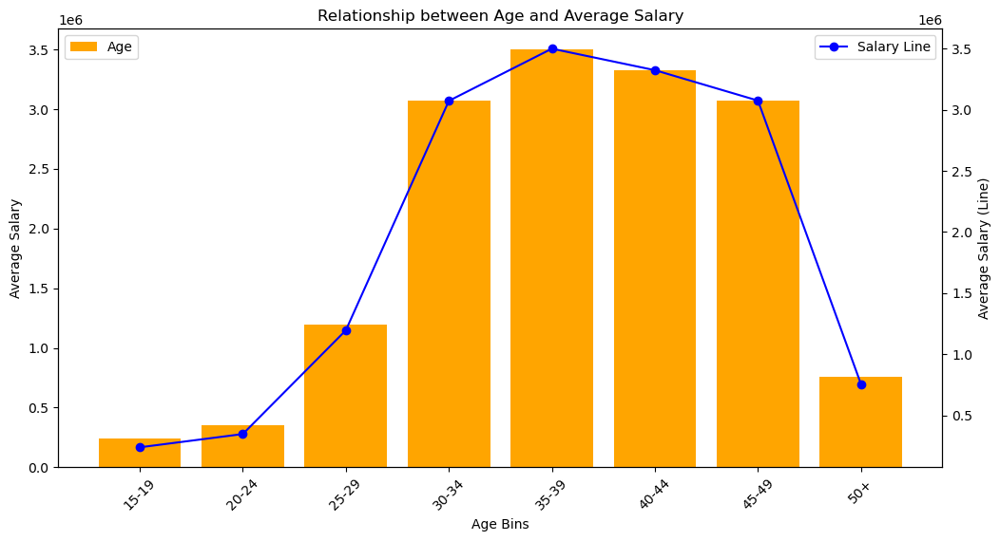

The relationship between age and average salary in MLB players reveals that salaries tend to peak when players are between 35-39 years old. This suggests that during this age range, players are likely at the height of their career, combining peak performance with extensive experience. The slight decline in salary beyond this age group may be attributed to physical decline or the perception that a player's career is nearing its end. Interestingly, salaries remain relatively high for players aged 40-44, indicating that some players maintain high performance levels or have significant market value even later in their careers. This trend emphasizes the importance of experience and sustained performance in determining player salaries, and teams may consider this when structuring long-term contracts or deciding on extensions.

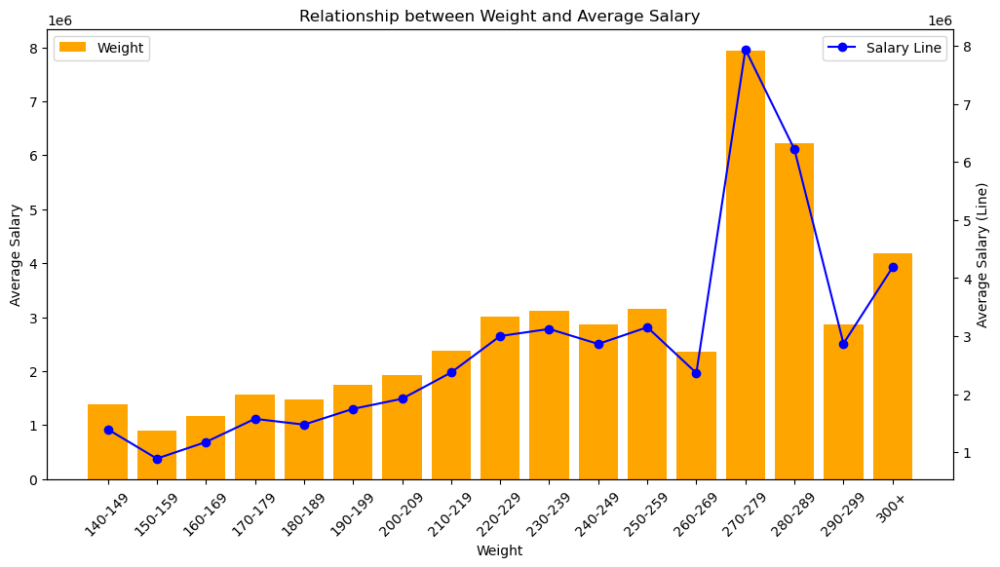

The relationship between weight and salary shows variability, with a significant salary peak observed for players in the 270-279 lbs range. This suggests that there may be an optimal weight range where players combine strength and agility, contributing to their overall effectiveness on the field. However, extreme weights, either too low or too high, do not correspond to the highest salaries, indicating that physical conditioning and the ability to maintain performance at a certain weight are important factors in determining player value. This insight could guide teams in conditioning programs and in assessing the physical attributes of potential recruits, ensuring that players maintain an optimal weight for their position and role within the team.

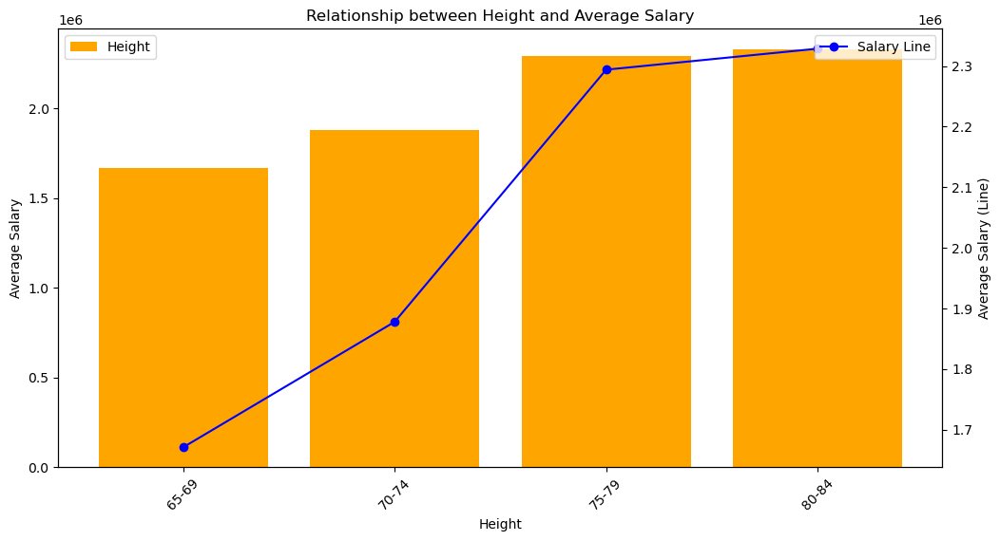

Height appears to be a significant factor in determining player salaries, with taller players, especially those standing between 80-84 inches, commanding the highest average salaries. This trend likely stems from the physical advantages that height provides in baseball, such as greater reach, leverage, and power potential, particularly for pitchers and power hitters. The positive correlation between height and salary suggests that taller players are perceived to have higher potential for success in the league, leading teams to invest more in these players. Understanding this correlation can help teams in scouting and development, particularly in identifying players who may physically excel at the professional level.

#### 5.2.3.2 Relationship between Salary & Batting Performance  <a id="5.2.3.2"></a>
[Back to Content](#Table-of-Content_02)

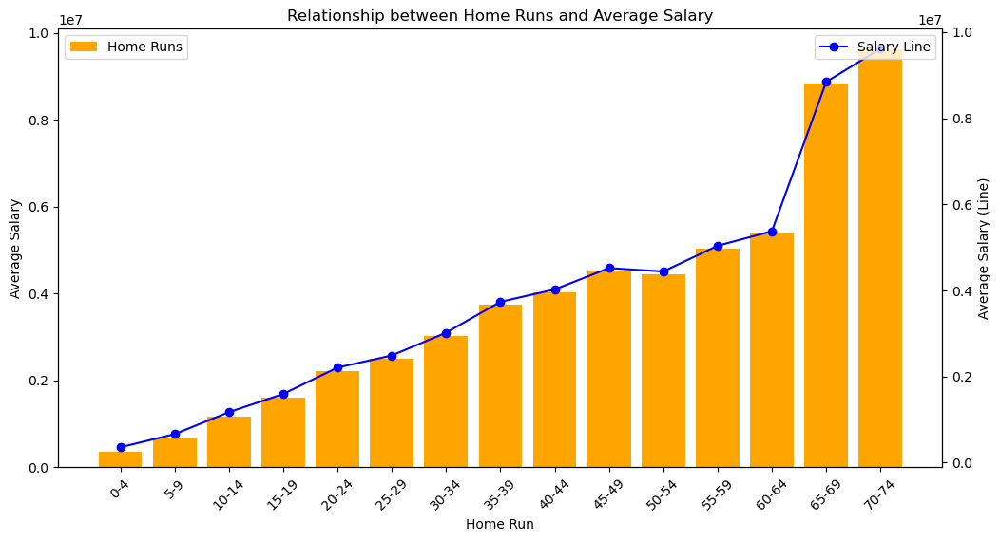

There is a strong positive correlation between the number of home runs a player hits and their salary, with the most significant salary increases observed as players approach and exceed 60 home runs. Home runs are a key performance metric in baseball, often directly influencing the outcome of games. Players who demonstrate consistent power-hitting ability are highly valued, as evidenced by their substantial salaries. This trend highlights the premium placed on power hitters in the league, as they are not only able to change the course of a game but also attract fan attention, contributing to a team’s overall success both on and off the field. Teams looking to bolster their offensive capabilities might prioritize acquiring or retaining players with proven home run capabilities, despite the higher financial investment required.

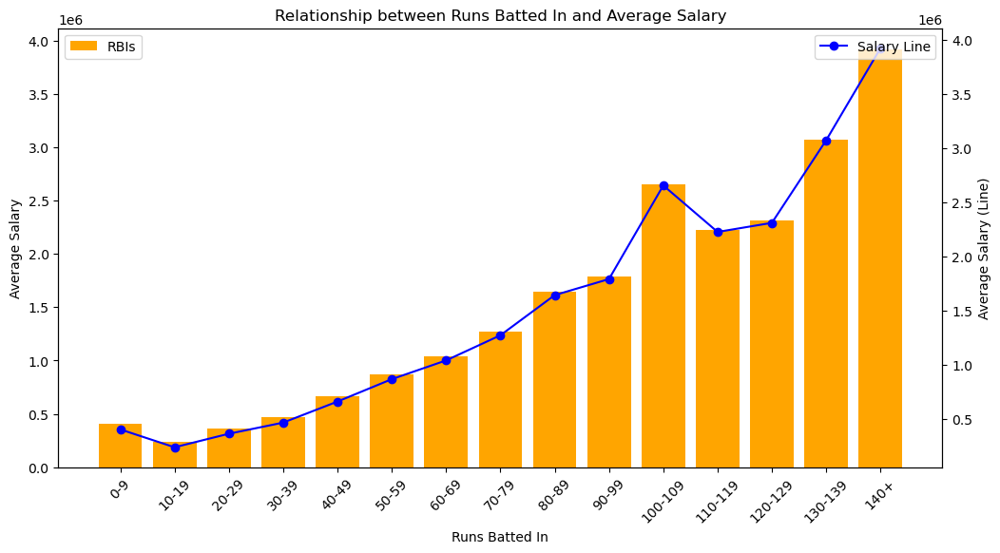

The analysis shows a clear upward trend in salaries as the number of RBIs increases, peaking in the 130-139 range. RBIs are a crucial measure of a player's ability to contribute to their team's scoring, directly correlating with their offensive value. Players who consistently drive in runs are considered critical assets, as they can significantly impact a team's chances of winning games. The decrease in salary beyond this peak suggests that while high RBIs are valuable, they must be balanced with other performance metrics. This insight can guide teams in evaluating the overall contributions of players, ensuring they reward those who provide consistent and effective offensive production.

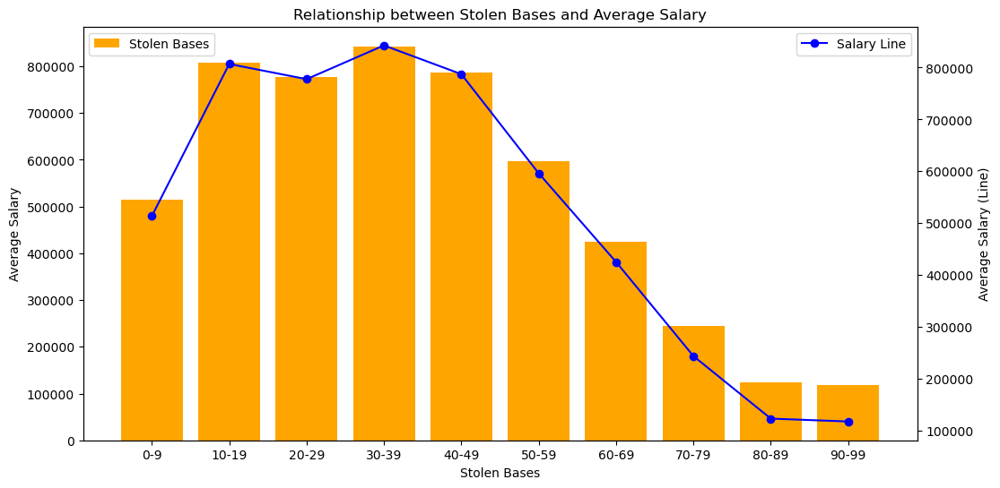

The relationship between stolen bases and salary shows a peak in the 30-39 range, after which salaries tend to decline. This indicates that while speed and base-running are important, they may not be as highly valued as other power-related metrics such as home runs or RBIs. Players who excel in stolen bases may provide a strategic advantage by creating scoring opportunities, but this skill alone does not command the highest salaries. Teams may need to consider the overall contribution of a player’s base-running skills in conjunction with other abilities when determining their value. This insight can be useful in balancing a team's roster with a mix of power and speed.

#### 5.2.3.3 Relationship between Salary & Pitching Performance  <a id="5.2.3.3"></a>
[Back to Content](#Table-of-Content_02)

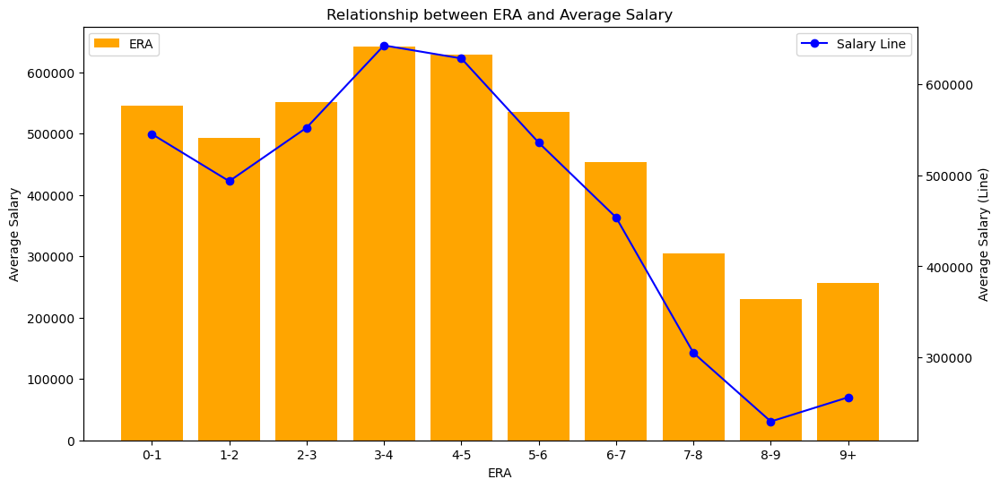

The analysis of ERA and average salary demonstrates a clear preference for pitchers with lower ERAs, specifically those within the 3-4 range. Players in this category earn the highest salaries, reflecting the high value placed on effective pitching. A lower ERA indicates fewer earned runs allowed per game, a critical performance indicator for pitchers. The decline in salary for players with ERAs above 4 suggests that as a pitcher's effectiveness decreases, so does their market value. This insight underscores the importance of investing in quality pitchers who can consistently maintain a low ERA, as they are likely to command higher salaries and contribute more significantly to a team's success.

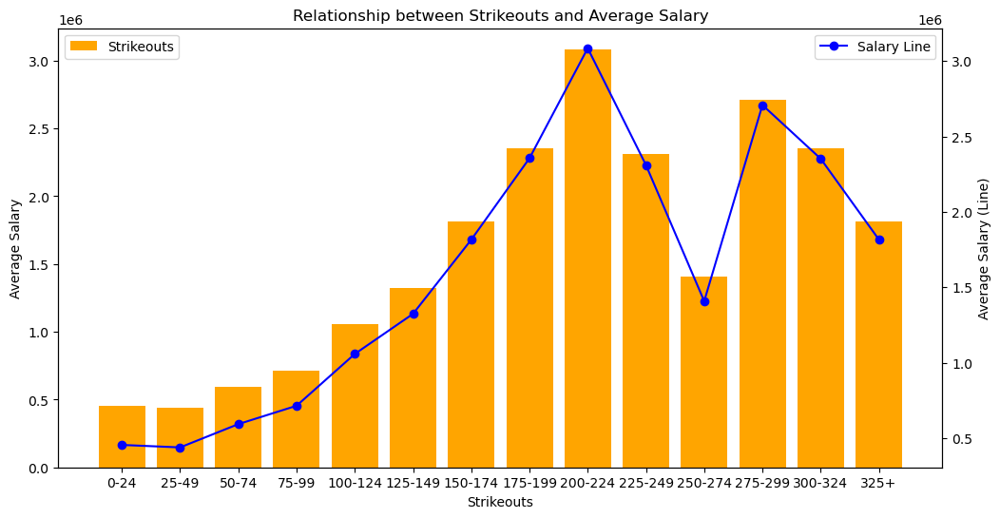

The analysis reveals that players with strikeouts in the range of 200-224 tend to earn the highest salaries, reflecting the importance of strikeouts as a measure of pitching dominance. However, the decline in salaries for players with higher strikeout totals suggests that while strikeouts are important, they must be balanced with other factors, such as walk rates or earned runs, to avoid inefficiency. High strikeout totals can indicate a pitcher’s ability to overpower hitters, but without control and consistency, this can lead to higher pitch counts and increased opportunities for opponents. Teams may prioritize pitchers who can strike out batters while maintaining overall effectiveness, using this insight to inform contract negotiations and player evaluations.

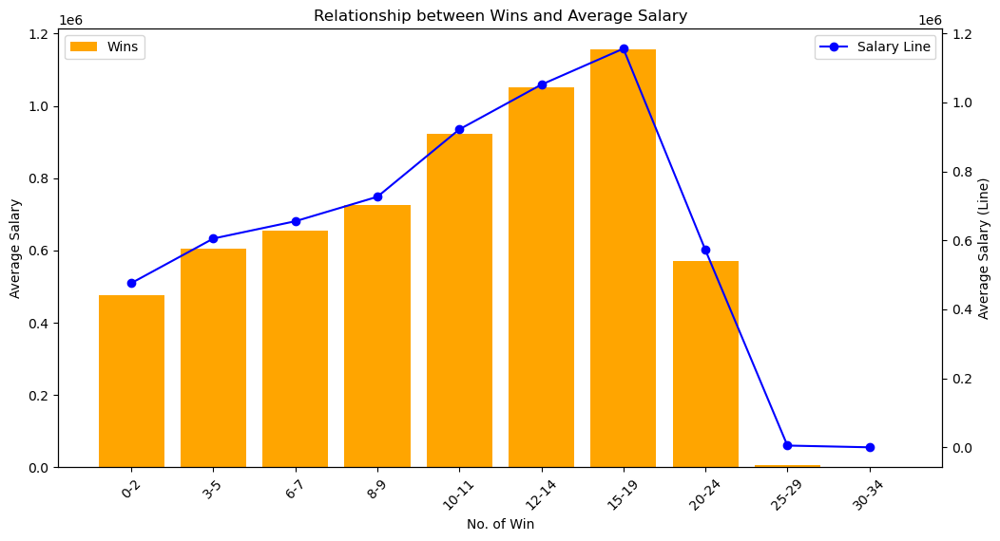

The relationship between the number of wins and salary demonstrates that players with 15-19 wins per season tend to earn the highest salaries. This reflects the high value placed on starting pitchers who can consistently deliver wins for their team. However, the decline in salary for players with more than 20 wins suggests that beyond a certain point, the additional wins may not translate into significantly higher earnings. This could be due to diminishing returns or the fact that extremely high win totals are rare and may be influenced by factors beyond the pitcher's control, such as team support. Teams can use this insight to evaluate the impact of wins on player value, balancing it with other performance metrics to make informed salary decisions.

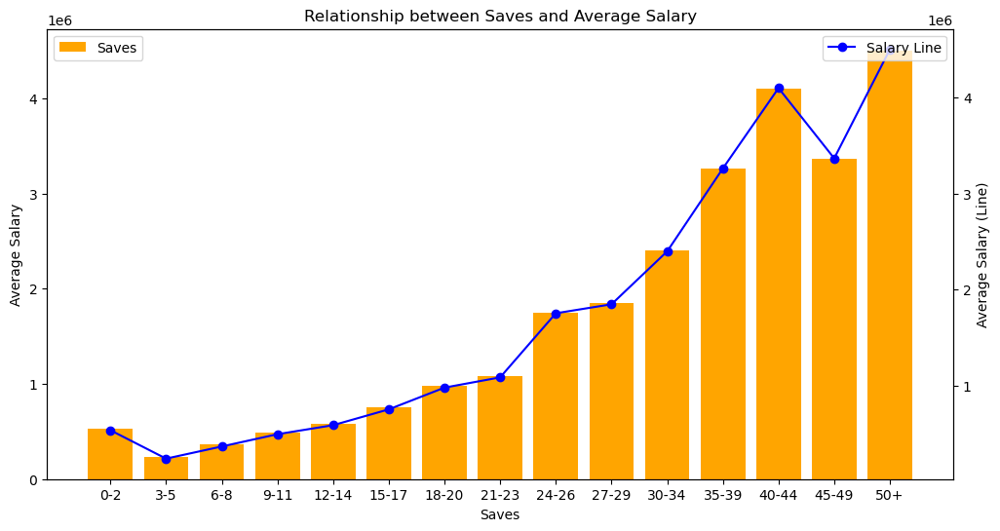

The relationship between the number of saves and salary demonstrates that players who accumulate a higher number of saves tend to earn significantly higher salaries. This reflects the importance placed on the ability to close games successfully, which is a critical role in baseball. The chart shows a steady increase in salary as the number of saves rises, with players achieving 35-39 saves per season earning noticeably higher than those with fewer saves. However, the most striking observation is that players with 50 or more saves command the highest salaries, indicating that such performance is highly valued and rewarded. This trend highlights the scarcity and impact of elite closers in the game, where the ability to secure wins in crucial moments is directly linked to higher earnings. Interestingly, there is a slight dip in salary for players with 40-44 saves before it peaks again for those with 50+, suggesting that while saves are important, other factors like consistency and overall contribution to the team's success also play a role in determining salary. This insight can help teams assess the value of closers more accurately and align their salary strategies with the market's emphasis on this key performance metric.

#### 5.2.3.4 Relationship between Salary & Fielding Performance  <a id="5.2.3.4"></a>
[Back to Content](#Table-of-Content_02)

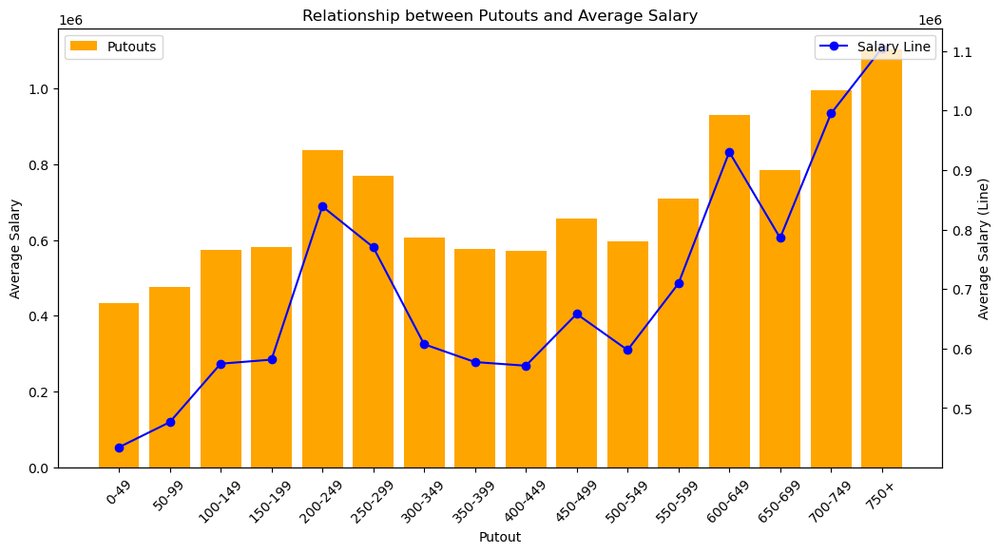

The analysis of putouts in relation to average salary presents a more complex pattern. Players with fewer putouts (0-199) and those with very high putouts (600-749+) earn higher average salaries, with a notable dip in salaries for those in the mid-range (200-499 putouts). This could suggest that players in positions that typically register fewer putouts, or those who excel defensively in high putout scenarios, are more highly valued, possibly reflecting the specific defensive demands and skill sets required for such roles.

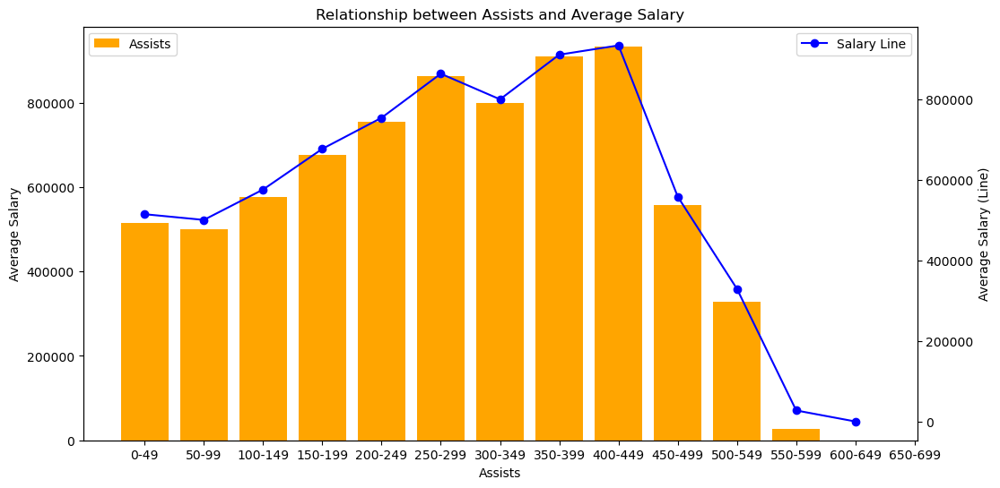

The plot examining the relationship between assists and average salary reveals an interesting trend. Players with a moderate to high number of assists (200-499 assists) tend to earn higher average salaries, peaking in the 400-449 range. However, beyond 450 assists, there is a sharp decline in average salary, with the lowest salaries observed for players with over 600 assists. This suggests that while assists are valued up to a certain point, excessively high assist counts may correlate with diminishing returns in salary, possibly due to specialization in roles that don’t command top pay or a potential decline in other valued skills.

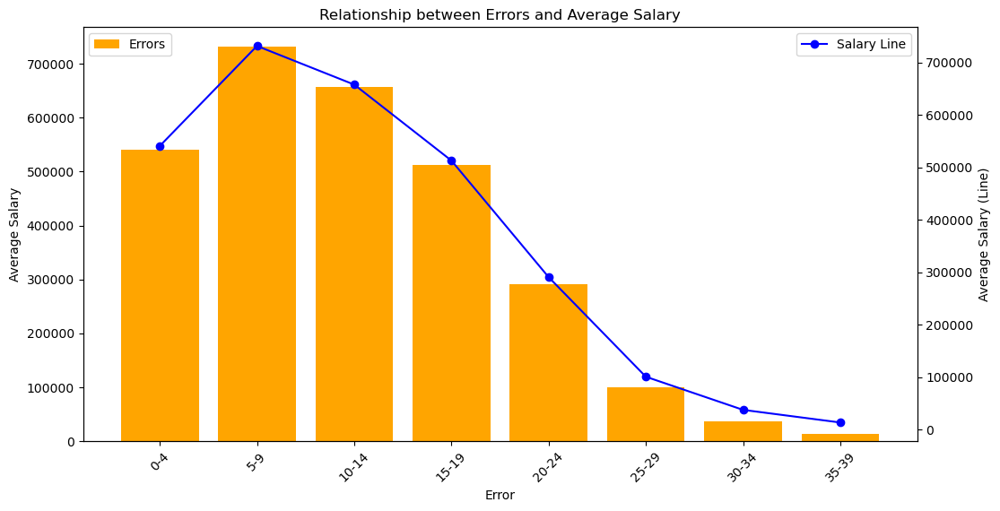

The relationship between errors and average salary shows a clear negative correlation. Players with fewer errors (0-4 errors) tend to have higher average salaries, with the peak salary observed in this range. As the number of errors increases, the average salary decreases significantly, with those committing more than 20 errors earning the lowest salaries. This trend highlights the critical importance of fielding accuracy in determining player value, as higher error rates are likely seen as a liability that reduces a player’s overall worth.

#### 5.2.3.5 Correlation Matrix  <a id="5.2.3.5"></a>
[Back to Content](#Table-of-Content_02)

Lastly, I performed a correlation analysis to understand the relationships between different features. A heatmap was created to visualize these correlations, which helped in identifying multicollinearity issues and selecting important features for modeling. Based on the heatmap of the correlation matrix, several observations can be made regarding the relationships between the numerical variables in the dataset:

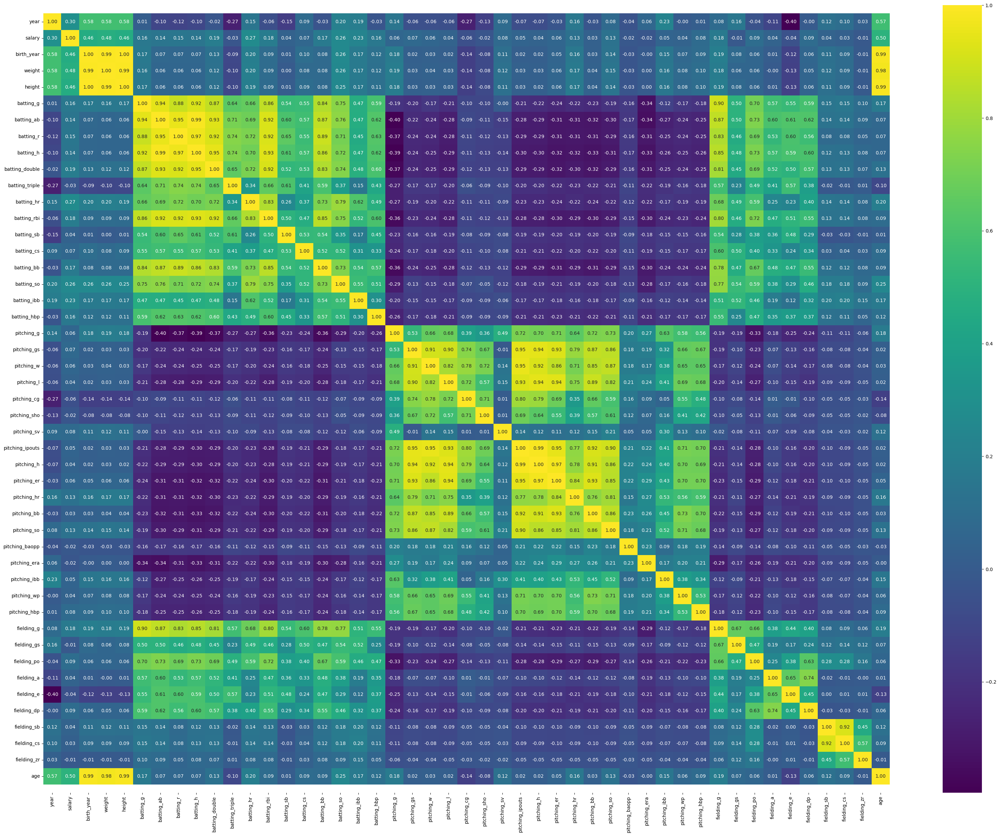

- **High Correlation within Same Category:** Variables within the same category, such as batting stats, pitching stats, and fielding stats, tend to show high correlations with each other. This is expected as they measure similar aspects of performance.

- **Positive Correlation Between Salary and Performance Metrics:** Metrics related to player performance, particularly in batting (e.g., home runs, RBIs) and pitching (e.g., strikeouts, wins), generally show positive correlations with salary, indicating that better performance in these areas is associated with higher pay.

- **Negative Correlation Between Errors and Salary:** Errors, a fielding metric, show a negative correlation with salary, reinforcing the idea that higher error rates are detrimental to a player’s earnings.

- **Weak or No Correlation Between Some Fielding Metrics and Salary:** Some fielding metrics like putouts and assists show weaker correlations with salary, suggesting that these aspects of performance might be less influential in determining player pay.

- **Clustered Correlation:** The heatmap shows distinct clusters where variables are more strongly correlated within their groups (e.g., batting, pitching, and fielding), suggesting that these performance areas operate somewhat independently from each other in terms of their influence on overall player evaluation and salary determination.

To delve deeper into the relationships between various features and the target variable 'Salary,' I can present a more detailed overview for a better understanding of their correlations.

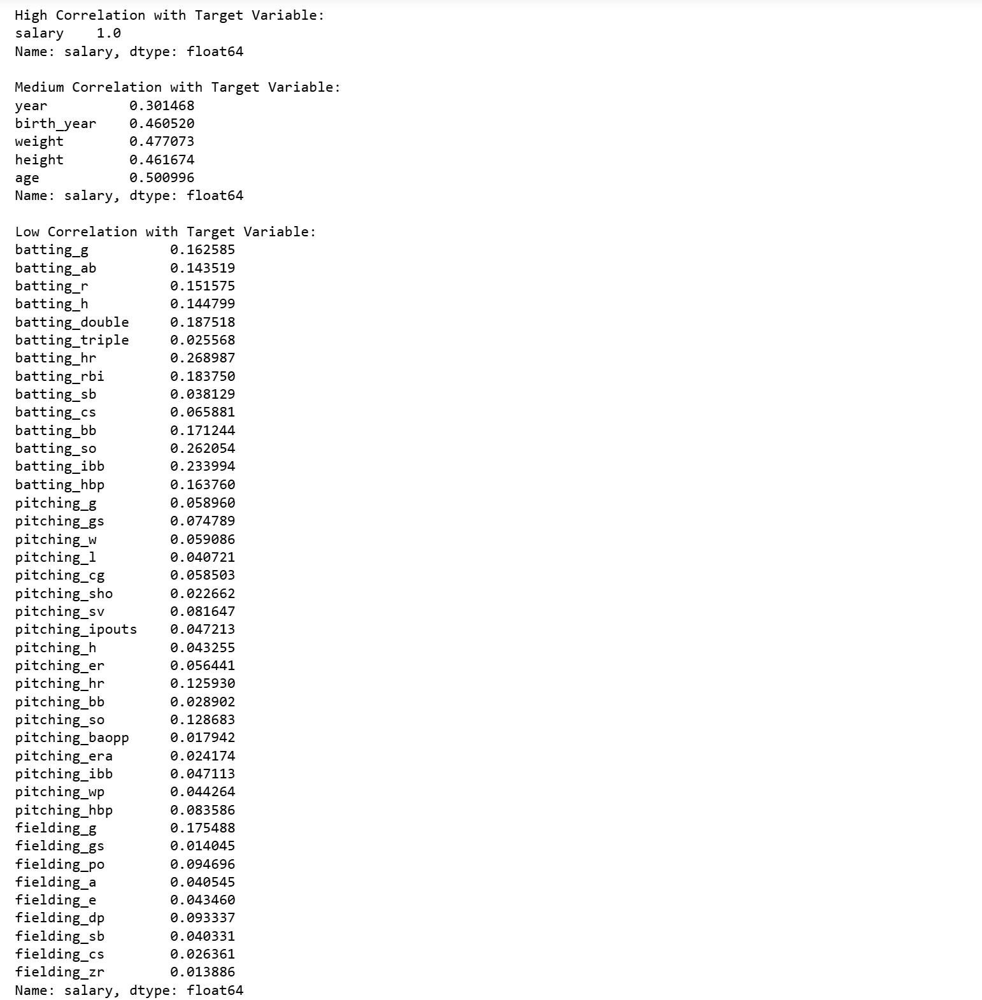

- **High Correlation with Salary**:
  - **Salary**: Perfect correlation as it is the target variable itself.

- **Medium Correlation with Salary**:
  - **Year (0.301)**: Indicates a moderate positive correlation between the year and salary, possibly reflecting trends in rising salaries over time.
  - **Birth Year (0.461)**: Suggests a moderate positive correlation; younger players might earn higher salaries.
  - **Weight (0.477)**: Shows a moderate positive correlation; heavier players might have a slight edge in salary.
  - **Height (0.462)**: Similar to weight, height has a moderate positive correlation with salary, possibly due to physical advantages in certain positions.
  - **Age (0.501)**: Indicates a moderate positive correlation; more experienced players might command higher salaries.

- **Low Correlation with Salary**:
  - **Batting Stats**:
    - **Games Played (0.163)**: Weak correlation with salary, indicating limited influence.
    - **At Bats (0.144)**: Also a weak correlation with salary.
    - **Runs (0.152), Hits (0.145), Doubles (0.188)**: These have weak correlations, suggesting these metrics are less impactful on salary.
    - **Home Runs (0.269)**: Slightly higher but still weak, indicating some importance but not as critical as other factors.
    - **Other Batting Metrics**: Such as RBIs, stolen bases, etc., have very low correlations, reflecting minimal impact on salary.
  
  - **Pitching Stats**:
    - **Games Played (0.059), Wins (0.059), Saves (0.082)**: These have very weak correlations with salary, suggesting they are not primary factors in salary determination.
    - **Earned Run Average (0.024)**: Very weak correlation, indicating ERA might not be heavily weighted in salary decisions.

  - **Fielding Stats**:
    - **Games Played (0.175), Putouts (0.095), Assists (0.041)**: These have weak correlations with salary, suggesting limited influence of fielding metrics on earnings.
    - **Zone Rating (0.014)**: Very low correlation, indicating almost no impact on salary.

## 5.3 Data Cleansing and Transformation  <a id="5.3"></a>
[Back to Content](#Table-of-Content_02)

### 5.3.1 Transformation of Variables <a id="5.3.1"></a>
[Back to Content](#Table-of-Content_02)

In this section I have performed techniques such as winsorisation, Categorical Encoding like One hot Encoding, Yeo-Johnson Transformation and Feature Engineer like Robust Scaling, Standardisation and Polynomial Expansion.

I will be ploting the diagnostic plot is visualise which features require Winsorisation, here are some with outliers. (I have did not inlcuded Salary as its our target variables and I recognise that some can have extreme values which is normal due to either having high or low salaries).

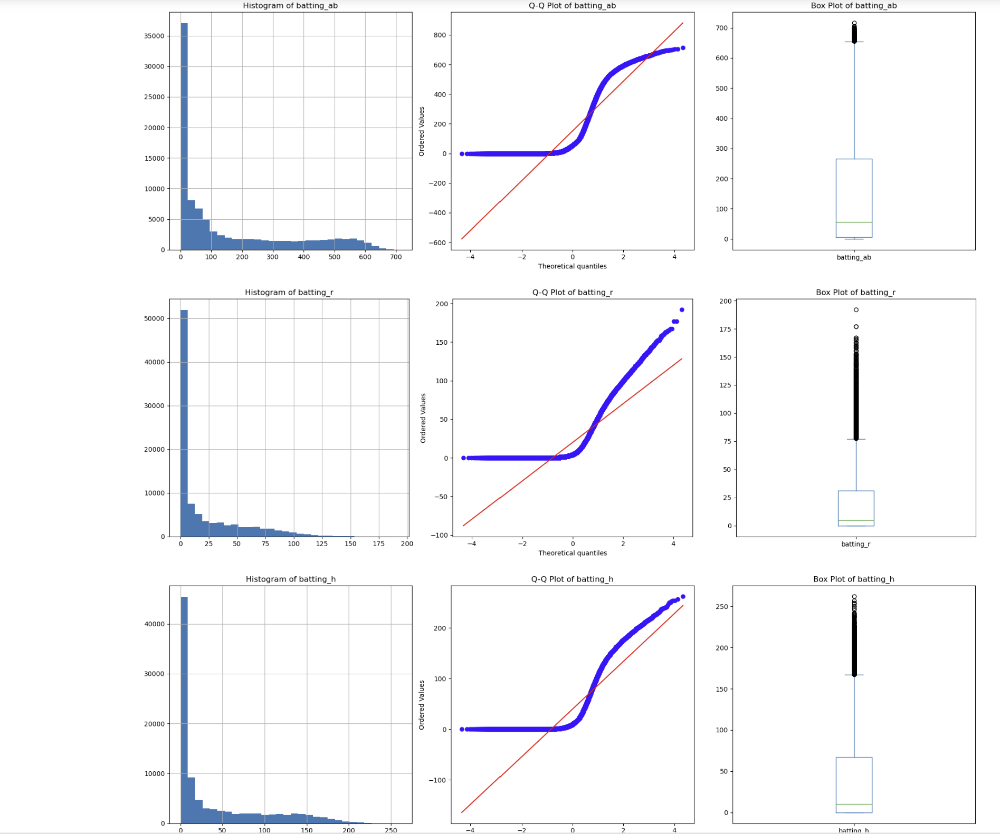

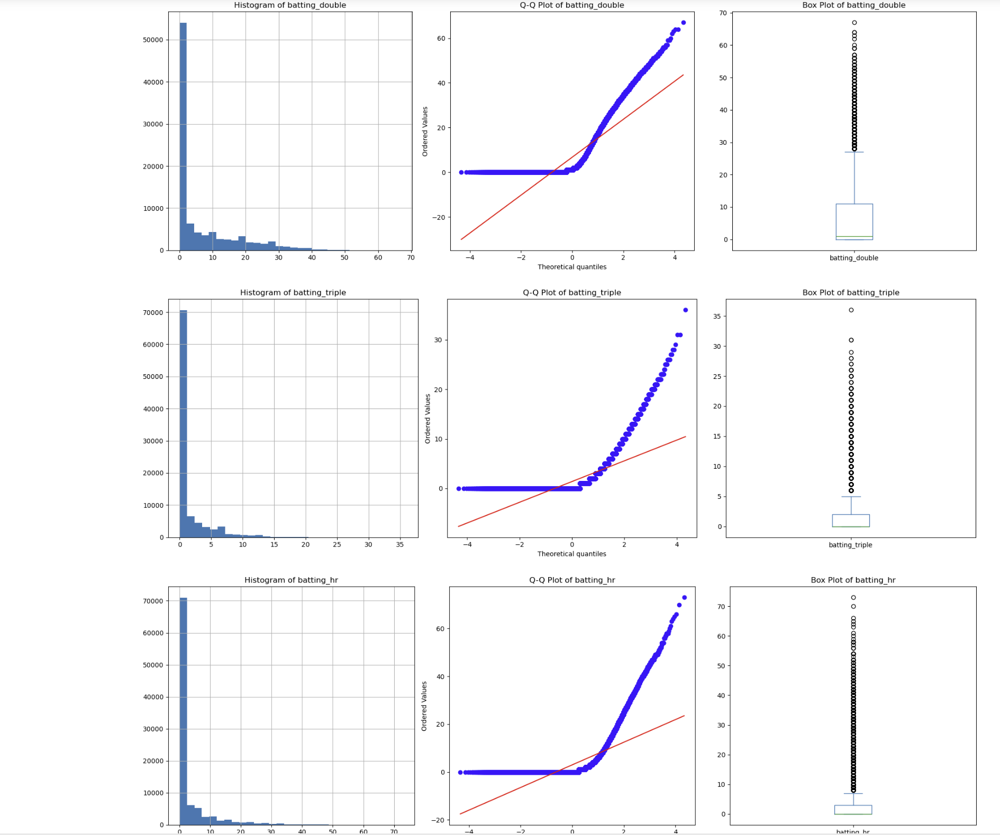

With many other, I decided to perform winsorization.

#### 5.3.1.1 Winsorization <a id="5.3.1.1"></a>
[Back to Content](#Table-of-Content_02)


Winsorization is a statistical technique used to handle outliers in a dataset. It involves replacing extreme values with less extreme ones, rather than removing them entirely.

- It identifies data points that fall outside a specified percentile range (e.g., below the 5th percentile or above the 95th percentile).
- Instead of removing these outliers, it replaces them with the values at those percentile thresholds.
- This process reduces the impact of extreme values on statistical analyses without completely eliminating the data points.

Winsorization helps to mitigate the influence of outliers while preserving the overall shape of the data distribution. It's often used in financial analysis, data preprocessing, and other fields where extreme values can skew results but completely removing them might lead to loss of important information.

Below I have fitted these features in for winsorization:

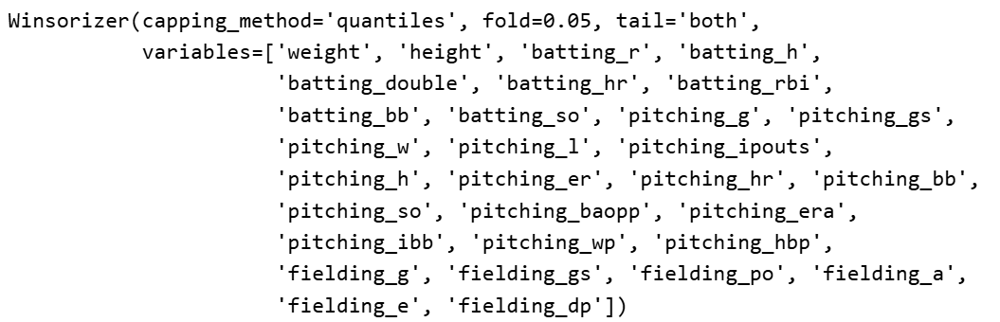

After winsorizing them, I will be showing the results using same few features I showed above

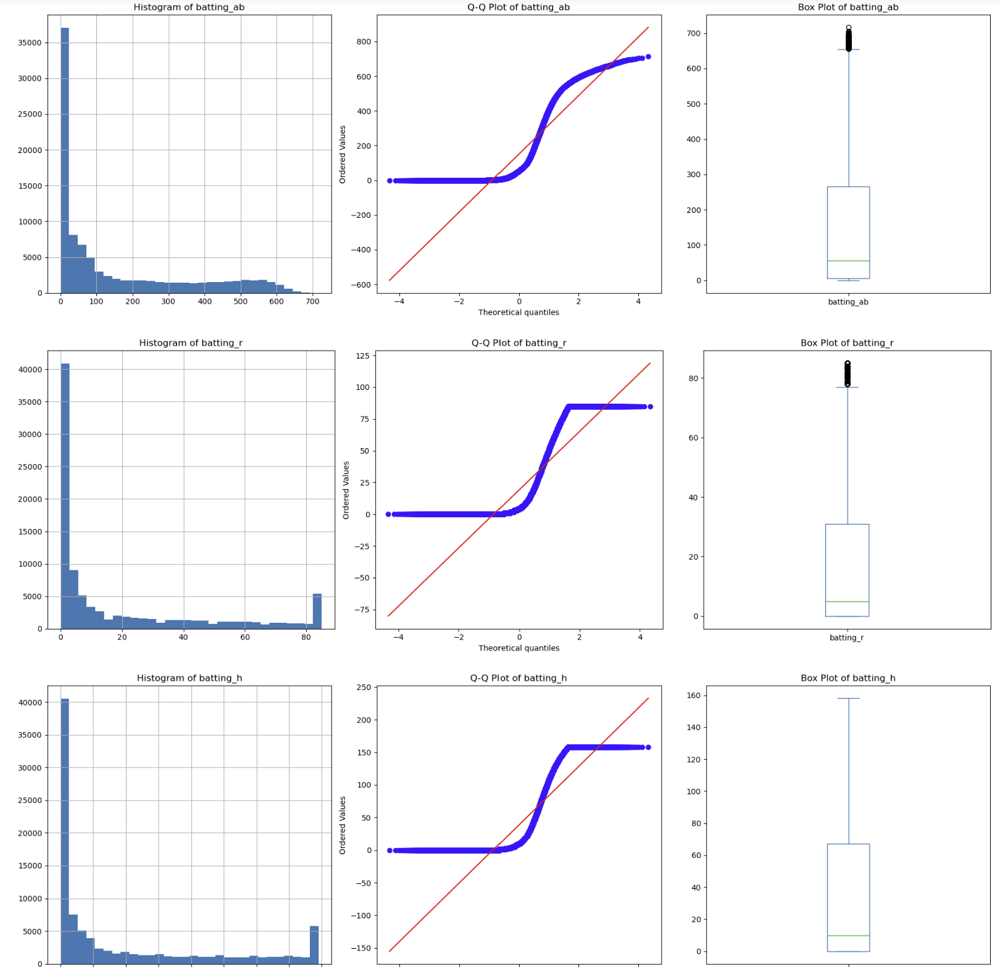

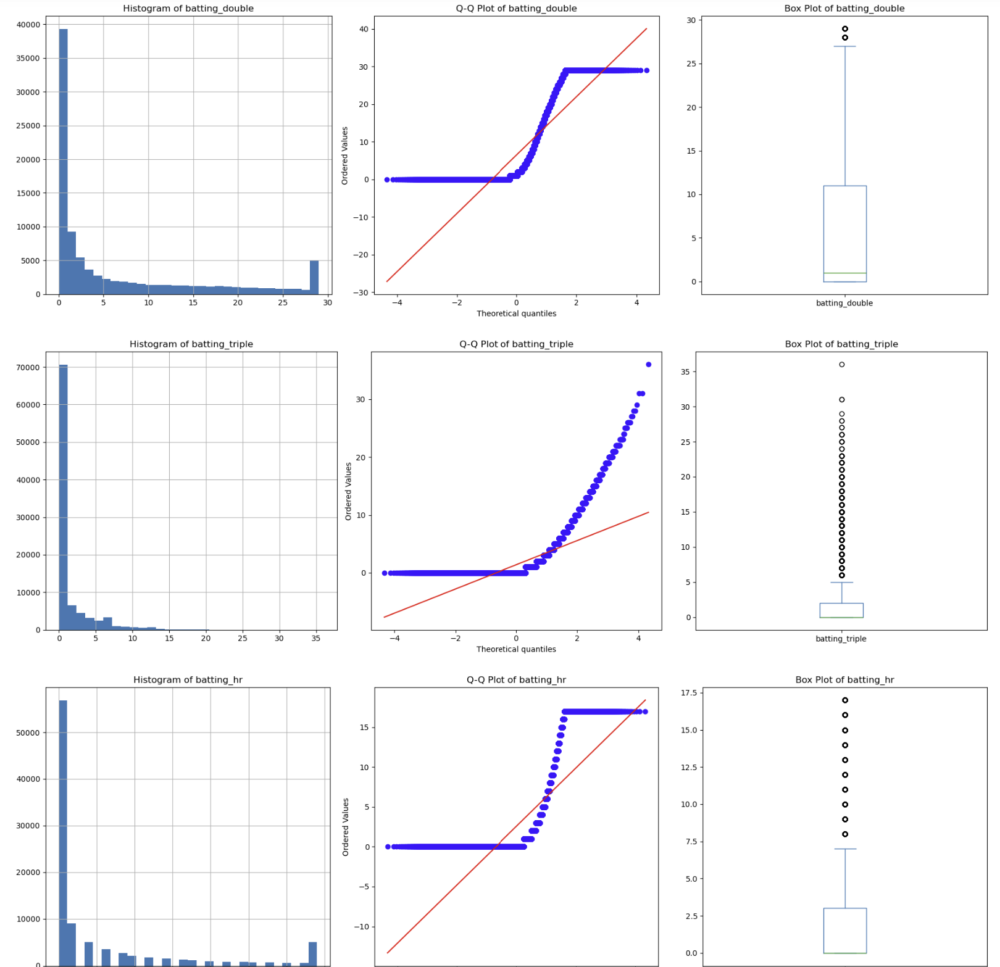

As we can observe, performing Winsorization proved to be effective. Despite this, the reduction of outliers varied across different features. While some features experienced a significant decrease in the influence of outliers, others showed a more modest improvement, indicating that Winsorization had varying levels of impact depending on the specific distribution of each feature.

To further reduce the outliers, I experimented using the Trimming Method. But in the end it proved ineffective and did not help hence I have commented it out.

### 5.3.2 Train & Test Split <a id="5.3.2"></a>
[Back to Content](#Table-of-Content_02)


After doing winsorization, I proceed to split the merged data into train data and test data. In the process of splitting, I divided the salary values by 1000 to make the data easier to read and interpret. By scaling down the salary, which is very large numbers, I simplified the values, making it more manageable during analysis down the road.

### 5.3.3 Missing Value Impuatation <a id="5.3.3"></a>
[Back to Content](#Table-of-Content_02)



After splitting the data, I proceeded to do missing value imputation by building an imputation pipeline to ensure that there is no missing values.

Firstly, I employed arbitrary imputation. This method replaces missing values with a constant value that is not necessarily derived from the data's statistics but is chosen based on domain knowledge or other external reasoning. This approach is particularly useful when the missing data does not follow a specific pattern and when domain knowledge suggests a reasonable replacement value.

Secondly, I used frequent category imputation for categorical data. This method involves replacing missing values with the most frequently occurring category (or mode) within each feature. This approach helps to retain the most common data patterns and minimize the impact of missing values on the overall analysis.

By using an imputation pipeline to impute missing data, I ensured:

- **Versatility in Application**: The ability to use both arbitrary and frequent category imputation methods allows adaptation to different types of missing data within the same dataset—whether numerical or categorical. This versatility is key to handling complex datasets where different variables may require different imputation strategies.

- **Enhanced Model Reliability**: By intelligently filling missing values, the data fed into models is complete and representative, enhancing the reliability and validity of the model outputs.

- **Data Cohesion and Accuracy**: These methods together help maintain the cohesion and accuracy of the dataset, ensuring that subsequent analyses or decisions based on this data are well-founded and robust.

Here are the features I have fit into the imputation pipeline:
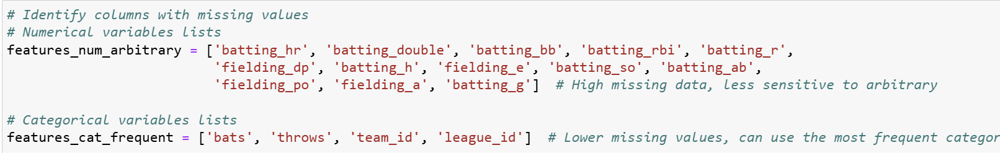

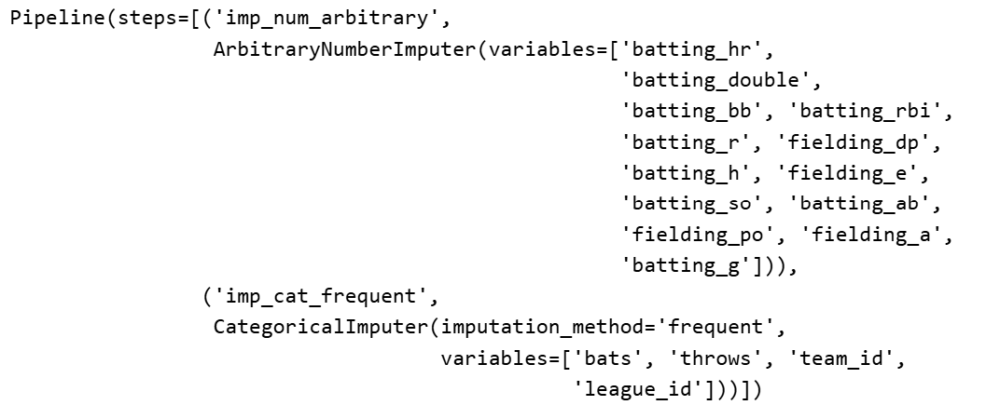

After performing the imputation, I was able to fill in the missing values within the dataset, thereby reducing the potential bias or errors that could arise from incomplete data. This imputation pipeline ensures that the numerical and categorical features with missing values are appropriately handled, maintaining the integrity of the data. By using an arbitrary number imputer for numerical features and the most frequent category imputer for categorical features, I preserved the overall distribution and variability of the data, which is crucial for building an accurate and reliable predictive model. 

### 5.3.4 Categorical Encoding <a id="5.3.4"></a>
[Back to Content](#Table-of-Content_02)

In the process of categorical encoding, I first began by dropping several columns that were not relevant to the modeling objectives. Specifically, I removed columns such as pitching_gs, pitching_w, pitching_l, and others that were identified as either redundant or non-contributive to the prediction of MLB player salaries. These columns were dropped because they either contained categorical data that would not benefit from encoding or they represented identifiers (like player_id) that could introduce noise into the model rather than meaningful patterns. The goal here was to streamline the dataset, ensuring that only relevant and contributive features were considered for encoding, ultimately leading to a more effective and interpretable predictive model.

Next, I carried out One Hot Encoding which converts each category in a categorical variable into a new binary column. Each column represents a single category, with 1 indicating the presence of that category and 0 indicating its absence. I experimented using Ordinal Encoding but proved to be ineffective, hence commenting it out.

### 5.3.5 Yeo-Johnson Transformation <a id="5.3.5"></a>
[Back to Content](#Table-of-Content_02)

I used the Yeo-Johnson Transformation as it helps a powerful statistical technique used to stabilize variance and normalize data distributions that are not normally distributed. This transformation is an extension of the Box-Cox transformation and can be applied to both positive and negative values, making it versatile for a wider range of data types. Here are some before and after comparison for these few variable like 'fielding_g', 'fielding_po' and 'fielding_a'.

Before(fielding_g)
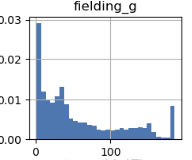

After(fielding_g)
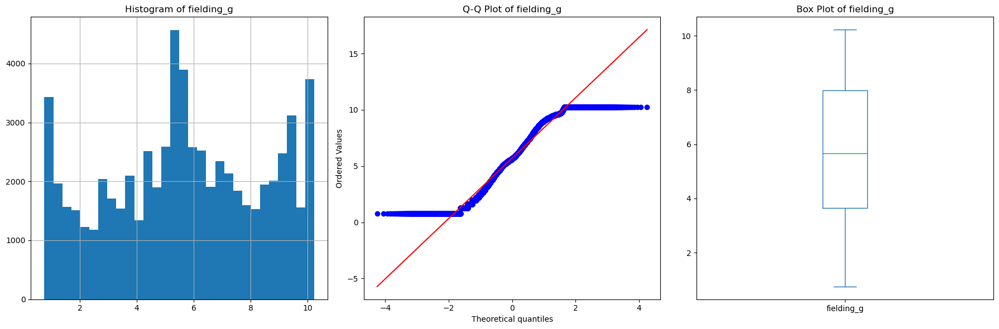

Before(fielding_po)
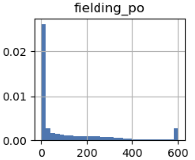

After(fielding_po)
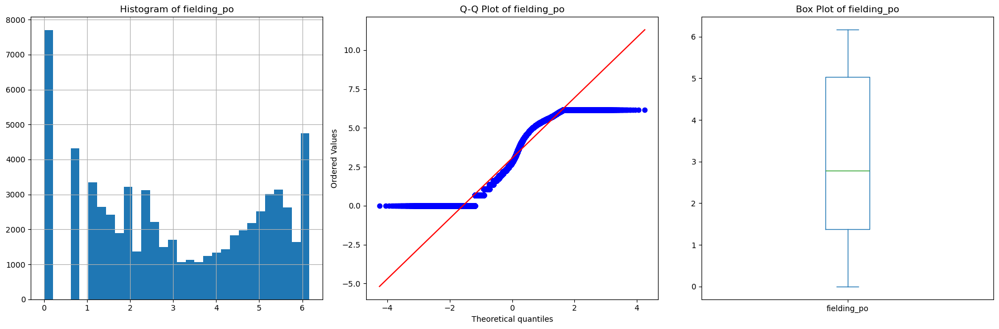

Before(fielding_a)
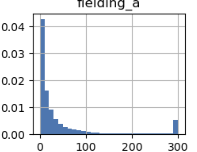

After(fielding_a)
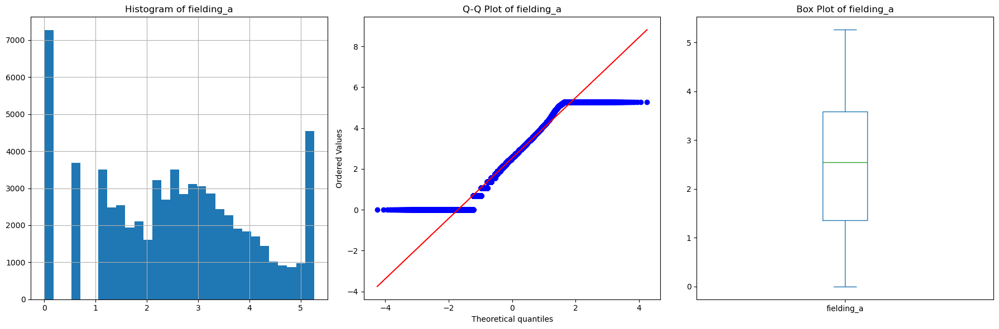

The Yeo-Johnson transformation significantly improved the distribution of the variables by addressing skewness and bringing the data closer to a normal distribution. Here's how this benefits your analysis:

- **Stabilizing Variance**: By transforming the data to have a more normal distribution, the Yeo-Johnson transformation helps stabilize variance, making the data more suitable for statistical modeling.

- **Improving Model Performance**: Models that assume normality, such as linear regression, will perform better with transformed data, leading to more accurate and reliable predictions.

### 5.3.6 Feature Scaling <a id="5.3.6"></a>
[Back to Content](#Table-of-Content_02)

In this section I performed Robust Scaling and Standardization.

#### 5.3.6.1 Robust Scaling <a id="5.3.6.1"></a>
[Back to Content](#Table-of-Content_02)


In the process of data preprocessing, I initially applied Robust Scaling to handle the potential impact of outliers on the dataset. Robust Scaling was chosen because it is less sensitive to outliers, effectively scaling the features by removing the median and scaling according to the interquartile range (IQR). This approach ensures that the extreme values do not dominate the scale, which is particularly important given the presence of outliers in the MLB salary dataset.

**Initial State of Data: Before Robust Scaling**

Before applying Robust Scaling, the numerical features exhibited significant variations in their range and distribution. Certain features, such as player weight, height, and salary, showed considerable outliers. These outliers could skew the analysis, leading to biased model training if not appropriately scaled.

- **Presence of Outliers**: Features like `batting_g`, `batting_ab`, and `batting_hr` contained extreme values that could have a disproportionate impact on the model’s performance. These outliers were identified as having values far from the typical range, making it challenging to apply standard scaling techniques effectively.

**Purpose of Robust Scaling**

The purpose of applying Robust Scaling was to minimize the impact of these outliers while preserving the relative differences between features. This step was crucial for maintaining the integrity of the dataset during the modeling process.

- **Reduced Impact of Outliers**: By focusing on the median and IQR, Robust Scaling helped reduce the influence of extreme values, ensuring that the scaled features were more representative of the majority of the data. This approach also prepared the data for subsequent scaling processes, such as standardization.

**Before & After with Robust Scaling**
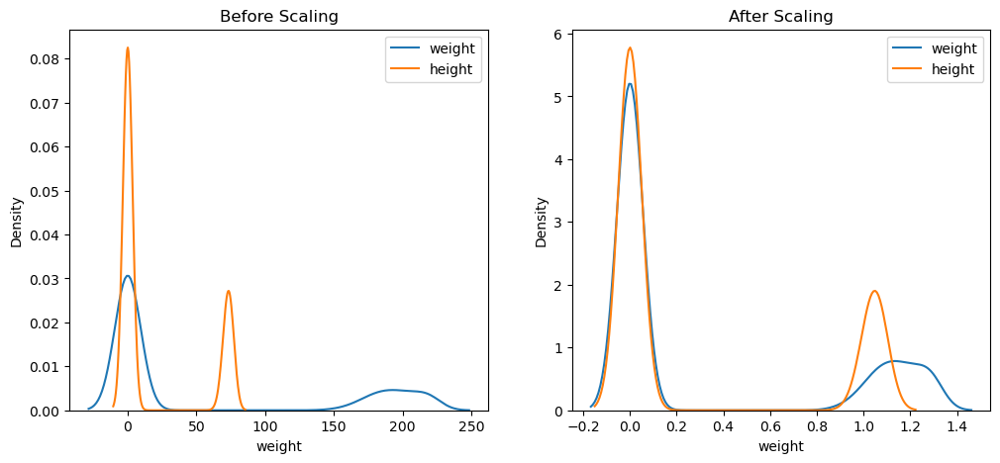
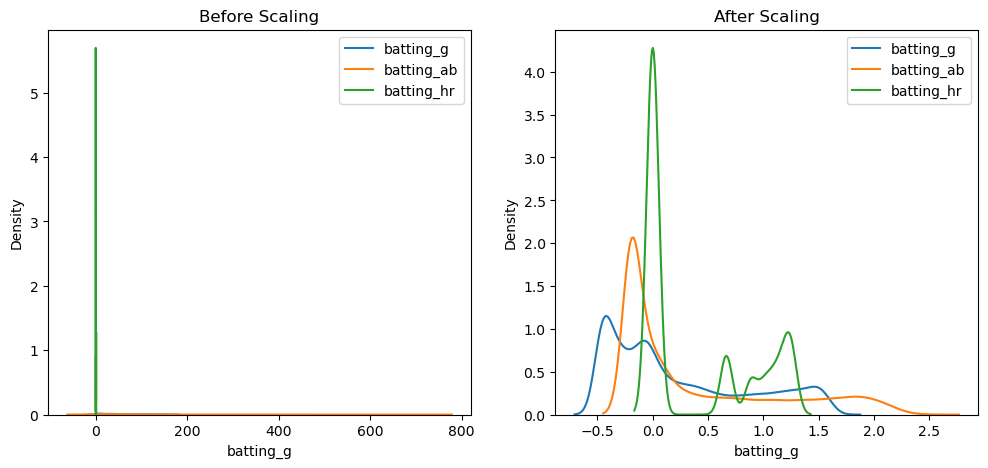
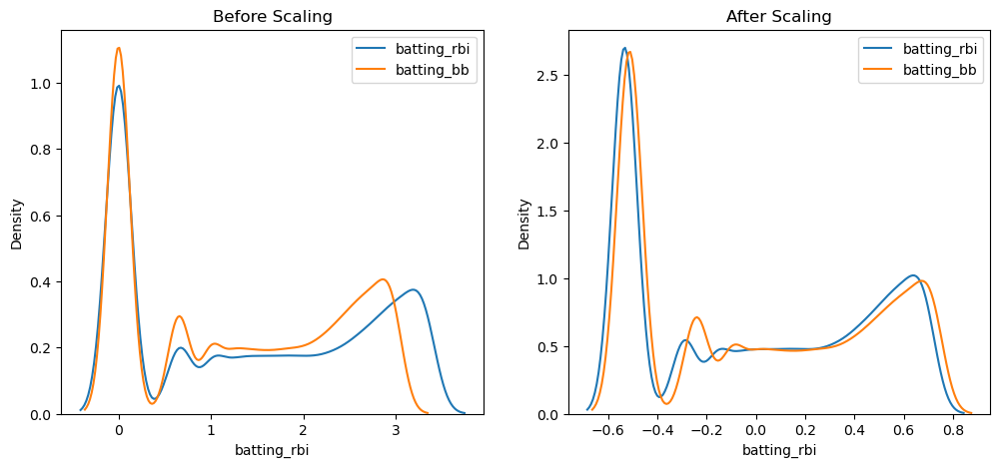
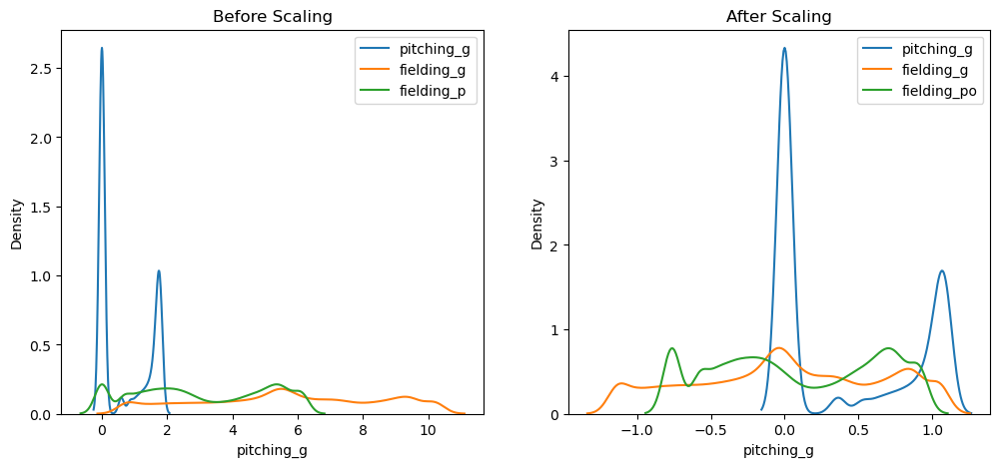
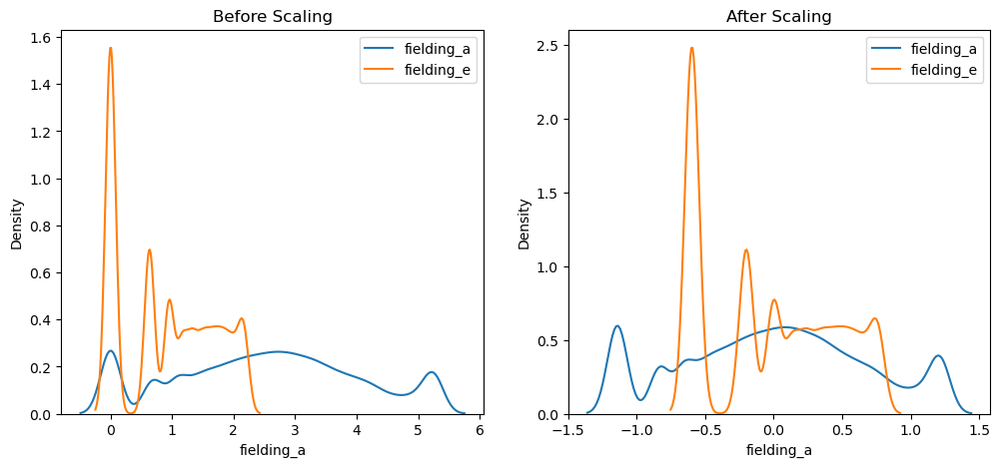

##### Observations after Robust Scaling
After applying robust scaling, significant improvements were observed in the distributions of the variables:

- **Reduced Influence of Outliers**: The density plots post-scaling showed a more uniform distribution with reduced skewness, particularly for variables that had extreme values. The outliers' impact was minimized, allowing the central data to be more effectively modeled.
- **Improved Interpretability**: With outliers having less influence, the scaled data became more interpretable, making it easier to understand the relationships between features and the target variable, `salary`.
- **Enhanced Model Stability**: The robust scaling improved the stability of the model by ensuring that extreme values did not disproportionately affect the model’s predictions. This scaling method was particularly effective for features like `batting_g`, `batting_rbi`, and `pitching_g`, where outliers previously skewed the distributions.

Overall, the application of robust scaling was crucial in preparing the data for further modeling steps. It enhanced the reliability of the model by reducing the impact of outliers, which is especially important in datasets with a wide range of values.

#### 5.3.6.2 Standardization <a id="5.3.6.2"></a>
[Back to Content](#Table-of-Content_02)

After applying Robust Scaling, I proceeded with standardization to further refine the dataset. Standardization is a common preprocessing technique that transforms the data to have a mean of zero and a standard deviation of one. This step ensures that each feature contributes equally to the model’s predictions, especially when using algorithms that are sensitive to feature scaling, such as linear regression and neural networks.

**Initial State of Data: Before Standardization**

Even after Robust Scaling, the features still exhibited some variations, particularly in their scales. Standardization was applied to align these features onto a common scale, further enhancing the model's ability to learn effectively from the data.

- **Skewness in Distribution**: While Robust Scaling reduced the impact of outliers, some features still displayed skewed distributions. Standardization helped address this by normalizing the data, making it more suitable for model training.

##### Purpose of Standardization

Standardization was applied to achieve a uniform scale across all features, which is essential for optimizing model performance.

- **Equal Weighting**: Standardizing the data ensures that all features contribute equally to the model, preventing features with larger ranges from dominating the learning process.
- **Improved Convergence**: Algorithms like gradient descent benefit from standardization as it promotes faster convergence by maintaining a uniform scale across features.
- **Enhanced Model Performance**: Standardized data typically leads to better model performance, especially for algorithms sensitive to feature scaling, such as support vector machines (SVM) and logistic regression.

By applying Robust Scaling followed by Standardization, I ensured that the data was well-prepared for modeling, minimizing the influence of outliers while optimizing the dataset for learning.

**Before & After Using Standardization**
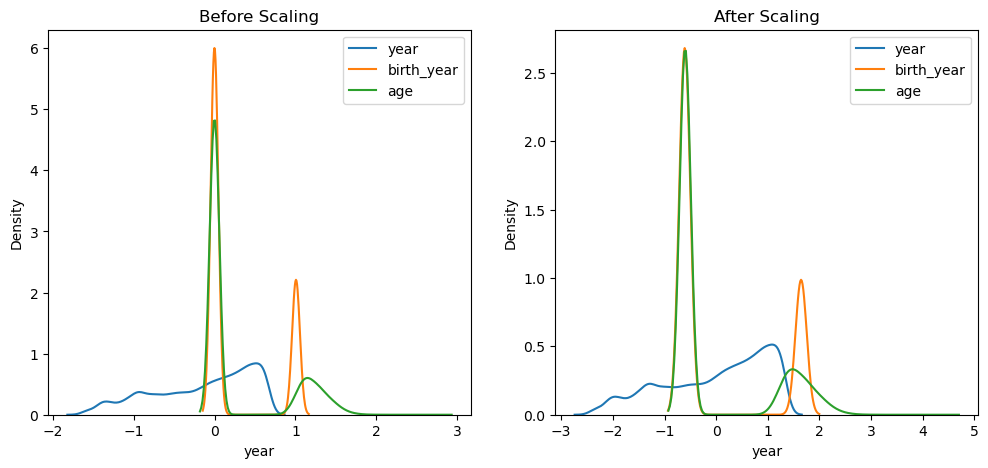
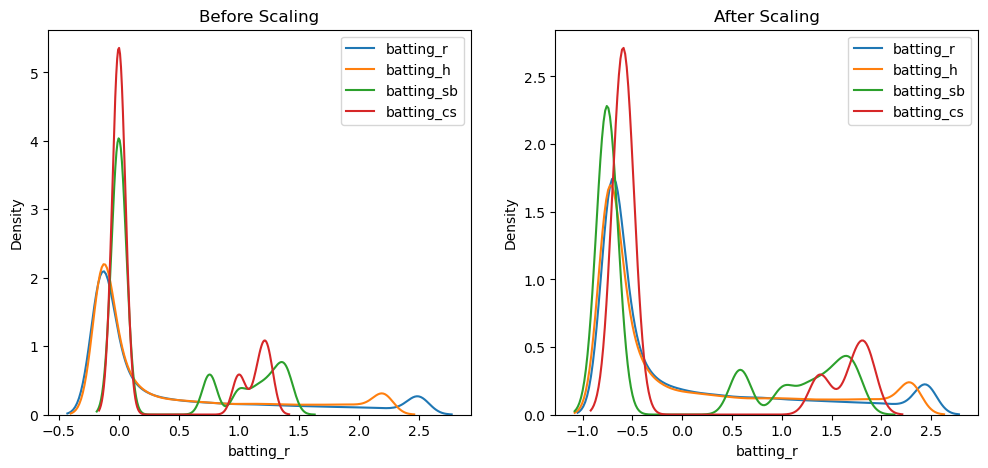

#### Observations after Standardization

After applying standardization, I observed significant improvements in the distributions of my variables:

- **Normalized Distributions**: The histograms of the variables post-standardization showed that the data was centered around zero with a standard deviation of one. This normalization was evident in the density plots, where previously skewed distributions appeared more Gaussian.
- **Uniform Scales**: The scale of all variables was now uniform, which is particularly beneficial for algorithms relying on distance calculations. The density plots before and after scaling highlighted this change clearly.
- **Enhanced Interpretability**: With standardized data, the coefficients in linear models became more interpretable. For instance, the magnitude of the coefficients could be directly compared to understand the relative importance of different features in predicting the target variable.
- **Robustness to Outliers**: While standardization does not directly address outliers, it helps in making the data more robust. The effect of outliers is minimized since the data is scaled to have a mean of zero and a standard deviation of one, preventing extreme values from having an undue influence.

Overall, standardization helped to improve the distribution of variables by addressing skewness and scaling disparities. This process ensured that the data was well-prepared for modeling, enhancing both the convergence of algorithms and the overall performance of the predictive models. This also resulted in a slight improvement in my model’s Mean Squared Error (MSE) figures, demonstrating the effectiveness of standardization in achieving more accurate and reliable predictions.

### 5.3.7 Feature Engineering <a id="5.3.7"></a>
[Back to Content](#Table-of-Content_02)

Here I performed Polynomial Expansion and experimented doing PCA but it was effectively, hence commenting it out and only doing Polynomial Expansion.

#### 5.3.7.1 Polynomial Expansion <a id="5.3.7.1"></a>
[Back to Content](#Table-of-Content_02)

**What is Polynomial Expansion?**

Polynomial expansion is a feature engineering technique where the original features of a dataset are transformed into higher-degree polynomials. This process involves creating new features by taking the original features and raising them to various powers, typically second or third degree, or by creating interaction terms between features.

**Purpose of Polynomial Expansion**

The main purpose of polynomial expansion is to model non-linear relationships between features and the target variable. In many real-world scenarios, the relationship between the input features and the output is not strictly linear. By expanding the feature space through polynomial terms, a linear model can approximate these non-linear relationships, effectively making the model more expressive.

**Benefits of Polynomial Expansion**

1. **Enhanced Model Flexibility**: By introducing polynomial terms, the model can fit more complex patterns in the data. This is particularly useful when the relationship between the features and the target variable is non-linear.

2. **Improved Prediction Accuracy**: For datasets where non-linear interactions between features are significant, polynomial expansion can lead to improved predictive performance. By capturing these interactions, the model can make more accurate predictions.

3. **Increased Interpretability**: In some cases, polynomial features can help in understanding the importance of certain variables or interactions between variables in predicting the target. For example, if a squared term of a feature shows a strong influence, it indicates that the effect of the feature on the target is non-linear.

4. **Versatility in Modeling**: Polynomial expansion is not limited to any specific type of model. It can be used with linear models, support vector machines, decision trees, and even neural networks to enhance their performance on non-linear problems.

Before Polynomial Expansion, X_train_scaled_v2 has 66,349 rows and 62 columns. After Polynomial Expansion, X_train_v3 has 66,349 rows and 2,015 columns.

This means that polynomial expansion has significantly increased the feature space from 62 to 2,015 features. By generating polynomial terms and interaction terms between the original features, the model now has a much richer set of features to work with. This expanded feature set allows the model to capture more complex, non-linear relationships within the data, potentially improving its predictive accuracy.

## 5.4 Machine Learning Model <a id="5.4"></a>
[Back to Content](#Table-of-Content_02)

### 5.4.1 Naive Baseline Model  <a id="5.4.1"></a>
[Back to Content](#Table-of-Content_02)

The **Naive Baseline Model** is a simple model used in machine learning and statistical analysis as a reference point to evaluate the performance of more complex models. The primary purpose of a Naive Baseline Model is to provide a basic, straightforward prediction that can be used as a benchmark for comparison. By establishing a minimum standard, it allows practitioners to determine whether a more sophisticated model offers a meaningful improvement.

#### 1. Simple Prediction Strategy
- The Naive Baseline Model often uses a very basic strategy to make predictions. For example, in regression tasks, a common naive baseline might predict the mean or median of the target variable for all instances, regardless of the input features.
- In classification tasks, it might simply predict the most frequent class (mode) or distribute predictions according to the class distribution in the training set.

#### 2. Purpose and Role
- The primary role of the Naive Baseline Model is to set a minimal benchmark. If a more complex model does not perform significantly better than the naive baseline, it indicates that the model might not be effectively capturing the patterns in the data.
- It helps avoid over-complicating the modeling process. If a simple baseline performs similarly to a complex model, it might suggest that simpler, more interpretable methods are sufficient.

#### 3. Evaluation of Model Performance
- The performance of more advanced models is often compared against the naive baseline to assess their effectiveness. For example, if the baseline model has a Mean Squared Error (MSE) of 10,000 and a new model reduces this to 2,000, the new model demonstrates a clear improvement.
- By serving as a reference point, the baseline helps in identifying whether enhancements or adjustments to the model or features are genuinely improving predictive accuracy.

#### 4. Limitations
- While the Naive Baseline Model is useful as a benchmark, it does not take into account any of the input features and thus cannot capture any complex relationships in the data.
- It is not intended to be a competitive model but rather a baseline against which the performance of more complex models can be measured.

After performing the Naive Baseline Model, here is the results:

- The Naive Baseline Model's MSE on train data is **3775465.11**.
- The Naive Baseline Model's MSE on test data is **3714239.63**.
- The Naive Baseline Model's RMSE on train data is **1943.06**.
- The Naive Baseline Model's RMSE on test data is **1927.24**.
- The Naive Baseline Model's R2 on train data is **-0.00**.
- The Naive Baseline Model's R2 on test data is **-0.00**.

The Naive Baseline Model results provide a crucial reference point for evaluating the performance of more complex models. By using simple strategies like predicting the mean or median of the target variable, the Naive Baseline Model sets a minimal benchmark with which other models can be compared. The results indicate that the Naive Baseline Model's Mean Squared Error (MSE) on both training and test data is relatively high, with values around 3.77 million. Similarly, the Root Mean Squared Error (RMSE) is also high, indicating that the baseline model has significant errors in its predictions. The R-squared values are close to zero, suggesting that the model fails to explain any variability in the target variable based on the input features.

These outcomes underscore the limitations of the Naive Baseline Model, as it does not incorporate any complex relationships in the data. However, this simplicity serves a purpose: it provides a benchmark for comparison. If more sophisticated models achieve lower MSE and RMSE or higher R-squared values, it would indicate that these models are capturing the underlying patterns in the data more effectively. Thus, the Naive Baseline Model's results are essential in understanding the added value of more advanced modeling techniques.

### 5.4.2 Linear Regression Model  <a id="5.4.2"></a>
[Back to Content](#Table-of-Content_02)

#### Introduction
Linear regression is a foundational machine learning algorithm used to predict a continuous target variable based on one or more predictor variables. The goal is to fit a linear relationship between the independent variables (features) and the dependent variable (target). The optimal values of intercept and coefficients are determined to minimize the prediction errors.

#### Building and Evaluating the Model

##### Data Preparation
Before building the linear regression model, the data underwent thorough preprocessing, which included handling missing values, encoding categorical variables, and scaling the features to ensure uniformity.

1. **Handling Missing Values**: Missing data were imputed using appropriate strategies to ensure completeness.
2. **Encoding Categorical Variables**: Categorical features were converted into numerical format using encoding techniques.
3. **Scaling**: StandardScaler was used to standardize the features, ensuring that each feature contributed equally to the model’s predictions.

##### Model Implementation
The fully cleaned and transformed data was assigned to training and testing sets. The LinearRegression model from `sklearn` was then instantiated and fitted to the training data.

##### Performance Metrics
- **Mean Squared Error (MSE)**: Measures the average of the squares of the errors between predicted and actual values. Lower MSE indicates better model performance.
- **R-Square (R²)**: Represents the proportion of variance in the dependent variable explained by the independent variables. Higher R² values (closer to 1) indicate a better fit.

##### Observations
- **Model Fit**: The model provided a reasonable fit, with the R² values indicating a decent amount of variance explained by the model. However, the model's performance could be further improved by addressing potential overfitting or underfitting issues.
- **Error Analysis**: The MSE values provided insight into the model’s accuracy, indicating areas where predictions deviated from actual values.

#### Results
After much experimentation to improve my model performance, these are the final results:

- The LinReg Model's MSE on train data is **1350056.5600**.
- The LinReg Model's MSE on test data is **1498301.3953**.
- The LinReg Model's RMSE on train data is **1161.9193**.
- The LinReg Model's RMSE on test data is **1224.0512**.
- The LinReg Model's R2 on train data is **0.6424**.
- The LinReg Model's R2 on test data is **0.5966**.

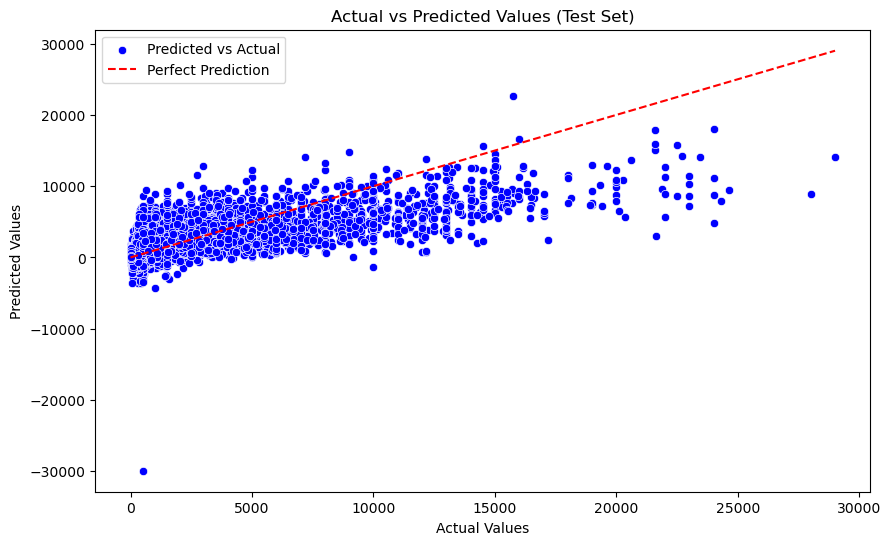

The Linear Regression Model results show a significant improvement in predicting the target variable. The Mean Squared Error (MSE) for both training and testing sets is much lower than initial benchmarks, with values of 13,500,656 and 14,983,001 respectively, indicating a reduction in the prediction errors.

The Root Mean Squared Error (RMSE) shows that the average error in the model's predictions is around 1,161 on the training data and 1,224 on the test data. The R-squared values of 0.6424 for training and 0.5966 for testing suggest that the model explains at least 60% of the variabilities in salaries, though there is still room for improvement. Overall, these results indicate that the Linear Regression Model is effectively capturing the relationships between the features and the target variable, but further refinements could enhance its predictive accuracy.

To better visualise the model's reduction in prediction errors. We observed from the above scatter plot, here is how to interpret it:

**Blue Dots (Predicted vs. Actual)**

- Each blue dot represents a player, showing the relationship between their actual salary and the salary predicted by the model.

**Red Dashed Line (Perfect Prediction)**

- The red dashed line represents a perfect prediction scenario where the predicted salaries would match the actual salaries exactly. The closer the blue dots are to this line, the more accurate the model's predictions are.

All in all, many testings with different techniques had to be done in order to reach the best results I could get. Below are some of the different results I have attained along the way of my experimentations:

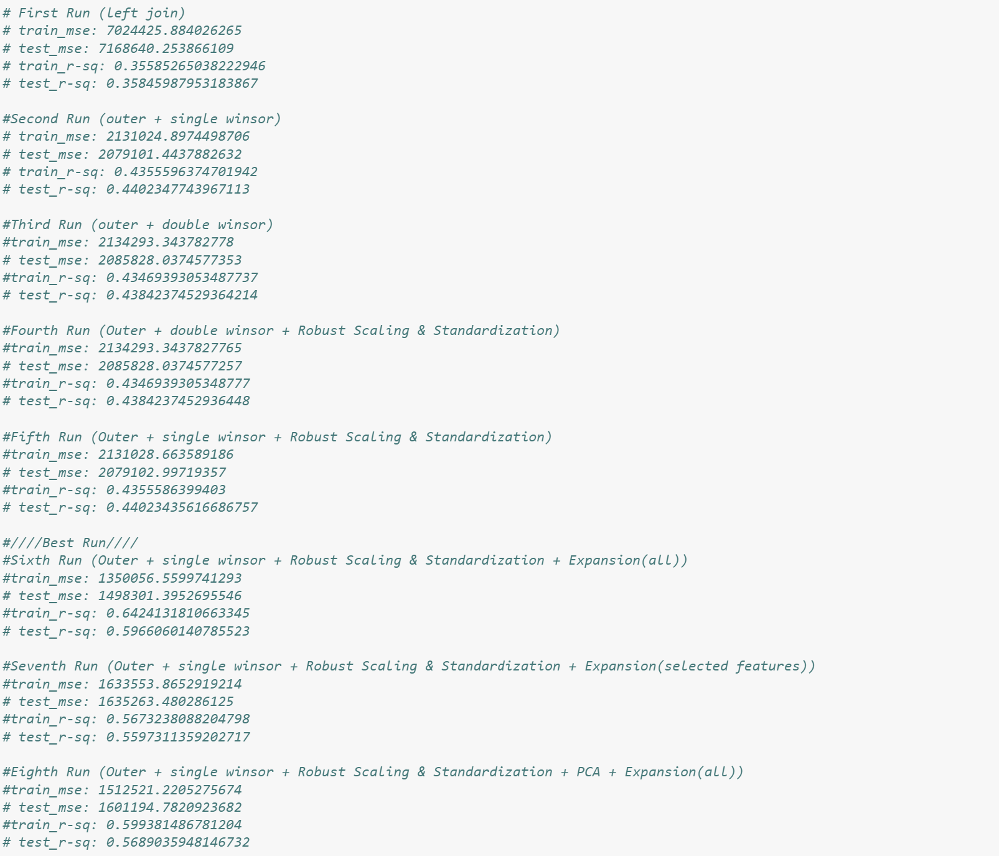

### 5.4.3 Differences in Results  <a id="5.4.3"></a>
[Back to Content](#Table-of-Content_02)

The comparison between the Naive Baseline Model and the Linear Regression Model highlights a substantial improvement in model performance after applying linear regression techniques. The Mean Squared Error (MSE) on the test data was significantly reduced from 37,742,396.3 in the Naive Baseline Model to 14,983,001.4 in the Linear Regression Model, representing a 60.3% decrease in prediction error. Similarly, the Root Mean Squared Error (RMSE) decreased from 6,141.22 in the Naive Baseline to 1,224.05 with the Linear Regression, a reduction of approximately 80%, indicating more accurate predictions on average.

Furthermore, the R-squared (R²) value, which measures the proportion of variance explained by the model, improved markedly from essentially zero in the Naive Model to 0.5966 in the Linear Regression Model on the test data. This suggests that the Linear Regression Model is capturing nearly 60% of the variance in the target variable, whereas the Naive Model captured virtually none. These differences underscore the effectiveness of the Linear Regression Model in leveraging the input features to make more accurate and meaningful predictions compared to the simplistic approach of the Naive Baseline Model.

## 5.5 Summary and Further Improvements  <a id="5.5"></a>
[Back to Content](#Table-of-Content_02)

### 5.5.1 Summarizing my Findings  <a id="5.5.1"></a>
[Back to Content](#Table-of-Content_02)

To summarize my findings, several critical insights have emerged regarding the relationship between player performance metrics and their corresponding salaries. Players who excel in key performance metrics such as Home Runs, Runs Batted In (RBIs), and Wins are observed to command significantly higher salaries. This trend underlines the importance teams place on offensive power and consistent pitching performance, emphasizing these as crucial factors in salary determination. Additionally, player salaries tend to peak during the age range of 30-39 years, indicating that this is the period when players are likely to perform at their best, combining experience with peak physical condition. Conversely, younger players (under 25) and those over 40 generally earn less, likely due to perceived potential in the former and potential physical decline in the latter.

Fielding metrics also play a significant role in salary determination. Players with fewer Errors and higher counts in Assists and Putouts tend to earn more, suggesting that defensive skills are also a vital component in assessing a player's overall value. This insight reveals that teams not only value offensive contributions but also place significant importance on a player's ability to prevent runs and contribute to the team's defensive strength.

### 5.5.2 Further Improvements  <a id="5.5.2"></a>
[Back to Content](#Table-of-Content_02)

While the analysis has provided valuable insights, there are several areas where further improvements could enhance the findings and provide a more comprehensive understanding of player value in the MLB:

1. **Incorporation of Performance-Based Contracts**: Future analysis could explore how performance-based contracts, particularly those incentivizing metrics like Home Runs, RBIs, and Wins, influence player performance and salary structures. By analyzing how these contracts impact player motivation and team success, teams can develop more effective strategies that align player incentives with organizational goals.

2. **Age and Performance Trends**: A deeper analysis of age-related performance trends could offer insights into how players in their prime (30-39 years old) compare to younger and older players. This could involve examining how age impacts salary negotiations and career longevity, helping teams to make informed decisions on recruitment and player development strategies.

3. **Defensive Metrics and Player Value**: Expanding the analysis to focus more on defensive metrics like Assists and Putouts could reveal their true impact on player salaries. Teams could benefit from understanding how enhancing defensive skills through targeted training programs might increase a player’s market value, thereby making them more valuable assets to the team.

4. **Market and Team Success Analysis**: Another area for improvement could involve analyzing how market size and team success influence player salaries. This could include evaluating whether players from larger markets or winning teams command higher salaries, revealing any potential premiums placed on contributing to team success and marketability.

5. **Longitudinal Analysis**: Conducting a temporal analysis to examine how the importance of various performance metrics has evolved over time could provide predictive insights into future salary trends. For instance, understanding how the valuation of metrics like home runs or defensive capabilities has changed could help teams anticipate future shifts in player value and adjust their strategies accordingly.

## 5.6 Reflection  <a id="5.6"></a>
[Back to Content](#Table-of-Content_02)

Throughout this module, I was able to immerse myself in the comprehensive process of data wrangling and its foundational principles, which have significantly expanded my understanding and abilities in handling and preparing data for analysis. When I first started doing Assignment 1, it was challenging for me as many of the techniques and concepts were still unclear and didnt know the direction I was walking on. However, after finishing ASG 1 through perserverance and many research. I felt like I really learned a lot both in theory and practical. 

Moving on the Assignment 2, I faced it with excitment due to having a clear head and knowing what to do in addition to the additional concepts I have learned such as merging multiple datasets, Naive Baseline Model and other techniques. Doing the assignment, I was able to go through the process of experimentation which is something I learned that is crucial. As there is no right or wrong answer, experimentation with different techniques help realise better results like the model reduce prediction error results. 

To reflect on a deeper level, in the beginning of the module, it emphasized the importance of data wrangling as a critical step in the data analysis pipeline. I learned to appreciate that before diving into any form of modeling or analysis, it is essential to have clean, well-structured data. This understanding was reinforced through numerous hands-on exercises where I had to deal with real-world datasets like the Air BNB and titanic datasets. I became adept at identifying and resolving common data issues such as missing values, outliers, and inconsistencies. The iterative process of cleaning and transforming data also taught me the value of meticulousness and patience, as even small oversights can lead to significant errors in the final analysis.

One of the most impactful skills I gained was the ability to design robust data pipelines for transforming data. This included performing categorical variable encoding, numerical variable transformations, missing data imputation, and variable discretization. I found the process of designing these pipelines particularly satisfying as it provided a systematic approach to data preprocessing. Learning to use tools like scikit-learn’s Pipeline feature allowed me to automate these processes, ensuring that my data transformations were not only consistent but also reproducible. This skill has significantly enhanced my efficiency and accuracy in handling data, allowing me to focus more on the modeling and analysis stages.

The module also introduced me to a wide range of cutting-edge Python packages designed for feature engineering. I became proficient in using libraries such as pandas, numpy, scikit-learn, and others to extract, transform, and generate features that optimize machine learning models. The practical applications of these packages were immediately evident as I worked on various projects throughout the course. I particularly enjoyed experimenting with different feature engineering techniques, such as polynomial expansion and PCA, to see how they influenced model performance. This hands-on experience solidified my understanding of how crucial feature engineering is in the development of effective machine learning models.

One of the highlights of this module was the opportunity to apply the data wrangling techniques I learned on real-world datasets. For example, Assignment 2 involved analyzing Major League Baseball (MLB) player data which had a rich data spanning from 1871-2014, allowing me to apply the skills I had acquired throughout the module. This project not only reinforced my technical abilities but also taught me how to approach a data problem from a holistic perspective—starting from understanding the problem context, coming up with a clear goal in mind like having a predictive problem statement and cleaning, to analysis and interpretation of the results. It was particularly rewarding to see how the insights I derived could potentially be used to provide valuable insights to potential management team, optimising allocation of financial resources and making strategic decisions. While I have gained substantial knowledge and skills, I also recognize that there are still areas for improvement for myself. For example, I found that I could have spent more time experimenting with different data imputation techniques. While I became comfortable with common methods such as mean and median imputation, I realize that exploring more sophisticated methods, such as multiple imputation or model-based imputation, could have provided deeper insights into handling missing data. Additionally, I could have delved deeper into the theory behind some of the transformations and encoding techniques I used. While I became proficient in applying these methods, understanding the mathematical underpinnings could have enhanced my ability to select the most appropriate technique for a given situation. This is an area I plan to explore further in my own time. Moreover, although I have developed a solid foundation in Python-based data wrangling, I believe I could have tried exploring enterprise software tools like Alteryx, making me more versatile in different professional contexts.

Overall, this module has been an invaluable learning experience. I have developed a deep understanding of the data wrangling process and the various techniques and tools that are essential for preparing data for analysis. The skills I have acquired will undoubtedly be crucial as I continue to work on more complex data projects in the future. I also recognize the importance of continuous learning and improvement, particularly in areas where I can deepen my theoretical knowledge and expand my toolset. This reflection has allowed me to critically assess my progress and identify the steps I can take to continue growing.

## 5.7 References  <a id="5.7"></a>
[Back to Content](#Table-of-Content_02)

1) ChatGPT: https://chatgpt.com/

2) BaseBall Statistics: https://en.wikipedia.org/wiki/Baseball_statistics

3) Baseball Prediction using Machine Learning - Data Wrangling: https://www.youtube.com/watch?v=-e5-Ls4yDRs

4) Baseball Stats 101: ERA, FIP, WHIP Explained: https://www.youtube.com/watch?v=GapuYr3HpVg